# Load Modules

In [1]:
import torch
import pyro
import pyro.distributions as dist
import matplotlib
import matplotlib.pyplot as plt
from torch.distributions.constraints import positive

import logging
import os

#import torch
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import pickle
import scipy

import pyro
import ssms
import lanfactory
#torch.set_default_dtype(torch.float64)
torch.set_default_dtype(torch.float32)

from lanfactory.trainers.torch_mlp import TorchMLP 

import lanfactory
import ssms

import arviz as az
import cloudpickle as cpickle
from bokeh.resources import INLINE
import bokeh.io
from bokeh import *
bokeh.io.output_notebook(INLINE)

Loading BokehJS ...

In [2]:
smoke_test = ('CI' in os.environ)
assert pyro.__version__.startswith('1.8.1')

pyro.enable_validation(True)
pyro.set_rng_seed(9)
logging.basicConfig(format='%(message)s', level=logging.INFO)

# Set matplotlib settings
%matplotlib inline
plt.style.use('default')

# Define DDM simulator

In [237]:
import ssms
def sim_wrap(theta = torch.zeros(0), model = 'ddm', n_samples = 1):
    theta = theta.squeeze()
    
    if theta.dim() == 3:
        out_list = []
        out_processed_list = []
        
        for i in range(theta.shape[0]):
            theta_tmp = theta[i, ...].numpy().astype(np.float32)
    
            out_tmp = ssms.basic_simulators.simulator(theta = theta_tmp,
                                                      model = model,
                                                      n_samples = n_samples,
                                                      delta_t = 0.001,
                                                      max_t = 20.0,
                                                      no_noise = False,
                                                      bin_dim = None,
                                                      bin_pointwise = False)
        
            out_processed_list.append(np.concatenate([out_tmp['rts'].astype(np.float32), 
                                                      out_tmp['choices'].astype(np.float32)], axis = -1))
            
        return np.stack(out_processed_list)
            
    elif theta.dim() == 2:
        theta_tmp = theta.numpy().astype(np.float32)
        out_tmp = ssms.basic_simulators.simulator(theta = theta_tmp,
                                                  model = model,
                                                  n_samples = n_samples,
                                                  delta_t = 0.001,
                                                  max_t = 20.0,
                                                  no_noise = False,
                                                  bin_dim = None,
                                                  bin_pointwise = False)
        return np.concatenate([out_tmp['rts'].astype(np.float32), 
                                                out_tmp['choices'].astype(np.float32)], axis = -1)
    else:
        raise NotImplementedError("theta should be of dimensionality 2 or 3 after squeezing")
        
    #print(out['rts'].shape)
    #print(np.concatenate([out['rts'].astype(np.float32), out['choices'].astype(np.float32)], axis = -1).shape)
    #return torch.tensor(np.concatenate([out['rts'].astype(np.float32), out['choices'].astype(np.float32)], axis = -1))

In [226]:
out = sim_wrap(theta = torch.randn(10, 4),
               model = 'ddm',
               n_samples = 500)

# Load torch network

In [242]:
class LoadTorchMLP:
    def __init__(self, 
                 model_file_path = None,
                 network_config = None,
                 input_dim = None):
        
        ##torch.backends.cudnn.benchmark = True
        self.dev = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
        self.model_file_path = model_file_path
        self.network_config = network_config
        self.input_dim = input_dim
        
        self.net = lanfactory.trainers.torch_mlp.TorchMLP(network_config = self.network_config,
                                                          input_shape = self.input_dim,
                                                          generative_model_id = None)
        self.net.load_state_dict(torch.load(self.model_file_path))
        self.net.to(self.dev)

    # AF-TODO: Seemingly LoadTorchMLPInfer is still not callable !
    @torch.no_grad()
    def __call__(self, x):
        return self.net(x)

    @torch.no_grad()
    def predict_on_batch(self, x = None):
        return self.net(torch.from_numpy(x).to(self.dev)).cpu().numpy()

In [243]:
class CustomTorchMLP:
    def __init__(self, state_dict, network_config):
        self.weights = []
        self.biases = []
        self.activations = deepcopy(network_config['activations'])
        self.net_depth = len(self.activations)
        self.state_dict = state_dict
        cnt = 0
        for obj in self.state_dict:
            if 'weight' in obj:
                self.weights.append(deepcopy(self.state_dict[obj]).T)
            elif 'bias' in obj:
                self.biases.append(torch.unsqueeze(deepcopy(self.state_dict[obj]), 0))
                
    def forward(self, input_tensor):
        tmp = input_tensor
        for i in range(0, self.net_depth - 1, 1):
            tmp = torch.tanh(torch.add(torch.matmul(tmp, self.weights[i]), self.biases[i]))
        tmp = torch.add(torch.matmul(tmp, self.weights[self.net_depth - 1]), self.biases[self.net_depth - 1])
        return tmp

In [244]:
class CustomTorchMLPMod(torch.nn.Module):
    def __init__(self, state_dict, network_config):
        super(CustomTorchMLPMod, self).__init__()
        self.weights = []
        self.biases = []
        self.activations = deepcopy(network_config['activations'])
        self.net_depth = len(self.activations)
        self.state_dict = state_dict
        cnt = 0
        for obj in self.state_dict:
            if 'weight' in obj:
                self.weights.append(deepcopy(self.state_dict[obj]).T)
            elif 'bias' in obj:
                self.biases.append(torch.unsqueeze(deepcopy(self.state_dict[obj]), 0))
        #super().__init
        
    def forward(self, input_tensor):
        tmp = input_tensor
        for i in range(0, self.net_depth - 1, 1):
            tmp = torch.tanh(torch.add(torch.matmul(tmp, self.weights[i]), self.biases[i]))
        tmp = torch.add(torch.matmul(tmp, self.weights[self.net_depth - 1]), self.biases[self.net_depth - 1])
        return tmp

In [245]:
# Model
from copy import deepcopy
model = "ddm" # for now only DDM (once we have choice probability models --> all models applicable)
model_config = ssms.config.model_config[model].copy() # convenience

In [246]:
# # Load torch net ----------------
network_config = pickle.load(open('nets/d27193a4153011ecb76ca0423f39a3e6_ddm_torch__network_config.pickle', 'rb'))

print(network_config)

# Initialize network class
torch_net = TorchMLP(network_config = network_config,
                     input_shape = len(model_config['params']) + 2,
                     generative_model_id = None)

# Load weights and biases
torch_net.load_state_dict(torch.load('nets/d27193a4153011ecb76ca0423f39a3e6_ddm_torch_state_dict.pt', 
                          map_location=torch.device('cpu')))

# Initialize custom pytorch network
# custom_torch_net = CustomTorchMLP(torch_net.state_dict(), 
#                                   network_config)

custom_torch_net = CustomTorchMLPMod(torch_net.state_dict(), 
                                     network_config)
custom_torch_net.eval()


{'layer_types': ['dense', 'dense', 'dense', 'dense'], 'layer_sizes': [100, 100, 100, 1], 'activations': ['tanh', 'tanh', 'tanh', 'linear'], 'loss': 'huber', 'callbacks': ['checkpoint', 'earlystopping', 'reducelr'], 'model_id': 'ddm'}
tanh
tanh
linear


CustomTorchMLPMod()

In [30]:
#torch_net(torch.zeros(100, 6))

## Define DDM Distribution

### Simulate Data

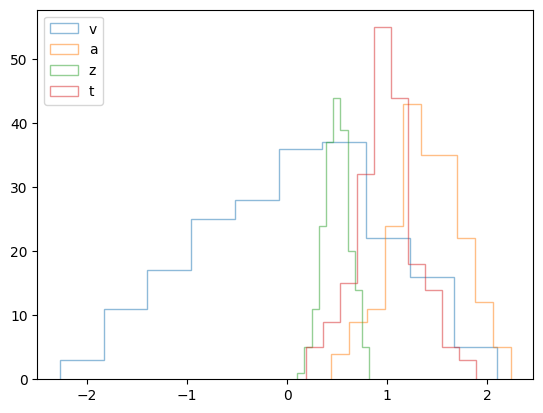

In [10]:
from scipy.stats import truncnorm
# Parameter recovery
n_samples_go = 1000 # total number of samples --> n_samples_go + n_samples_nogo = 2 * n_samples_go
n_parameter_samples = 200 # number of parameter vectors to samples and run the recovery over
std_denominator = 6 # a scaler for the standard deviation applied when sampling parameters in the allowed range

parameter_samples_dict = {}

for param in model_config["params"]:
    myclip_a = model_config["param_bounds"][0][model_config["params"].index(param)]
    myclip_b = model_config["param_bounds"][1][model_config["params"].index(param)]
    
    my_mean = myclip_a + (1/2) * (myclip_b - myclip_a)
    my_std = (myclip_b - myclip_a) / std_denominator
    
    a, b = (myclip_a - my_mean) / my_std, (myclip_b - my_mean) / my_std

    parameter_samples_dict[param] = truncnorm.rvs(a, 
                                                  b, 
                                                  loc = my_mean, 
                                                  scale = my_std, size = n_parameter_samples)

    plt.hist(parameter_samples_dict[param], alpha = 0.5, histtype = 'step', label = param)

plt.legend()

In [21]:
base_dim = 1
n_samples = 1000
v = torch.zeros(base_dim) + 0.5
a = torch.zeros(base_dim) + 1.5
z = torch.zeros(base_dim) + 0.5
t = torch.zeros(base_dim) + 0.5
theta = torch.vstack([v, a, z, t]).T
theta = theta.tile((n_samples, 1))
out = sim_wrap(theta = theta)
#theta = torch.hstack([theta, out])

## Define DDM - General Distribution

In [12]:
out

tensor([[ 1.0120,  1.0000],
        [ 1.7680,  1.0000],
        [ 6.1068, -1.0000],
        ...,
        [ 1.8070, -1.0000],
        [ 2.3180, -1.0000],
        [ 2.6400,  1.0000]])

### Simulate data

In [13]:
# base_dim = 1
# n_samples = 1000
# v = torch.zeros(base_dim) + 0.5
# a = torch.zeros(base_dim) + 1.5
# z = torch.zeros(base_dim) + 0.5
# t = torch.zeros(base_dim) + 0.5
# theta = torch.vstack([v, a, z, t]).T
# theta = theta.tile((n_samples, 1))
# out = sim_wrap(theta = theta)
# theta = torch.hstack([theta, out])

In [14]:
theta

tensor([[ 0.5000,  1.5000,  0.5000,  0.5000,  1.1010,  1.0000],
        [ 0.5000,  1.5000,  0.5000,  0.5000,  1.9340,  1.0000],
        [ 0.5000,  1.5000,  0.5000,  0.5000,  0.8710,  1.0000],
        ...,
        [ 0.5000,  1.5000,  0.5000,  0.5000,  2.6720,  1.0000],
        [ 0.5000,  1.5000,  0.5000,  0.5000,  1.1490,  1.0000],
        [ 0.5000,  1.5000,  0.5000,  0.5000,  2.5330, -1.0000]])

In [48]:
torch.tensor([0., 0., 0., 0.]).size()

torch.Size([4])

### Define DDM Model

In [23]:
import math
from numbers import Real
from numbers import Number

import torch
from torch.distributions import constraints
from torch.distributions.exp_family import ExponentialFamily
from torch.distributions.utils import _standard_normal, broadcast_all

network_config = pickle.load(open('nets/d27193a4153011ecb76ca0423f39a3e6_ddm_torch__network_config.pickle',
                                  'rb'))
network = lanfactory.trainers.torch_mlp.TorchMLP(network_config = network_config,
                                                 input_shape = 6)

network.load_state_dict(torch.load('nets/d27193a4153011ecb76ca0423f39a3e6_ddm_torch_state_dict.pt'))
network.eval()


class MyDDMCollapsed(dist.TorchDistribution):
    def __init__(self, params, network):
        self.net = network
        self.params = params
        
        # print(self.params.dim())
        # print(self.params.size())
        # print(type(params))
        if self.params.dim() == 1:
            batch_shape = torch.Size((1,))
        elif self.params.dim() > 1:
            batch_shape = self.params.size()[:-1]
            
        # print('batch shape')
        # print(batch_shape)
            
        super().__init__(batch_shape = batch_shape, event_shape = torch.Size((2, )), validate_args=False)
        
    def sample(self):
        #theta = torch.vstack([self.v, self.a, self.z, self.t]).T
        return sim_wrap(theta = params, model = 'ddm')
    
    def log_prob(self, value):
        # print('value')
        # print(value.size())

#         print('params')
#         print(self.params.dim)
#         print(self.params.shape)
        
#         print('value')
#         print(value.dim)
#         print(value.shape)
        
        if self.params.dim() == 1:
            tmp_params = self.params.tile(dims = (value.size()[0], 1))
            tmp_dat = value
        
        if self.params.dim() == 3:
            tmp_params = self.params.repeat_interleave(value.size()[0], -2)
            tmp_dat = value.repeat((self.params.size()[0], 1, 1))
        
        net_in = torch.cat([tmp_params, tmp_dat], dim = -1)
        
#         print('net in')
#         print(net_in.shape)
#         tmp_params2 = tmp_params.repeat_interleave(value.size()[0], -2)
        
#         if self.v.dim() == 2:
#             dat_tmp = value.repeat((self.v.size()[0], 1, 1))
#         else: 
#             dat_tmp = value

#         net_in = torch.cat([tmp_params2, dat_tmp], dim = -1)
        
        # Old
        logp = torch.clip(self.net(net_in), min = -16.11)      
        logp_squeezed = torch.squeeze(logp, dim = -1)
        return logp_squeezed

tanh
tanh
linear


In [ ]:
import math
from numbers import Real
from numbers import Number

import torch
from torch.distributions import constraints
from torch.distributions.exp_family import ExponentialFamily
from torch.distributions.utils import _standard_normal, broadcast_all

network_config = pickle.load(open('nets/d27193a4153011ecb76ca0423f39a3e6_ddm_torch__network_config.pickle',
                                  'rb'))
network = lanfactory.trainers.torch_mlp.TorchMLP(network_config = network_config,
                                                 input_shape = 6)

network.load_state_dict(torch.load('nets/d27193a4153011ecb76ca0423f39a3e6_ddm_torch_state_dict.pt'))
network.eval()


class MyDDM_new(dist.TorchDistribution):
    def __init__(self, params, network):
        self.net = network
        self.params = params
        
        # print(self.params.dim())
        # print(self.params.size())
        # print(type(params))
        if self.params.dim() == 1:
            batch_shape = torch.Size((1,))
        elif self.params.dim() > 1:
            batch_shape = self.params.size()[:-1]
            
        # print('batch shape')
        # print(batch_shape)
            
        super().__init__(batch_shape = batch_shape, event_shape = torch.Size((2, )), validate_args=False)
        
    def sample(self):
        #theta = torch.vstack([self.v, self.a, self.z, self.t]).T
        return sim_wrap(theta = params, model = 'ddm')
    
    def log_prob(self, value):
        # print('value')
        # print(value.size())

#         print('params')
#         print(self.params.dim)
#         print(self.params.shape)
        
#         print('value')
#         print(value.dim)
#         print(value.shape)
        
        if self.params.dim() == 1:
            tmp_params = self.params.tile(dims = (value.size()[0], 1))
            tmp_dat = value
        
        if self.params.dim() == 3:
            tmp_params = self.params.repeat_interleave(value.size()[0], -2)
            tmp_dat = value.repeat((self.params.size()[0], 1, 1))
        
        net_in = torch.cat([tmp_params, tmp_dat], dim = -1)
        
#         print('net in')
#         print(net_in.shape)
#         tmp_params2 = tmp_params.repeat_interleave(value.size()[0], -2)
        
#         if self.v.dim() == 2:
#             dat_tmp = value.repeat((self.v.size()[0], 1, 1))
#         else: 
#             dat_tmp = value

#         net_in = torch.cat([tmp_params2, dat_tmp], dim = -1)
        
        # Old
        logp = torch.clip(self.net(net_in), min = -16.11)      
        logp_squeezed = torch.squeeze(logp, dim = -1)
        return logp_squeezed

In [12]:
# import math
# from numbers import Real
# from numbers import Number

# import torch
# from torch.distributions import constraints
# from torch.distributions.exp_family import ExponentialFamily
# from torch.distributions.utils import _standard_normal, broadcast_all

# network_config = pickle.load(open('nets/d27193a4153011ecb76ca0423f39a3e6_ddm_torch__network_config.pickle',
#                                   'rb'))
# network = lanfactory.trainers.torch_mlp.TorchMLP(network_config = network_config,
#                                                  input_shape = 6)

# network.load_state_dict(torch.load('nets/d27193a4153011ecb76ca0423f39a3e6_ddm_torch_state_dict.pt'))
# network.eval()


# network = torch_net

class MyDDMc(dist.TorchDistribution):
    def __init__(self, v = 0, a = 0, z = 0, t = 0):
        self.net = network
        self.net_rep_n = 1
        self.v = v 
        self.a = a
        self.z = z
        self.t = t
        #print(v)
        if isinstance(v, Number):
            batch_shape = torch.Size()
        else:
            batch_shape = self.v.size()
            if not self.v.size() == torch.Size([]):
                self.net_rep_n = batch_shape[0]
                
        super().__init__(batch_shape = batch_shape, event_shape = torch.Size((2,)), validate_args=False)
        
    def sample(self):
        theta = torch.vstack([self.v, self.a, self.z, self.t]).T
        return sim_wrap(theta = theta, model = 'ddm')
    
    def log_prob(self, value):
        tmp_params = torch.stack([self.v, self.a, self.z, self.t], dim = -1)
        
        if self.v.dim() == 0:
            tmp_params = tmp_params.unsqueeze(0)
        
        tmp_params2 = tmp_params.repeat_interleave(value.size()[0], -2)
        
        if self.v.dim() == 2:
            dat_tmp = value.repeat((self.v.size()[0], 1, 1))
        else: 
            dat_tmp = value

        net_in = torch.cat([tmp_params2, dat_tmp], dim = -1)
        
        # Old
        logp = torch.clip(self.net(net_in), min = -16.11)      
        logp_squeezed = torch.squeeze(logp, dim = -1)
        return logp_squeezed

In [13]:
MyDDMc(**{'v': 0.0, 
          'a': 1.0, 
          'z': 0.5, 
          't': 0.3})

In [24]:
model_config = ssms.config.model_config['ddm']

def ddm_model_collapsed(num_trials, model_config, network, data):
    params = pyro.sample("params", dist.Uniform(low = torch.tensor(model_config['param_bounds'][0]),
                                                high = torch.tensor(model_config['param_bounds'][1])).to_event((1)))
    
    with pyro.plate("data", num_trials) as data_plate:
        return pyro.sample("obs", MyDDMCollapsed(params, network), obs = data)

In [17]:
# help(dist)

In [33]:
def ddm_collapsed_guide(num_trials, model_config, network, data):
    params_locs = pyro.param('params_locs', lambda:torch.tensor([0., 1., 0.5, 0.5]),
                             constraint = constraints.interval(torch.tensor([-3., 0.3, 0.1, 0.0]), torch.tensor([3., 2.5, 0.9, 2.0])))
    params_cov = pyro.param('cov_params', lambda:torch.eye(4, 4) * 0.01,
                            constraint = constraints.positive_definite)
    
    #with pyro.plat("data", num_trials) as data_plate:
    params = pyro.sample("params", dist.MultivariateNormal(loc = params_locs, covariance_matrix = params_cov))
    
    return {'params_locs': params_locs,
            'params_cov': params_cov,
            'params': params}
    

In [ ]:
def hierarchical_ddm_guide(num_subjects, num_trials, data):
    # Initialize the parameters:
    # ----------------
    # Global mus
    v_mu_mu_loc = pyro.param('v_mu_mu_loc', lambda:torch.tensor(0.),
                             constraint = constraints.interval(-3, 3))
    v_mu_mu_scale = pyro.param('v_mu_mu_scale', lambda:torch.tensor(0.02),
                               constraint = constraints.positive)
    
    a_mu_mu_loc = pyro.param('a_mu_mu_loc', lambda:torch.tensor(1.),
                             constraint = constraints.interval(0.3, 2.5))
    a_mu_mu_scale = pyro.param('a_mu_mu_scale', lambda:torch.tensor(0.02),
                               constraint = constraints.positive)
    
    z_mu_mu_loc = pyro.param('z_mu_mu_loc', lambda:torch.tensor(0.5),
                             constraint = constraints.interval(0.1, 0.9))
    z_mu_mu_scale = pyro.param('z_mu_mu_scale', lambda:torch.tensor(0.02),
                               constraint = constraints.positive)
    
    t_mu_mu_loc = pyro.param('t_mu_mu_loc', lambda:torch.tensor(0.5),
                             constraint = constraints.interval(0.0, 2.0))
    t_mu_mu_scale = pyro.param('t_mu_mu_scale', lambda:torch.tensor(0.02),
                               constraint = constraints.positive)
    
    # Global stds
    v_mu_std_scale = pyro.param('v_mu_std_scale', lambda:torch.tensor(1/100),
                                constraint = constraints.positive)
    v_mu_std_concentration = pyro.param('v_mu_std_concentration', lambda:torch.tensor(10.),
                                        constraint = constraints.positive)
    
    a_mu_std_scale = pyro.param('a_mu_std_scale', lambda:torch.tensor(1/100),
                                constraint = constraints.positive)
    a_mu_std_concentration = pyro.param('a_mu_std_concentration', lambda:torch.tensor(10.),
                                        constraint = constraints.positive)
    
    z_mu_std_scale = pyro.param('z_mu_std_scale', lambda:torch.tensor(1/100),
                                constraint = constraints.positive)
    z_mu_std_concentration = pyro.param('z_mu_std_concentration', lambda:torch.tensor(10.),
                                        constraint = constraints.positive)
    
    t_mu_std_scale = pyro.param('t_mu_std_scale', lambda:torch.tensor(1/100),
                                constraint = constraints.positive)
    t_mu_std_concentration = pyro.param('t_mu_std_concentration', lambda:torch.tensor(10.),
                                        constraint = constraints.positive)
    
    # 
    
    # subj_mus
    #
    v_subj_mu_loc = pyro.param('v_subj_mus', 
                                  lambda:torch.rand(num_subjects) - torch.tensor(0.5),
                                  constraint = constraints.interval(-3, 3))
    
    v_subj_mu_scale = pyro.param('v_subj_scales', 
                                    lambda:torch.ones(num_subjects) + \
                                    (torch.rand(num_subjects) - torch.tensor(0.5)) / 5,
                                    constraint = constraints.positive)

    
    a_subj_mu_loc = pyro.param('a_subj_mus', 
                                  lambda:(torch.rand(num_subjects) - 0.5) + 1.5,
                                  constraint = constraints.interval(0.3, 2.5))
    a_subj_mu_scale = pyro.param('a_subj_scales', 
                                    lambda:torch.ones(num_subjects) + \
                                    (torch.rand(num_subjects) - 0.5) / 5,
                                    constraint = constraints.positive)
    
    z_subj_mu_loc = pyro.param('z_subj_mus', 
                                  lambda:(torch.rand(num_subjects) / 5) + 0.3,
                                  constraint = constraints.interval(0.1, 0.9))
    z_subj_mu_scale = pyro.param('z_subj_scales', 
                                    lambda:torch.ones(num_subjects) / 50,
                                    constraint = constraints.positive)
    
    t_subj_mu_loc = pyro.param('t_subj_mus', 
                                  lambda:torch.rand(num_subjects),
                                  constraint = constraints.interval(0., 2.))
    t_subj_mu_scale = pyro.param('t_subj_scales', 
                                    lambda:torch.ones(num_subjects) + \
                                    (torch.rand(num_subjects) - 0.5) / 5,
                                    constraint = constraints.positive)
                                    
    
    # ---------------
    
    # Specify the actual variational distributions
    # ----------------
                                    
    # print(v_mu_mu_loc)                 
    # print(v_mu_mu_scale)
    
    v_mu_mu = pyro.sample("v_mu_mu", 
                          dist.Normal(v_mu_mu_loc, v_mu_mu_scale))
    v_mu_std = pyro.sample("v_mu_std", 
                           dist.Gamma(v_mu_std_concentration, 1 / v_mu_std_scale))
    
    # print(v_mu_mu_loc)
    # print(v_mu_mu_scale)
    
    a_mu_mu = pyro.sample("a_mu_mu", 
                          dist.Normal(a_mu_mu_loc, a_mu_mu_scale))
    a_mu_std = pyro.sample("a_mu_std", 
                           dist.Gamma(a_mu_std_concentration, 1 / a_mu_std_scale))
    
    z_mu_mu = pyro.sample("z_mu_mu", 
                          dist.Normal(z_mu_mu_loc, z_mu_mu_scale))
    z_mu_std = pyro.sample("z_mu_std", 
                           dist.Gamma(z_mu_std_concentration, 1 / z_mu_std_scale))
    
    # print(z_mu_mu_loc)
    # print(z_mu_mu_scale)
    
    t_mu_mu = pyro.sample("t_mu_mu", 
                          dist.Normal(t_mu_mu_loc, t_mu_mu_scale))
    t_mu_std = pyro.sample("t_mu_std", 
                           dist.Gamma(t_mu_std_concentration, 1 / t_mu_std_scale))
    
    
    with pyro.plate("subjects", num_subjects) as subjects_plate:
        subj_v_mu = pyro.sample("v_subj", dist.Normal(v_subj_mu_loc, v_subj_mu_scale))
        subj_a_mu = pyro.sample("a_subj", dist.Normal(a_subj_mu_loc, a_subj_mu_scale))
        subj_z_mu = pyro.sample("z_subj", dist.Normal(z_subj_mu_loc, z_subj_mu_scale))
        subj_t_mu = pyro.sample("t_subj", dist.Normal(t_subj_mu_loc, t_subj_mu_scale))
    
    
    return {"v_mu_mu": v_mu_mu,
            "v_mu_std": v_mu_std,
            "v_subj": subj_v_mu,
            "a_mu_mu": a_mu_mu,
            "a_mu_std": a_mu_std,
            "a_subj": subj_a_mu,
            "z_mu_mu": z_mu_mu,
            "z_mu_std": z_mu_std,
            "z_subj": subj_z_mu,
            "t_mu_mu": t_mu_mu,
            "t_mu_std": t_mu_std,
            "t_subj": subj_t_mu,
           }
    # ----------------
    
    # 
    

In [16]:
def ddm_model(num_trials, data):
    v = pyro.sample("v", dist.Uniform(-3, 3))
    a = pyro.sample("a", dist.Uniform(0.3, 2.5))
    z = pyro.sample("z", dist.Uniform(0.1, 0.9))
    t = pyro.sample("t", dist.Uniform(0.0, 2.0))
    # print(v)
    # print(a)
    # print(t)
    # print(z)
    with pyro.plate("data", num_trials) as data_plate:
        return pyro.sample("obs", MyDDMc(v, a, z, t), obs = data)

In [ ]:
def ddm_model_new(num_trials, data, network):
    v = pyro.sample("v", dist.Uniform(-3, 3))
    a = pyro.sample("a", dist.Uniform(0.3, 2.5))
    z = pyro.sample("z", dist.Uniform(0.1, 0.9))
    t = pyro.sample("t", dist.Uniform(0.0, 2.0))
    
    with pyro.plate("data", num_trials) as data_plate:
        return pyro.sample("obs", MyDDMc(v, a, z, t), obs = data)

In [17]:
def ddm_model_refac(num_trials, model_config, data):
    
    param_dict = {}
    for param_str in model_config['params']:
        param_idx = model_config['params'].index(param_str)
        exec((param_str + ' = pyro.sample("' + param_str + '", dist.Uniform(' + str(model_config['param_bounds'][0][param_idx]) + ', ' + \
             str(model_config['param_bounds'][1][param_idx]) + '))'))
        
        # print((param_str + ' = pyro.sample("' + param_str + '", dist.Uniform(' + str(model_config['param_bounds'][0][param_idx]) + ', ' + \
        #      str(model_config['param_bounds'][1][param_idx]) + '))'))
        exec('param_dict[param_str] = ' + param_str)
    # print(param_dict)
    with pyro.plate("data", num_trials) as data_plate:
        return pyro.sample("obs", MyDDMc(**param_dict), obs = data)

In [30]:
def my_fun(model_config = ''):
    param_dict = {}
    for param_str in model_config['params']:
        param_idx = model_config['params'].index(param_str)
        exec((param_str + ' = pyro.sample("' + param_str + '", dist.Uniform(' + str(model_config['param_bounds'][0][param_idx]) + ', ' + \
             str(model_config['param_bounds'][1][param_idx]) + '))'))
        exec('param_dict[param_str] = ' + param_str)
        
    with pyro.plate("data", num_trials) as data_plate:
        return pyro.sample("obs", MyDDMc(**param_dict), obs = data)
    # print(param_dict)
    # return 

In [153]:
my_fun(model_config = ssms.config.model_config['ddm'])

{'v': tensor(0.6269), 'a': tensor(0.5563), 'z': tensor(0.5087), 't': tensor(1.7597)}


In [144]:
exec('myvar = 3')

In [149]:
ssms.config.model_config['ddm']['params'][0]"

'v'

In [175]:
model_config

{'name': 'ddm',
 'params': ['v', 'a', 'z', 't'],
 'param_bounds': [[-3.0, 0.3, 0.1, 0.0], [3.0, 2.5, 0.9, 2.0]],
 'boundary': <function ssms.basic_simulators.boundary_functions.constant(t=0)>,
 'n_params': 4,
 'default_params': [0.0, 1.0, 0.5, 0.001],
 'hddm_include': ['z'],
 'nchoices': 2}

In [39]:
#auto_guide = pyro.infer.autoguide.AutoMultivariateNormal(ddm_model)
#auto_guide_refac = pyro.infer.autoguide.AutoMultivariateNormal(ddm_model_refac)
auto_guide_collapsed = pyro.infer.autoguide.AutoMultivariateNormal(ddm_model_collapsed)

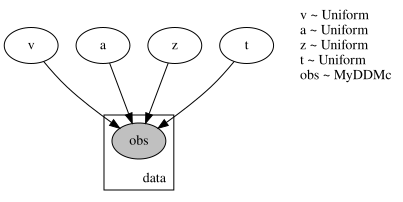

In [19]:
pyro.render_model(ddm_model, 
                  model_args = (1000, out), 
                  render_distributions = True, 
                  render_params = True)

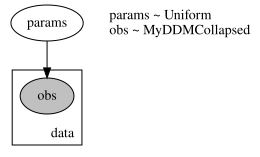

In [20]:
pyro.render_model(ddm_model_collapsed, 
                  model_args = (1000, model_config, network, out), 
                  render_distributions = True, 
                  render_params = True)

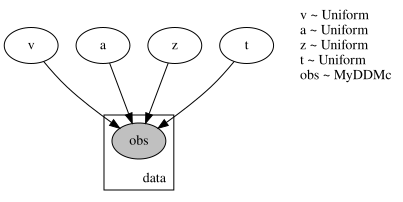

In [21]:
pyro.render_model(ddm_model_refac,
                  model_args = (1000, model_config, out),
                  render_distributions = True,
                  render_params = True)

### Sample / NUTS

#### Collapsed

In [22]:
# NUTS VERSION
# import warnings
# warnings.simplefilter("error")

from pyro.infer import MCMC, NUTS
pyro.clear_param_store()
#torch_data = torch.tensor(out)

nuts_kernel = NUTS(ddm_model_collapsed, step_size = 1, max_tree_depth = 10)
mcmc = MCMC(nuts_kernel, num_samples = 1000, 
            warmup_steps = 500, num_chains = 1, 
            initial_params = {'params': torch.tensor([0.5, 1.0, 0.5, 0.5])})
mcmc.run(1000, model_config, network, out)
mcmc_az = az.from_pyro(mcmc)

# hmc_samples = {k: v.detach().cpu().numpy() for k, v in mcmc.get_samples().items()}

# hmc_samples_new = {}
# hmc_samples_new['v'] = np.expand_dims(hmc_samples['v'], axis = (1))
# hmc_samples_new['a'] = np.expand_dims(hmc_samples['a'], axis = (1))
# hmc_samples_new['z'] = np.expand_dims(hmc_samples['z'], axis = (1))
# hmc_samples_new['t'] = np.expand_dims(hmc_samples['t'], axis = (1))
#hmc_samples_new['g_mu_std'] = np.expand_dims(hmc_samples['g_mu_std'], axis = (1,2))
#hmc_samples_new['subj_mu'] = np.expand_dims(hmc_samples['subj_mu'], axis = 1)

Sample: 100%|██████████| 1500/1500 [01:50, 13.62it/s, step size=4.60e-01, acc. prob=0.920]
/users/afengler/data/software/miniconda3/envs/lanfactory/lib/python3.7/site-packages/arviz/data/io_pyro.py:158: UserWarning: Could not get vectorized trace, log_likelihood group will be omitted. Check your model vectorization or set log_likelihood=False
  "Could not get vectorized trace, log_likelihood group will be omitted. "


In [ ]:
out

#### Refac

In [23]:
# NUTS VERSION
from pyro.infer import MCMC, NUTS
pyro.clear_param_store()
torch_data = torch.tensor(out)

nuts_kernel = NUTS(ddm_model_refac, step_size = 1, max_tree_depth = 10)
mcmc = MCMC(nuts_kernel, num_samples = 1000, 
            warmup_steps = 500, num_chains = 1, 
            initial_params = {'v': torch.tensor(0.5),
                              'a': torch.tensor(1.5),
                              'z': torch.tensor(0.5),
                              't': torch.tensor(1.0)})
mcmc.run(1000, model_config, out)
mcmc_az = az.from_pyro(mcmc)

# hmc_samples = {k: v.detach().cpu().numpy() for k, v in mcmc.get_samples().items()}

# hmc_samples_new = {}
# hmc_samples_new['v'] = np.expand_dims(hmc_samples['v'], axis = (1))
# hmc_samples_new['a'] = np.expand_dims(hmc_samples['a'], axis = (1))
# hmc_samples_new['z'] = np.expand_dims(hmc_samples['z'], axis = (1))
# hmc_samples_new['t'] = np.expand_dims(hmc_samples['t'], axis = (1))
#hmc_samples_new['g_mu_std'] = np.expand_dims(hmc_samples['g_mu_std'], axis = (1,2))
#hmc_samples_new['subj_mu'] = np.expand_dims(hmc_samples['subj_mu'], axis = 1)

/users/afengler/data/software/miniconda3/envs/lanfactory/lib/python3.7/site-packages/ipykernel_launcher.py:4: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  after removing the cwd from sys.path.
Sample: 100%|██████████| 1500/1500 [02:01, 12.36it/s, step size=4.42e-01, acc. prob=0.915]


#### Basic

In [24]:
# NUTS VERSION
from pyro.infer import MCMC, NUTS
pyro.clear_param_store()
torch_data = torch.tensor(out)

nuts_kernel = NUTS(ddm_model, step_size = 1, max_tree_depth = 10)
mcmc = MCMC(nuts_kernel, num_samples = 1000, 
            warmup_steps = 500, num_chains = 1, 
            initial_params = {'v': torch.tensor(0.5),
                              'a': torch.tensor(1.5),
                              'z': torch.tensor(0.5),
                              't': torch.tensor(1.0)})
mcmc.run(1000, out)
mcmc_az = az.from_pyro(mcmc)

# hmc_samples = {k: v.detach().cpu().numpy() for k, v in mcmc.get_samples().items()}

# hmc_samples_new = {}
# hmc_samples_new['v'] = np.expand_dims(hmc_samples['v'], axis = (1))
# hmc_samples_new['a'] = np.expand_dims(hmc_samples['a'], axis = (1))
# hmc_samples_new['z'] = np.expand_dims(hmc_samples['z'], axis = (1))
# hmc_samples_new['t'] = np.expand_dims(hmc_samples['t'], axis = (1))
#hmc_samples_new['g_mu_std'] = np.expand_dims(hmc_samples['g_mu_std'], axis = (1,2))
#hmc_samples_new['subj_mu'] = np.expand_dims(hmc_samples['subj_mu'], axis = 1)

/users/afengler/data/software/miniconda3/envs/lanfactory/lib/python3.7/site-packages/ipykernel_launcher.py:4: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  after removing the cwd from sys.path.
Sample: 100%|██████████| 1500/1500 [02:09, 11.56it/s, step size=4.06e-01, acc. prob=0.942]


In [98]:
mcmc_az

Inference data with groups:
	> posterior
	> sample_stats
	> observed_data

array([[<AxesSubplot:ylabel='params\n1'>, <AxesSubplot:>, <AxesSubplot:>],
       [<AxesSubplot:ylabel='params\n2'>, <AxesSubplot:>, <AxesSubplot:>],
       [<AxesSubplot:xlabel='params\n0', ylabel='params\n3'>,
        <AxesSubplot:xlabel='params\n1'>,
        <AxesSubplot:xlabel='params\n2'>]], dtype=object)

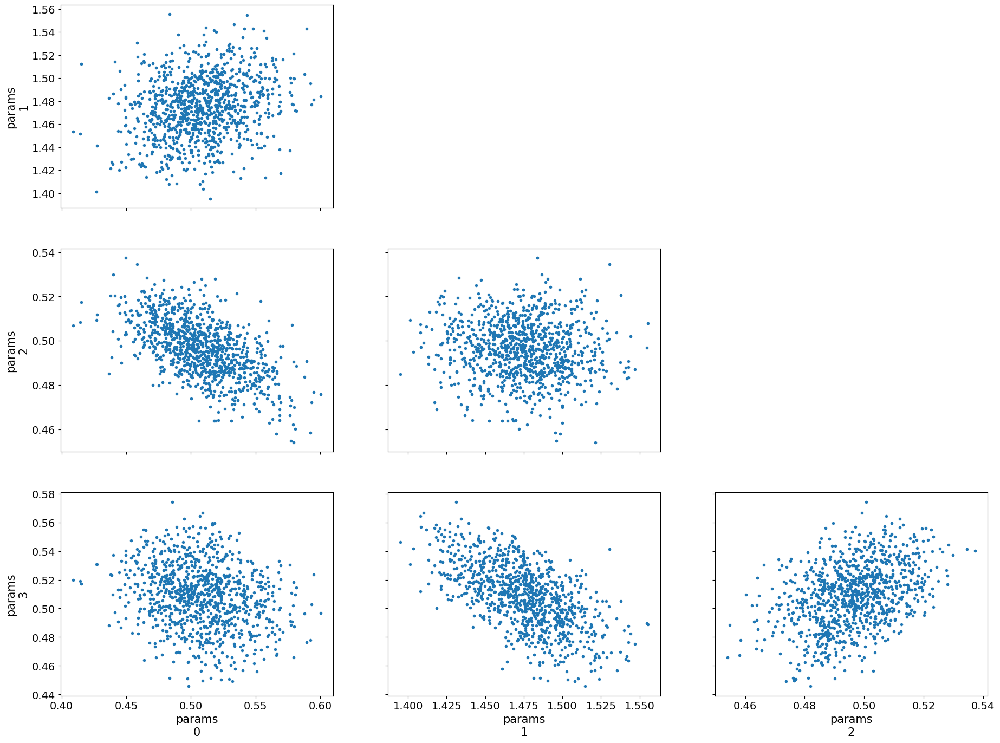

In [61]:
az.plot_pair(mcmc_az) # var_names = ['params_dim_0, 0', 'params_dim_0, 1'])

In [74]:
mcmc_az

Inference data with groups:
	> posterior
	> sample_stats
	> observed_data

array([<AxesSubplot:title={'center':'params\n0'}>,
       <AxesSubplot:title={'center':'params\n1'}>,
       <AxesSubplot:title={'center':'params\n2'}>], dtype=object)

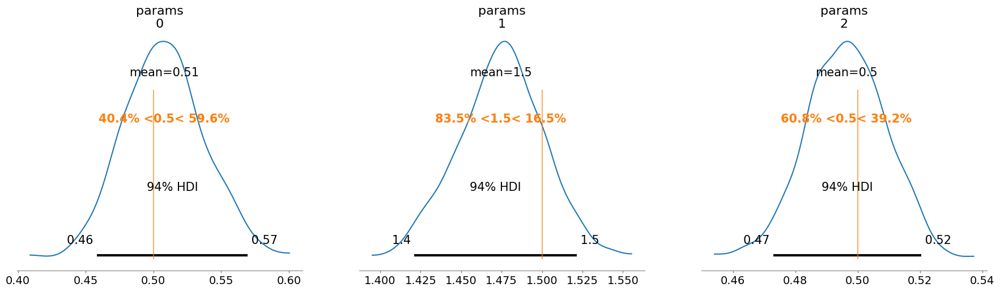

In [76]:
import bokeh
az.plot_posterior(mcmc_az, 
                       ref_val = [0.5, 1.5, 0.5, 0.5],
                 var_names = ['params'],
                 coords = {'params_dim_0': [0, 1, 2]})

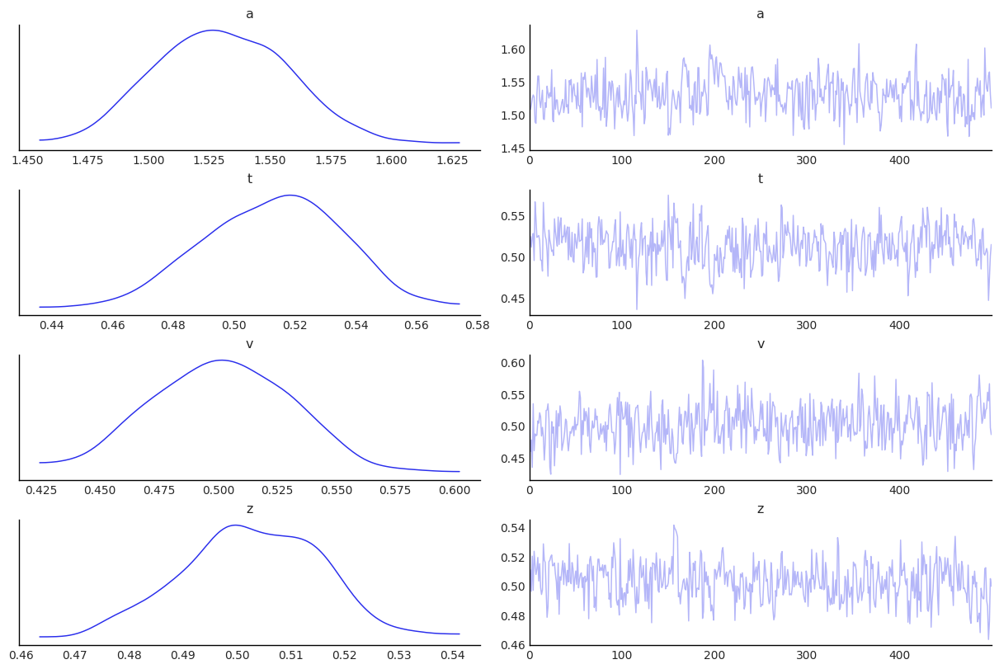

In [23]:
az.style.use('arviz-white')
ax = az.plot_trace(mcmc_az)

### Sample Variational

In [77]:
auto_guide_collapsed = pyro.infer.autoguide.AutoNormal(ddm_model_collapsed)

#### Collapsed

/users/afengler/data/software/miniconda3/envs/lanfactory/lib/python3.7/site-packages/ipykernel_launcher.py:2: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  
Guessed max_plate_nesting = 2
Step 0 out of 2000, Elbo loss: 2592.147394180298
Step 100 out of 2000, Elbo loss: 2050.4203651428224
Step 200 out of 2000, Elbo loss: 2041.501124572754
Step 300 out of 2000, Elbo loss: 2039.3174987792968
Step 400 out of 2000, Elbo loss: 2039.0626152038574
Step 500 out of 2000, Elbo loss: 2038.958911895752
Step 600 out of 2000, Elbo loss: 2039.210373687744
Step 700 out of 2000, Elbo loss: 2038.3249740600586
Step 800 out of 2000, Elbo loss: 2038.5124465942383
Step 900 out of 2000, Elbo loss: 2038.143731689453
Step 1000 out of 2000, Elbo loss: 2038.6155334472655
Step 1100 out of 2000, Elbo loss: 2038.2365242004394
Step 1200 out of 2000, Elbo loss: 2038.270

CPU times: user 52.7 s, sys: 44.5 ms, total: 52.8 s
Wall time: 52.9 s


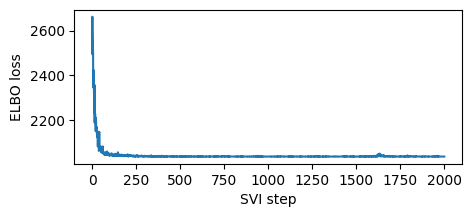

In [36]:
%%time
pyro.clear_param_store()
torch_data = torch.tensor(out)
steps = 2000

# These should be reset each training loop.
#auto_guide = pyro.infer.autoguide.AutoMultivariateNormal(basic_ddm_model)
adam = pyro.optim.Adam({"lr": 0.02})
#elbo = pyro.infer.Trace_ELBO(num_particles = 1, vectorize_particles = True)
elbo = pyro.infer.Trace_ELBO(num_particles = 10, vectorize_particles = True)
#elbo = pyro.infer.Trace_ELBO(num_particles = 1, vectorize_particles = True)
#svi = pyro.infer.SVI(basic_hierarchical_model, auto_guide, adam, elbo)

svi = pyro.infer.SVI(ddm_model_collapsed, ddm_collapsed_guide, adam, elbo)
losses = []
for step in range(steps if not smoke_test else 2):  # Consider running for more steps.
    loss = svi.step(*(1000, model_config, network, out))
    losses.append(loss)
    if step % 100 == 0:
        logging.info("Step {} out of {}, Elbo loss: {}".format(step, steps, loss))

plt.figure(figsize=(5, 2))
plt.plot(losses)
plt.xlabel("SVI step")
plt.ylabel("ELBO loss");

# #predictive = pyro.infer.Predictive(basic_hierarchical_model, guide = auto_guide, num_samples = 1000)
predictive = pyro.infer.Predictive(ddm_model_collapsed, guide = ddm_collapsed_guide, num_samples = 1000)
svi_samples = predictive(1000, model_config, network, torch.tensor(out)) #torch.tensor(data))
svi_samples_new = {key_: svi_samples[key_].numpy() for key_ in svi_samples.keys() if key_ != 'obs'}
az_svi_collapsed_manual = az.convert_to_inference_data(svi_samples_new)
#az_svi = az.from_dict(svi_samples_new)

/users/afengler/data/software/miniconda3/envs/lanfactory/lib/python3.7/site-packages/ipykernel_launcher.py:2: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  
Guessed max_plate_nesting = 2
Step 0 out of 2000, Elbo loss: 4928.249855041504
Step 100 out of 2000, Elbo loss: 2076.452738571167
Step 200 out of 2000, Elbo loss: 2040.0074516296386
Step 300 out of 2000, Elbo loss: 2038.1362295150757
Step 400 out of 2000, Elbo loss: 2037.9889656066894
Step 500 out of 2000, Elbo loss: 2038.3368070602417
Step 600 out of 2000, Elbo loss: 2038.1773406982422
Step 700 out of 2000, Elbo loss: 2037.8714010238648
Step 800 out of 2000, Elbo loss: 2037.9622467041015
Step 900 out of 2000, Elbo loss: 2038.0136966705322
Step 1000 out of 2000, Elbo loss: 2038.1191204071044
Step 1100 out of 2000, Elbo loss: 2037.7756713867188
Step 1200 out of 2000, Elbo loss: 2037.

CPU times: user 56.4 s, sys: 72.2 ms, total: 56.5 s
Wall time: 56.6 s


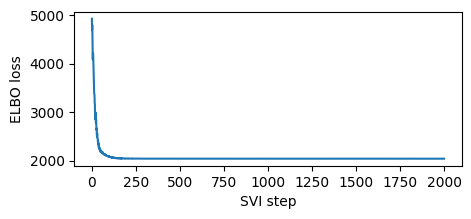

In [40]:
%%time
pyro.clear_param_store()
torch_data = torch.tensor(out)
steps = 2000

# These should be reset each training loop.
#auto_guide = pyro.infer.autoguide.AutoMultivariateNormal(basic_ddm_model)
adam = pyro.optim.Adam({"lr": 0.02})
#elbo = pyro.infer.Trace_ELBO(num_particles = 1, vectorize_particles = True)
elbo = pyro.infer.Trace_ELBO(num_particles = 10, vectorize_particles = True)
#elbo = pyro.infer.Trace_ELBO(num_particles = 1, vectorize_particles = True)
#svi = pyro.infer.SVI(basic_hierarchical_model, auto_guide, adam, elbo)

svi = pyro.infer.SVI(ddm_model_collapsed, auto_guide_collapsed, adam, elbo)
losses = []
for step in range(steps if not smoke_test else 2):  # Consider running for more steps.
    loss = svi.step(*(1000, model_config, network, torch_data))
    losses.append(loss)
    if step % 100 == 0:
        logging.info("Step {} out of {}, Elbo loss: {}".format(step, steps, loss))

plt.figure(figsize=(5, 2))
plt.plot(losses)
plt.xlabel("SVI step")
plt.ylabel("ELBO loss");

# #predictive = pyro.infer.Predictive(basic_hierarchical_model, guide = auto_guide, num_samples = 1000)
predictive = pyro.infer.Predictive(ddm_model_collapsed, guide = auto_guide_collapsed, num_samples = 1000)
svi_samples = predictive(1000, model_config, network, torch.tensor(out)) #torch.tensor(data))
svi_samples_new = {key_: svi_samples[key_].numpy() for key_ in svi_samples.keys() if key_ != 'obs'}
az_svi_collapsed = az.convert_to_inference_data(svi_samples_new)
#az_svi = az.from_dict(svi_samples_new)

array([[<AxesSubplot:ylabel='params\n1'>, <AxesSubplot:>, <AxesSubplot:>],
       [<AxesSubplot:ylabel='params\n2'>, <AxesSubplot:>, <AxesSubplot:>],
       [<AxesSubplot:xlabel='params\n0', ylabel='params\n3'>,
        <AxesSubplot:xlabel='params\n1'>,
        <AxesSubplot:xlabel='params\n2'>]], dtype=object)

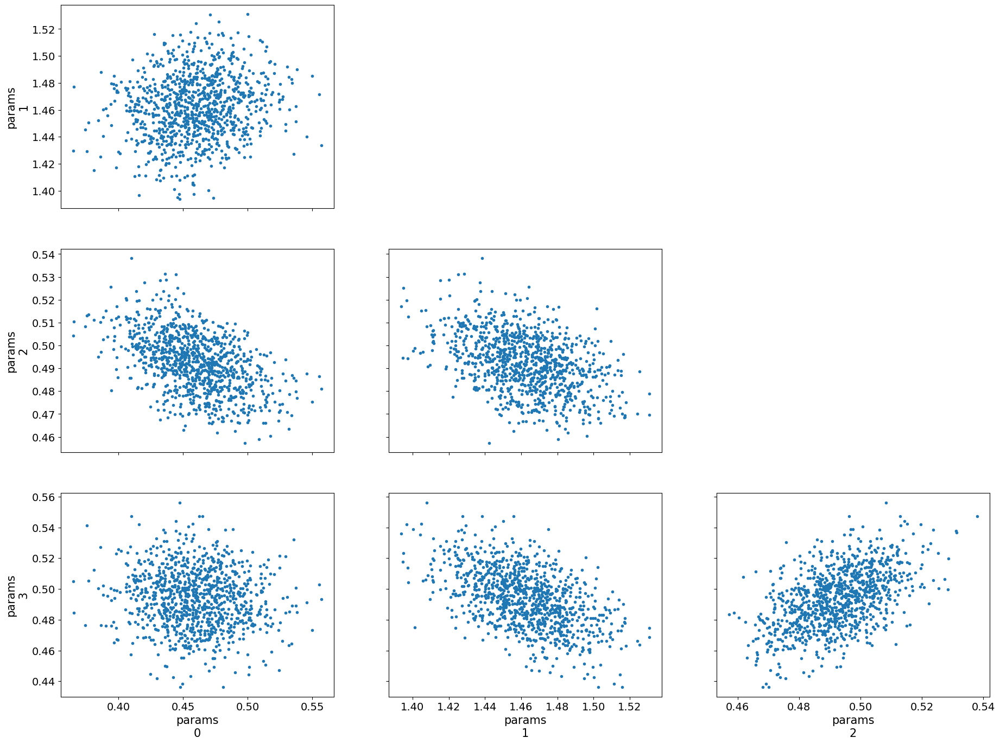

In [41]:
az.plot_pair(az_svi_collapsed_manual)

array([[<AxesSubplot:ylabel='params\n1'>, <AxesSubplot:>, <AxesSubplot:>],
       [<AxesSubplot:ylabel='params\n2'>, <AxesSubplot:>, <AxesSubplot:>],
       [<AxesSubplot:xlabel='params\n0', ylabel='params\n3'>,
        <AxesSubplot:xlabel='params\n1'>,
        <AxesSubplot:xlabel='params\n2'>]], dtype=object)

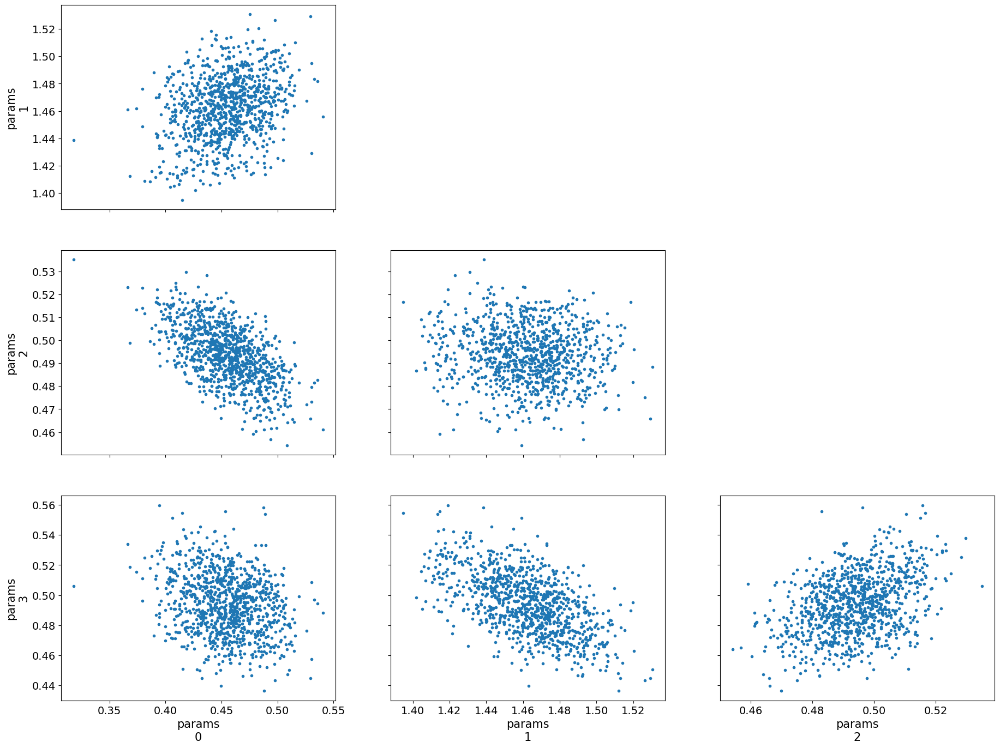

In [42]:
az.plot_pair(az_svi_collapsed) #, var_names = ['v', 'a', 'z', 't'])

#### Basic

In [142]:
%%time
pyro.clear_param_store()
torch_data = torch.tensor(out)
steps = 2000

# These should be reset each training loop.
#auto_guide = pyro.infer.autoguide.AutoMultivariateNormal(basic_ddm_model)
adam = pyro.optim.Adam({"lr": 0.02})
#elbo = pyro.infer.Trace_ELBO(num_particles = 1, vectorize_particles = True)
elbo = pyro.infer.Trace_ELBO(num_particles = 10, vectorize_particles = True)
#elbo = pyro.infer.Trace_ELBO(num_particles = 1, vectorize_particles = True)
#svi = pyro.infer.SVI(basic_hierarchical_model, auto_guide, adam, elbo)

svi = pyro.infer.SVI(ddm_model, auto_guide, adam, elbo)
losses = []
for step in range(steps if not smoke_test else 2):  # Consider running for more steps.
    loss = svi.step(*(1000, torch_data))
    losses.append(loss)
    if step % 100 == 0:
        logging.info("Step {} out of {}, Elbo loss: {}".format(step, steps, loss))

plt.figure(figsize=(5, 2))
plt.plot(losses)
plt.xlabel("SVI step")
plt.ylabel("ELBO loss");

# #predictive = pyro.infer.Predictive(basic_hierarchical_model, guide = auto_guide, num_samples = 1000)
predictive = pyro.infer.Predictive(ddm_model, guide = auto_guide, num_samples = 1000)
svi_samples = predictive(1000, torch.tensor(out)) #torch.tensor(data))
svi_samples_new = {key_: svi_samples[key_].numpy() for key_ in svi_samples.keys() if key_ != 'obs'}
az_svi_basic = az.convert_to_inference_data(svi_samples_new)
#az_svi = az.from_dict(svi_samples_new)

/users/afengler/data/software/miniconda3/envs/lanfactory/lib/python3.7/site-packages/ipykernel_launcher.py:2: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  
/users/afengler/data/software/miniconda3/envs/lanfactory/lib/python3.7/site-packages/torch/distributions/distribution.py:46: UserWarning: <class '__main__.MyDDMc'> does not define `arg_constraints`. Please set `arg_constraints = {}` or initialize the distribution with `validate_args=False` to turn off validation.
  'with `validate_args=False` to turn off validation.')
Guessed max_plate_nesting = 2
Step 0 out of 2000, Elbo loss: 2961.6949723005296
Step 100 out of 2000, Elbo loss: 1986.269088435173


KeyboardInterrupt: 

array([[<AxesSubplot:ylabel='a'>, <AxesSubplot:>, <AxesSubplot:>],
       [<AxesSubplot:ylabel='z'>, <AxesSubplot:>, <AxesSubplot:>],
       [<AxesSubplot:xlabel='v', ylabel='t'>, <AxesSubplot:xlabel='a'>,
        <AxesSubplot:xlabel='z'>]], dtype=object)

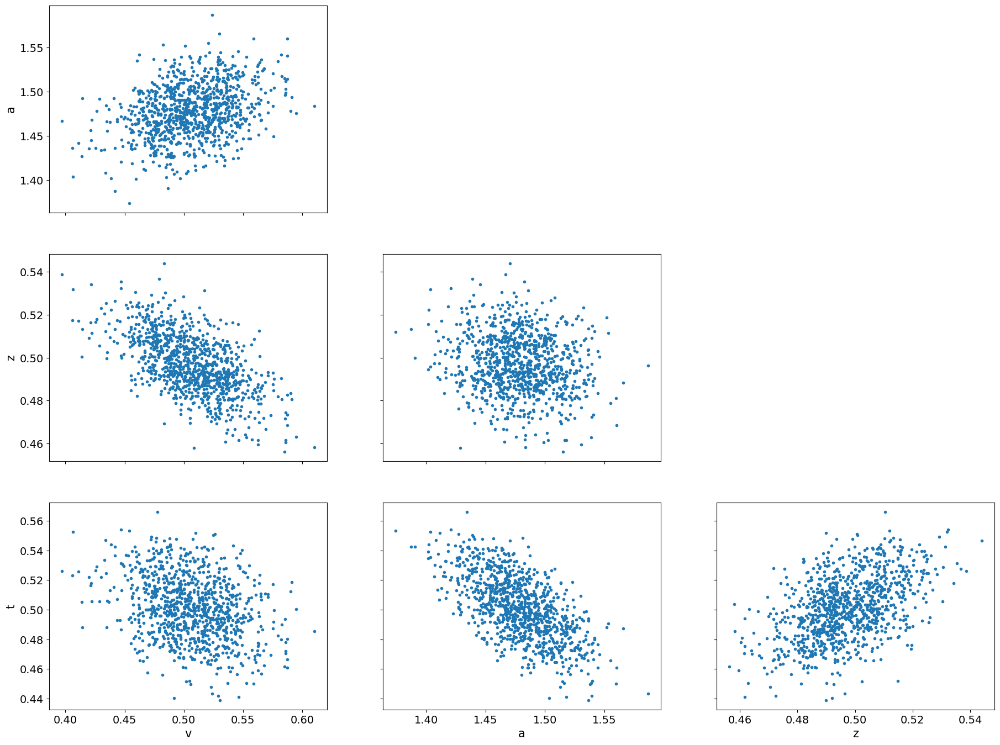

In [137]:
az.plot_pair(az_svi_basic) #, var_names = ['v', 'a', 'z', 't'])

In [100]:
az_svi.posterior.data_vars['params'].values.shape

(4, 1000)

array([[<AxesSubplot:ylabel='params\n1'>, <AxesSubplot:>, <AxesSubplot:>],
       [<AxesSubplot:ylabel='params\n2'>, <AxesSubplot:>, <AxesSubplot:>],
       [<AxesSubplot:xlabel='params\n0', ylabel='params\n3'>,
        <AxesSubplot:xlabel='params\n1'>,
        <AxesSubplot:xlabel='params\n2'>]], dtype=object)

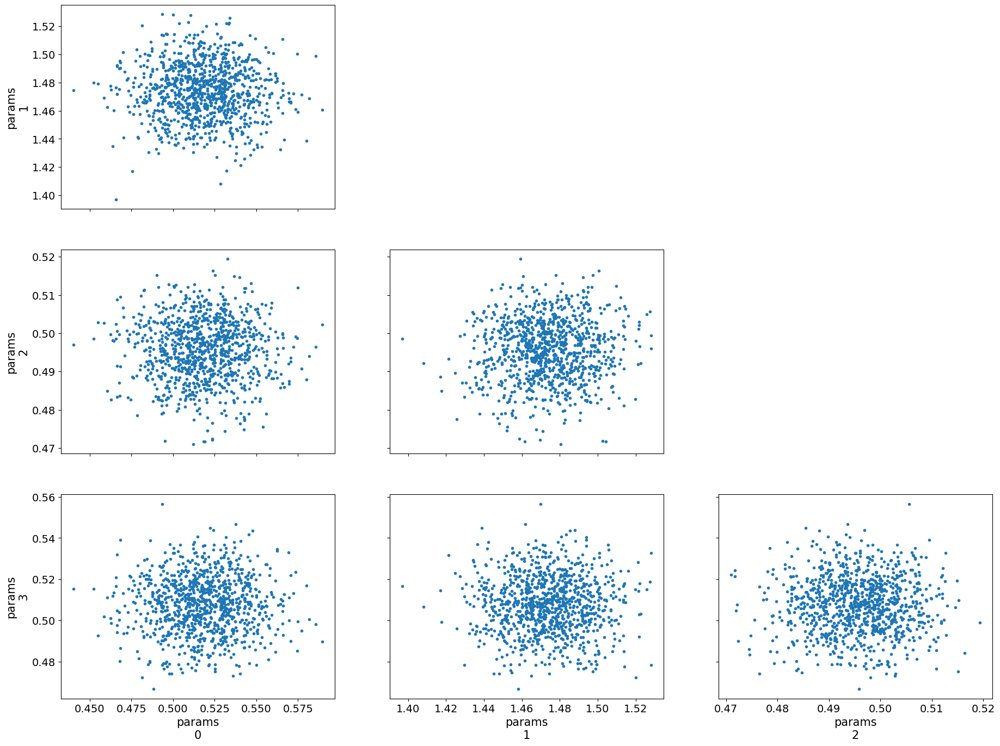

In [118]:
az.plot_pair(az_svi) #, var_names = ['v', 'a', 'z', 't'])

In [88]:
svi_samples_new['params'].shape

(1000, 4)

## Define Angle

### Simulate

In [70]:
base_dim = 1
n_samples = 1000
v = torch.zeros(base_dim) + 0.5
a = torch.zeros(base_dim) + 1.5
z = torch.zeros(base_dim) + 0.5
t = torch.zeros(base_dim) + 0.5
theta_param = torch.zeros(base_dim) + 0.3
theta = torch.vstack([v, a, z, t, theta_param]).T
theta = theta.tile((n_samples, 1))
out = sim_wrap(model = 'angle', theta = theta)
theta = torch.hstack([theta, out])

### Load Network

In [73]:
# Load network config
network_config = pickle.load(open('nets/eba53550128911ec9fef3cecef056d26_angle_torch__network_config.pickle', 'rb'))

# Initialize network class
torch_net = TorchMLP(network_config = network_config,
               input_shape = 7,
               generative_model_id = None)

# Load weights and biases
torch_net.load_state_dict(torch.load('nets/eba53550128911ec9fef3cecef056d26_angle_torch_state_dict.pt', 
                          map_location=torch.device('cpu')))

network_angle = torch_net

tanh
tanh
linear


In [72]:
# Initialize custom pytorch network
custom_torch_net = CustomTorchMLP(torch_net.state_dict(), 
                                  network_config)

# Test forward pass
custom_torch_net.forward(torch.randn((10, 7)))

tensor([[-12.7545],
        [-13.9202],
        [ -2.4001],
        [ -1.2437],
        [-16.1045],
        [-15.5006],
        [-11.2329],
        [-16.0828],
        [ -7.7152],
        [-15.8960]])

### Models

In [74]:
#network_angle = custom_torch_net
class MyAngle(dist.TorchDistribution):
    def __init__(self, v, a, z, t, theta):
        self.net = network_angle
        self.net_rep_n = 1
        self.v = v 
        self.a = a
        self.z = z
        self.t = t
        self.theta = theta
        
        if isinstance(v, Number):
            batch_shape = torch.Size()
        else:
            batch_shape = self.v.size()
            if not self.v.size() == torch.Size([]):
                self.net_rep_n = batch_shape[0]
                
        super().__init__(batch_shape = batch_shape, event_shape = torch.Size((2,)))
        
    def sample(self):
        theta = torch.vstack([self.v, self.a, self.z, self.t, self.theta]).T
        return sim_wrap(theta = theta, model = 'angle')
    
    def log_prob(self, value):
        tmp_params = torch.stack([self.v, self.a, self.z, self.t, self.theta], dim = -1)
        
        if self.v.dim() == 0:
            tmp_params = tmp_params.unsqueeze(0)
        
        tmp_params2 = tmp_params.repeat_interleave(value.size()[0], -2)
        
        if self.v.dim() == 2:
            dat_tmp = value.repeat((self.v.size()[0], 1, 1))
        else: 
            dat_tmp = value

        net_in = torch.cat([tmp_params2, dat_tmp], dim = -1)
        
        # Old
        logp = torch.clip(self.net(net_in), min = -16.11)      
        logp_squeezed = torch.squeeze(logp, dim = -1)
        return logp_squeezed

In [75]:
def basic_angle_model(num_trials, data):
    v = pyro.sample("v", dist.Uniform(-3, 3))
    a = pyro.sample("a", dist.Uniform(0.3, 2.5))
    z = pyro.sample("z", dist.Uniform(0.1, 0.9))
    t = pyro.sample("t", dist.Uniform(0.0, 2.0))
    theta = pyro.sample("theta", dist.Uniform(0.0, 1.1))
    
    with pyro.plate("data", num_trials) as data_plate:
        return pyro.sample("obs", MyAngle(v, a, z, t, theta), obs = data)

In [85]:
auto_guide = pyro.infer.autoguide.AutoMultivariateNormal(basic_angle_model)

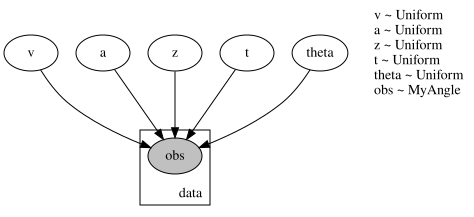

In [77]:
pyro.render_model(basic_angle_model, model_args = (1000, out), 
                  render_distributions = True, 
                  render_params = True)

### Sample - NUTS

In [79]:
# NUTS VERSION
from pyro.infer import MCMC, NUTS
torch_data = torch.tensor(out)

nuts_kernel = NUTS(basic_angle_model, step_size = 1, max_tree_depth = 5)
mcmc_angle = MCMC(nuts_kernel, num_samples = 500, warmup_steps = 500, num_chains = 1, initial_params = {'v': torch.tensor(0.5),
                                                                                                        'a': torch.tensor(1.5),
                                                                                                        'z': torch.tensor(0.5),
                                                                                                        't': torch.tensor(1.0),
                                                                                                        'theta': torch.tensor(0.5)})
mcmc_angle.run(1000, out)
mcmc_angle_az = az.from_pyro(mcmc_angle)

# hmc_samples = {k: v.detach().cpu().numpy() for k, v in mcmc.get_samples().items()}

# hmc_samples_new = {}
# hmc_samples_new['v'] = np.expand_dims(hmc_samples['v'], axis = (1))
# hmc_samples_new['a'] = np.expand_dims(hmc_samples['a'], axis = (1))
# hmc_samples_new['z'] = np.expand_dims(hmc_samples['z'], axis = (1))
# hmc_samples_new['t'] = np.expand_dims(hmc_samples['t'], axis = (1))
#hmc_samples_new['g_mu_std'] = np.expand_dims(hmc_samples['g_mu_std'], axis = (1,2))
#hmc_samples_new['subj_mu'] = np.expand_dims(hmc_samples['subj_mu'], axis = 1)

/users/afengler/data/software/miniconda3/envs/lanfactory/lib/python3.7/site-packages/ipykernel_launcher.py:3: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  This is separate from the ipykernel package so we can avoid doing imports until
Sample: 100%|██████████| 1000/1000 [01:21, 12.31it/s, step size=1.99e-01, acc. prob=0.940]
/users/afengler/data/software/miniconda3/envs/lanfactory/lib/python3.7/site-packages/torch/distributions/distribution.py:46: UserWarning: <class '__main__.MyAngle'> does not define `arg_constraints`. Please set `arg_constraints = {}` or initialize the distribution with `validate_args=False` to turn off validation.
  'with `validate_args=False` to turn off validation.')


### Sample - Variational

/users/afengler/data/software/miniconda3/envs/lanfactory/lib/python3.7/site-packages/ipykernel_launcher.py:2: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  
Guessed max_plate_nesting = 2
Step 0 out of 200, Elbo loss: 1454.1518622100352
Step 100 out of 200, Elbo loss: 1446.5443305194378
/users/afengler/data/software/miniconda3/envs/lanfactory/lib/python3.7/site-packages/ipykernel_launcher.py:28: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
Warmup:   0%|          | 0/1000 [07:53, ?it/s]


CPU times: user 7.35 s, sys: 28.1 ms, total: 7.38 s
Wall time: 7.39 s


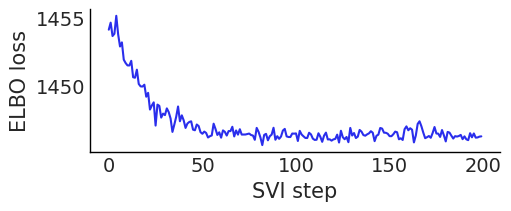

In [87]:
%%time
pyro.clear_param_store()
torch_data = torch.tensor(out)
steps = 200

# These should be reset each training loop.
#auto_guide = pyro.infer.autoguide.AutoMultivariateNormal(basic_ddm_model)
adam = pyro.optim.Adam({"lr": 0.02})
#elbo = pyro.infer.Trace_ELBO(num_particles = 1, vectorize_particles = True)
elbo = pyro.infer.Trace_ELBO(num_particles = 10, vectorize_particles = True)
#elbo = pyro.infer.Trace_ELBO(num_particles = 1, vectorize_particles = True)
#svi = pyro.infer.SVI(basic_hierarchical_model, auto_guide, adam, elbo)

svi_angle = pyro.infer.SVI(basic_angle_model, auto_guide, adam, elbo)
losses = []
for step in range(steps if not smoke_test else 2):  # Consider running for more steps.
    loss = svi_angle.step(*(1000, torch_data))
    losses.append(loss)
    if step % 100 == 0:
        logging.info("Step {} out of {}, Elbo loss: {}".format(step, steps, loss))

plt.figure(figsize=(5, 2))
plt.plot(losses)
plt.xlabel("SVI step")
plt.ylabel("ELBO loss");

# #predictive = pyro.infer.Predictive(basic_hierarchical_model, guide = auto_guide, num_samples = 1000)
predictive = pyro.infer.Predictive(basic_angle_model, guide = auto_guide, num_samples = 1000)
svi_angle_samples = predictive(1000, torch.tensor(out)) #torch.tensor(data))
svi_angle_samples_new = {key_: svi_angle_samples[key_].numpy().squeeze() for key_ in svi_angle_samples.keys() if key_ != 'obs'}
az_angle_svi = az.from_dict(svi_angle_samples_new)

### Plots

array([[<AxesSubplot:ylabel='a'>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>],
       [<AxesSubplot:ylabel='z'>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>],
       [<AxesSubplot:ylabel='t'>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>],
       [<AxesSubplot:xlabel='v', ylabel='theta'>,
        <AxesSubplot:xlabel='a'>, <AxesSubplot:xlabel='z'>,
        <AxesSubplot:xlabel='t'>]], dtype=object)

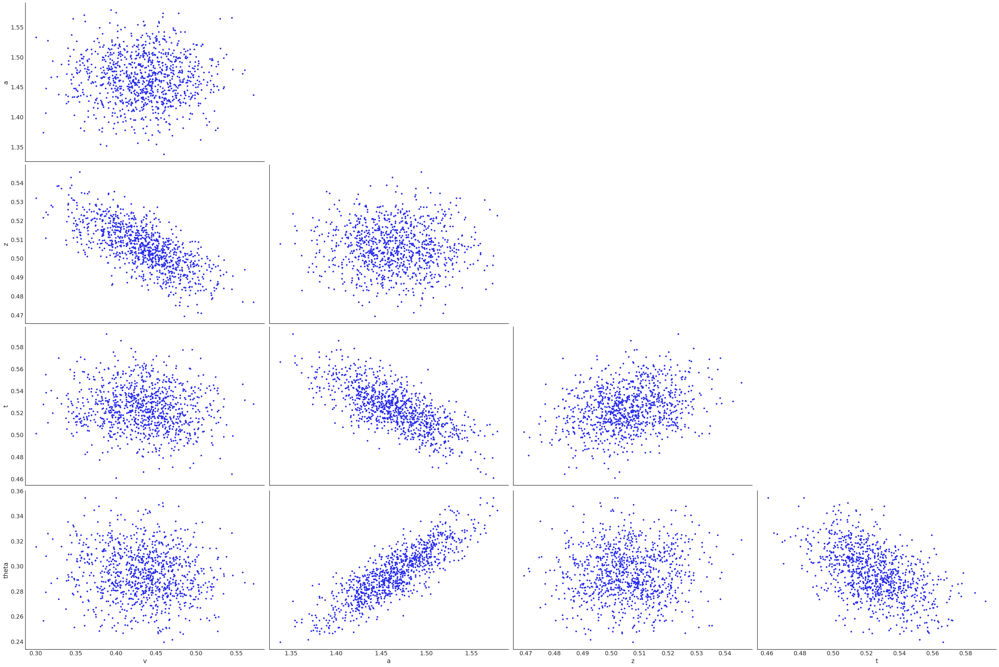

In [88]:
az.plot_pair(az_angle_svi, var_names = ['v', 'a', 'z', 't', 'theta'])

array([[<AxesSubplot:ylabel='a'>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>],
       [<AxesSubplot:ylabel='z'>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>],
       [<AxesSubplot:ylabel='t'>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>],
       [<AxesSubplot:xlabel='v', ylabel='theta'>,
        <AxesSubplot:xlabel='a'>, <AxesSubplot:xlabel='z'>,
        <AxesSubplot:xlabel='t'>]], dtype=object)

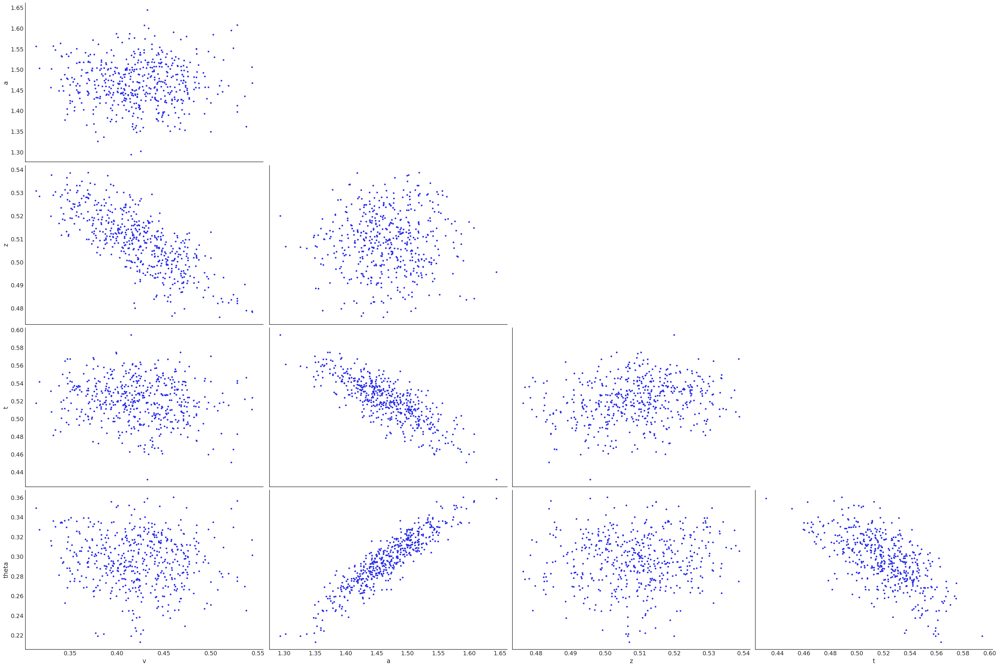

In [89]:
az.plot_pair(mcmc_angle_az, var_names = ['v', 'a', 'z', 't', 'theta'])

## Define Weibull

### Simulate

In [107]:
base_dim = 1
n_samples = 1000
v = torch.zeros(base_dim) + 0.5
a = torch.zeros(base_dim) + 1.5
z = torch.zeros(base_dim) + 0.5
t = torch.zeros(base_dim) + 0.5
alpha = torch.zeros(base_dim) + 2.0
beta = torch.zeros(base_dim) + 2.0
theta = torch.vstack([v, a, z, t, alpha, beta]).T
theta = theta.tile((n_samples, 1))
out = sim_wrap(model = 'weibull', theta = theta)
theta = torch.hstack([theta, out])

### Load Network

In [108]:
# Load network config
network_config = pickle.load(open('nets/44deb16a127f11eca325a0423f39b436_weibull_torch__network_config.pickle', 'rb'))

# Initialize network class
network_weibull = TorchMLP(network_config = network_config,
               input_shape = 8,
               generative_model_id = None)

# Load weights and biases
network_weibull.load_state_dict(torch.load('nets/44deb16a127f11eca325a0423f39b436_weibull_torch_state_dict.pt', 
                                 map_location=torch.device('cpu')))

tanh
tanh
linear


<All keys matched successfully>

### Models

In [109]:
#network_angle = custom_torch_net
class MyWeibull(dist.TorchDistribution):
    def __init__(self, v, a, z, t, alpha, beta):
        self.net = network_weibull
        self.net_rep_n = 1
        self.v = v 
        self.a = a
        self.z = z
        self.t = t
        self.alpha = alpha
        self.beta = beta
        
        if isinstance(v, Number):
            batch_shape = torch.Size()
        else:
            batch_shape = self.v.size()
            if not self.v.size() == torch.Size([]):
                self.net_rep_n = batch_shape[0]
                
        super().__init__(batch_shape = batch_shape, event_shape = torch.Size((2,)))
        
    def sample(self):
        theta = torch.vstack([self.v, self.a, self.z, self.t, self.alpha, self.beta]).T
        return sim_wrap(theta = theta, model = 'weibull')
    
    def log_prob(self, value):
        tmp_params = torch.stack([self.v, self.a, self.z, self.t, self.alpha, self.beta], dim = -1)
        
        if self.v.dim() == 0:
            tmp_params = tmp_params.unsqueeze(0)
        
        tmp_params2 = tmp_params.repeat_interleave(value.size()[0], -2)
        
        if self.v.dim() == 2:
            dat_tmp = value.repeat((self.v.size()[0], 1, 1))
        else: 
            dat_tmp = value

        net_in = torch.cat([tmp_params2, dat_tmp], dim = -1)
        
        # Old
        logp = torch.clip(self.net(net_in), min = -16.11)      
        logp_squeezed = torch.squeeze(logp, dim = -1)
        return logp_squeezed

In [110]:
def basic_weibull_model(num_trials, data):
    v = pyro.sample("v", dist.Uniform(-3, 3))
    a = pyro.sample("a", dist.Uniform(0.3, 2.5))
    z = pyro.sample("z", dist.Uniform(0.1, 0.9))
    t = pyro.sample("t", dist.Uniform(0.0, 2.0))
    alpha = pyro.sample("alpha", dist.Uniform(0.31, 4.99))
    beta = pyro.sample("beta", dist.Uniform(0.31, 6.99))
    
    with pyro.plate("data", num_trials) as data_plate:
        return pyro.sample("obs", MyWeibull(v, a, z, t, alpha, beta), obs = data)

In [111]:
auto_guide = pyro.infer.autoguide.AutoMultivariateNormal(basic_weibull_model)

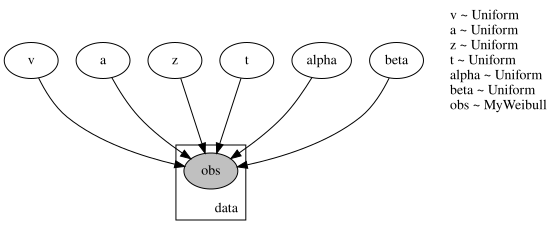

In [112]:
pyro.render_model(basic_weibull_model, model_args = (1000, out), 
                  render_distributions = True, 
                  render_params = True)

### Sample - NUTS

In [113]:
# NUTS VERSION
from pyro.infer import MCMC, NUTS
torch_data = torch.tensor(out)

nuts_kernel = NUTS(basic_weibull_model, step_size = 1, max_tree_depth = 5)
mcmc_weibull = MCMC(nuts_kernel, num_samples = 500, warmup_steps = 500, num_chains = 1, initial_params = {'v': torch.tensor(0.5),
                                                                                                          'a': torch.tensor(1.5),
                                                                                                          'z': torch.tensor(0.5),
                                                                                                          't': torch.tensor(1.0),
                                                                                                          'alpha': torch.tensor(3.0),
                                                                                                          'beta': torch.tensor(3.0)})
mcmc_weibull.run(1000, out)
mcmc_weibull_az = az.from_pyro(mcmc_weibull)

/users/afengler/data/software/miniconda3/envs/lanfactory/lib/python3.7/site-packages/ipykernel_launcher.py:3: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  This is separate from the ipykernel package so we can avoid doing imports until
Sample: 100%|██████████| 1000/1000 [01:58,  8.46it/s, step size=1.37e-01, acc. prob=0.935]
/users/afengler/data/software/miniconda3/envs/lanfactory/lib/python3.7/site-packages/torch/distributions/distribution.py:46: UserWarning: <class '__main__.MyWeibull'> does not define `arg_constraints`. Please set `arg_constraints = {}` or initialize the distribution with `validate_args=False` to turn off validation.
  'with `validate_args=False` to turn off validation.')


### Sample - Variational

/users/afengler/data/software/miniconda3/envs/lanfactory/lib/python3.7/site-packages/ipykernel_launcher.py:2: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  
/users/afengler/data/software/miniconda3/envs/lanfactory/lib/python3.7/site-packages/torch/distributions/distribution.py:46: UserWarning: <class '__main__.MyWeibull'> does not define `arg_constraints`. Please set `arg_constraints = {}` or initialize the distribution with `validate_args=False` to turn off validation.
  'with `validate_args=False` to turn off validation.')
Guessed max_plate_nesting = 2
Step 0 out of 1000, Elbo loss: 1261.43738219738
Step 100 out of 1000, Elbo loss: 1246.0326152443886
Step 200 out of 1000, Elbo loss: 1245.846275472641
Step 300 out of 1000, Elbo loss: 1245.5842320799827
Step 400 out of 1000, Elbo loss: 1245.8942776679992
Step 500 out of 1000, Elbo loss:

CPU times: user 30.3 s, sys: 27.5 ms, total: 30.3 s
Wall time: 30.4 s


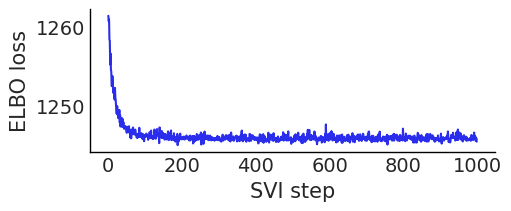

In [117]:
%%time
pyro.clear_param_store()
torch_data = torch.tensor(out)
steps = 1000

# These should be reset each training loop.
#auto_guide = pyro.infer.autoguide.AutoMultivariateNormal(basic_ddm_model)
adam = pyro.optim.Adam({"lr": 0.02})
#elbo = pyro.infer.Trace_ELBO(num_particles = 1, vectorize_particles = True)
elbo = pyro.infer.Trace_ELBO(num_particles = 10, vectorize_particles = True)
#elbo = pyro.infer.Trace_ELBO(num_particles = 1, vectorize_particles = True)
#svi = pyro.infer.SVI(basic_hierarchical_model, auto_guide, adam, elbo)

svi_weibull = pyro.infer.SVI(basic_weibull_model, auto_guide, adam, elbo)
losses = []
for step in range(steps if not smoke_test else 2):  # Consider running for more steps.
    loss = svi_weibull.step(*(1000, torch_data))
    losses.append(loss)
    if step % 100 == 0:
        logging.info("Step {} out of {}, Elbo loss: {}".format(step, steps, loss))

plt.figure(figsize=(5, 2))
plt.plot(losses)
plt.xlabel("SVI step")
plt.ylabel("ELBO loss");

# #predictive = pyro.infer.Predictive(basic_hierarchical_model, guide = auto_guide, num_samples = 1000)
predictive = pyro.infer.Predictive(basic_weibull_model, guide = auto_guide, num_samples = 1000)
svi_weibull_samples = predictive(1000, torch.tensor(out)) #torch.tensor(data))
svi_weibull_samples_new = {key_: svi_weibull_samples[key_].numpy().squeeze() for key_ in svi_weibull_samples.keys() if key_ != 'obs'}
az_weibull_svi = az.from_dict(svi_weibull_samples_new)

### Plots

array([[<AxesSubplot:ylabel='a'>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>],
       [<AxesSubplot:ylabel='z'>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>],
       [<AxesSubplot:ylabel='t'>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>],
       [<AxesSubplot:ylabel='alpha'>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>],
       [<AxesSubplot:xlabel='v', ylabel='beta'>,
        <AxesSubplot:xlabel='a'>, <AxesSubplot:xlabel='z'>,
        <AxesSubplot:xlabel='t'>, <AxesSubplot:xlabel='alpha'>]],
      dtype=object)

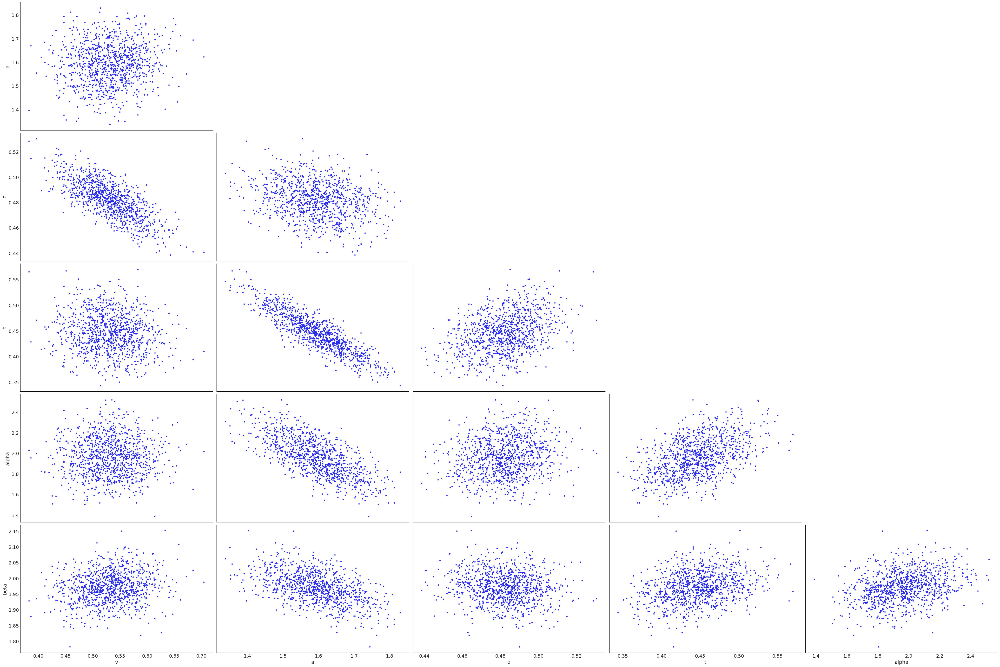

In [118]:
az.plot_pair(az_weibull_svi, var_names = ['v', 'a', 'z', 't', 'alpha', 'beta'])

array([[<AxesSubplot:ylabel='a'>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>],
       [<AxesSubplot:ylabel='z'>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>],
       [<AxesSubplot:ylabel='t'>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>],
       [<AxesSubplot:ylabel='alpha'>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>],
       [<AxesSubplot:xlabel='v', ylabel='beta'>,
        <AxesSubplot:xlabel='a'>, <AxesSubplot:xlabel='z'>,
        <AxesSubplot:xlabel='t'>, <AxesSubplot:xlabel='alpha'>]],
      dtype=object)

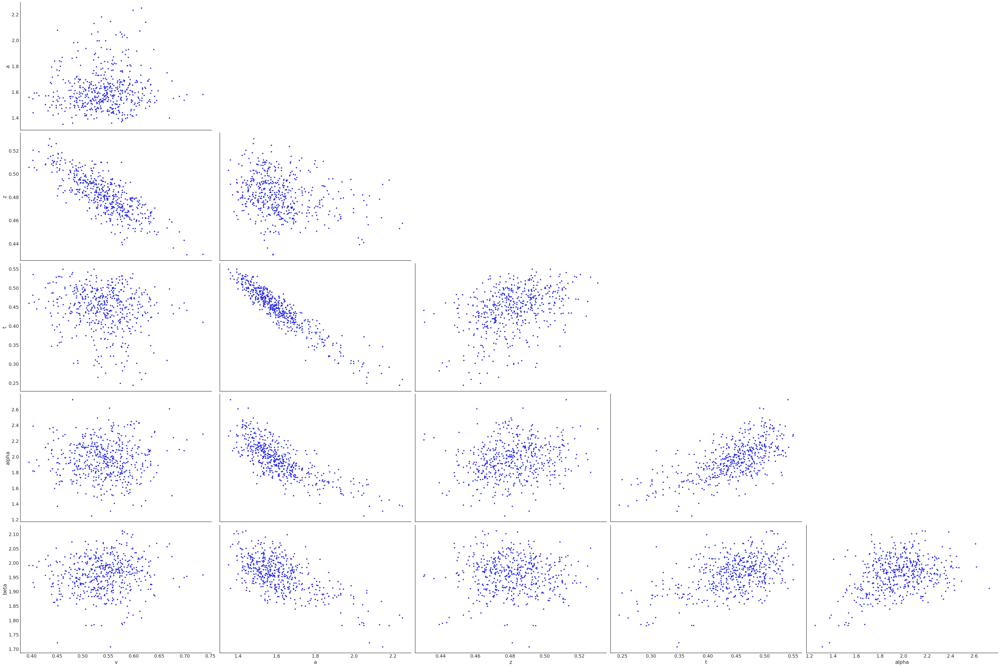

In [116]:
az.plot_pair(mcmc_weibull_az, var_names = ['v', 'a', 'z', 't', 'alpha', 'beta'])

## Define Levy

### Simulate

In [122]:
base_dim = 1
n_samples = 1000
v = torch.zeros(base_dim) + 0.5
a = torch.zeros(base_dim) + 1.5
z = torch.zeros(base_dim) + 0.5
t = torch.zeros(base_dim) + 0.5
alpha = torch.zeros(base_dim) + 1.5
theta = torch.vstack([v, a, z, alpha, t]).T
theta = theta.tile((n_samples, 1))
out = sim_wrap(model = 'levy', theta = theta)
theta = torch.hstack([theta, out])

### Load Network

In [123]:
# Load network config
network_config = pickle.load(open('nets/80dec298152e11ec88b8ac1f6bfea5a4_levy_torch__network_config.pickle', 'rb'))

# Initialize network class
network_levy = TorchMLP(network_config = network_config,
               input_shape = 7,
               generative_model_id = None)

# Load weights and biases
network_levy.load_state_dict(torch.load('nets/80dec298152e11ec88b8ac1f6bfea5a4_levy_torch_state_dict.pt', 
                          map_location=torch.device('cpu')))

tanh
tanh
linear


<All keys matched successfully>

### Models

In [128]:
#network_angle = custom_torch_net
class MyLevy(dist.TorchDistribution):
    def __init__(self, v, a, z, alpha, t):
        self.net = network_levy
        self.net_rep_n = 1
        self.v = v 
        self.a = a
        self.z = z
        self.t = t
        self.alpha = alpha
        
        if isinstance(v, Number):
            batch_shape = torch.Size()
        else:
            batch_shape = self.v.size()
            if not self.v.size() == torch.Size([]):
                self.net_rep_n = batch_shape[0]
                
        super().__init__(batch_shape = batch_shape, event_shape = torch.Size((2,)))
        
    def sample(self):
        theta = torch.vstack([self.v, self.a, self.z, self.alpha, self.t]).T
        return sim_wrap(theta = theta, model = 'levy')
    
    def log_prob(self, value):
        tmp_params = torch.stack([self.v, self.a, self.z, self.alpha, self.t], dim = -1)
        
        if self.v.dim() == 0:
            tmp_params = tmp_params.unsqueeze(0)
        
        tmp_params2 = tmp_params.repeat_interleave(value.size()[0], -2)
        
        if self.v.dim() == 2:
            dat_tmp = value.repeat((self.v.size()[0], 1, 1))
        else: 
            dat_tmp = value

        net_in = torch.cat([tmp_params2, dat_tmp], dim = -1)
        
        # Old
        logp = torch.clip(self.net(net_in), min = -16.11)      
        logp_squeezed = torch.squeeze(logp, dim = -1)
        return logp_squeezed

In [132]:
def basic_levy_model(num_trials, data):
    v = pyro.sample("v", dist.Uniform(-3, 3))
    a = pyro.sample("a", dist.Uniform(0.3, 2.5))
    z = pyro.sample("z", dist.Uniform(0.1, 0.9))
    t = pyro.sample("t", dist.Uniform(0.0, 2.0))
    alpha = pyro.sample("alpha", dist.Uniform(1.0, 2.0))
    
    with pyro.plate("data", num_trials) as data_plate:
        return pyro.sample("obs", MyLevy(v, a, z, alpha, t), obs = data)

In [133]:
auto_guide = pyro.infer.autoguide.AutoMultivariateNormal(basic_levy_model)

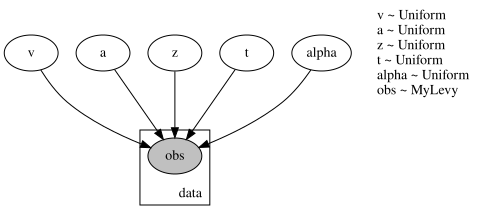

In [134]:
pyro.render_model(basic_levy_model, model_args = (1000, out), 
                  render_distributions = True, 
                  render_params = True)

### Sample - NUTS

In [135]:
# NUTS VERSION
from pyro.infer import MCMC, NUTS
torch_data = torch.tensor(out)

nuts_kernel = NUTS(basic_levy_model, step_size = 1, max_tree_depth = 5)
mcmc_levy = MCMC(nuts_kernel, num_samples = 500, warmup_steps = 500, num_chains = 1, initial_params = {'v': torch.tensor(0.5),
                                                                                                       'a': torch.tensor(1.5),
                                                                                                       'z': torch.tensor(0.5),
                                                                                                       't': torch.tensor(1.0),
                                                                                                       'alpha': torch.tensor(1.5)})
mcmc_levy.run(1000, out)
mcmc_levy_az = az.from_pyro(mcmc_levy)

/users/afengler/data/software/miniconda3/envs/lanfactory/lib/python3.7/site-packages/ipykernel_launcher.py:3: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  This is separate from the ipykernel package so we can avoid doing imports until
Sample: 100%|██████████| 1000/1000 [00:52, 19.05it/s, step size=3.25e-01, acc. prob=0.915]
/users/afengler/data/software/miniconda3/envs/lanfactory/lib/python3.7/site-packages/torch/distributions/distribution.py:46: UserWarning: <class '__main__.MyLevy'> does not define `arg_constraints`. Please set `arg_constraints = {}` or initialize the distribution with `validate_args=False` to turn off validation.
  'with `validate_args=False` to turn off validation.')


### Sample - Variational

/users/afengler/data/software/miniconda3/envs/lanfactory/lib/python3.7/site-packages/ipykernel_launcher.py:2: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  
Guessed max_plate_nesting = 2
Step 0 out of 1000, Elbo loss: 5224.182584857941
Step 100 out of 1000, Elbo loss: 1838.6058663129807
Step 200 out of 1000, Elbo loss: 1831.3256248474122
Step 300 out of 1000, Elbo loss: 1830.1719724655152
Step 400 out of 1000, Elbo loss: 1831.148584318161
Step 500 out of 1000, Elbo loss: 1829.855780005455
Step 600 out of 1000, Elbo loss: 1830.358990931511
Step 700 out of 1000, Elbo loss: 1829.8134251594543
Step 800 out of 1000, Elbo loss: 1829.383260178566
Step 900 out of 1000, Elbo loss: 1829.1949363470078
/users/afengler/data/software/miniconda3/envs/lanfactory/lib/python3.7/site-packages/ipykernel_launcher.py:28: UserWarning: To copy construct from a

CPU times: user 28.5 s, sys: 22.4 ms, total: 28.5 s
Wall time: 28.6 s


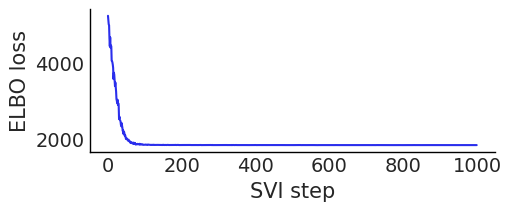

In [136]:
%%time
pyro.clear_param_store()
torch_data = torch.tensor(out)
steps = 1000

# These should be reset each training loop.
#auto_guide = pyro.infer.autoguide.AutoMultivariateNormal(basic_ddm_model)
adam = pyro.optim.Adam({"lr": 0.02})
#elbo = pyro.infer.Trace_ELBO(num_particles = 1, vectorize_particles = True)
elbo = pyro.infer.Trace_ELBO(num_particles = 10, vectorize_particles = True)
#elbo = pyro.infer.Trace_ELBO(num_particles = 1, vectorize_particles = True)
#svi = pyro.infer.SVI(basic_hierarchical_model, auto_guide, adam, elbo)

svi_levy = pyro.infer.SVI(basic_levy_model, auto_guide, adam, elbo)
losses = []
for step in range(steps if not smoke_test else 2):  # Consider running for more steps.
    loss = svi_levy.step(*(1000, torch_data))
    losses.append(loss)
    if step % 100 == 0:
        logging.info("Step {} out of {}, Elbo loss: {}".format(step, steps, loss))

plt.figure(figsize=(5, 2))
plt.plot(losses)
plt.xlabel("SVI step")
plt.ylabel("ELBO loss");

# #predictive = pyro.infer.Predictive(basic_hierarchical_model, guide = auto_guide, num_samples = 1000)
predictive = pyro.infer.Predictive(basic_levy_model, guide = auto_guide, num_samples = 1000)
svi_levy_samples = predictive(1000, torch.tensor(out)) #torch.tensor(data))
svi_levy_samples_new = {key_: svi_levy_samples[key_].numpy().squeeze() for key_ in svi_levy_samples.keys() if key_ != 'obs'}
az_levy_svi = az.from_dict(svi_levy_samples_new)

### Plots

array([[<AxesSubplot:ylabel='a'>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>],
       [<AxesSubplot:ylabel='z'>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>],
       [<AxesSubplot:ylabel='t'>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>],
       [<AxesSubplot:xlabel='v', ylabel='alpha'>,
        <AxesSubplot:xlabel='a'>, <AxesSubplot:xlabel='z'>,
        <AxesSubplot:xlabel='t'>]], dtype=object)

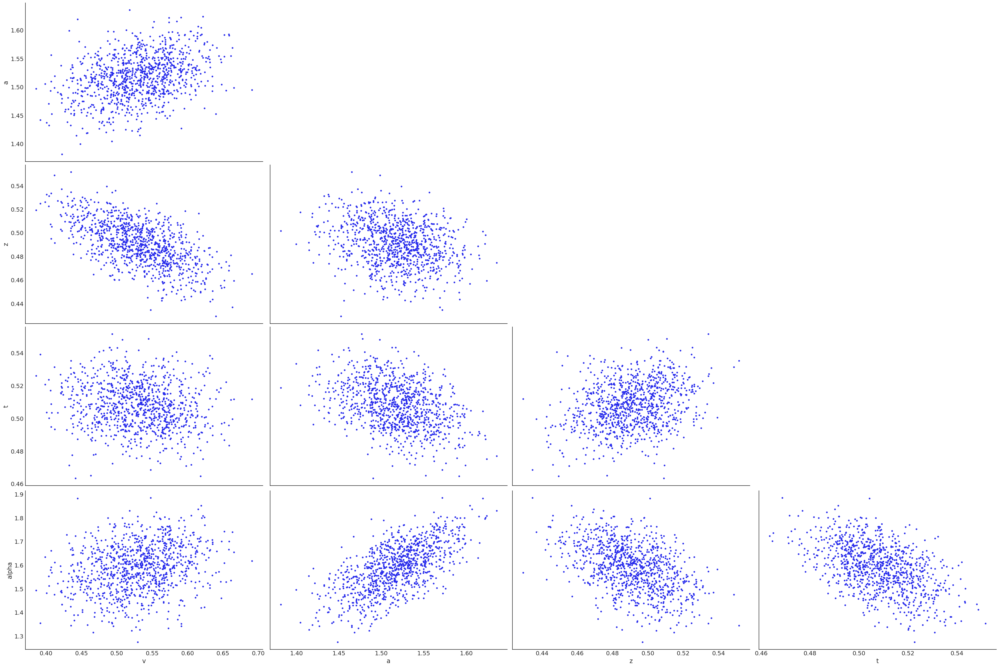

In [137]:
az.plot_pair(az_levy_svi, var_names = ['v', 'a', 'z', 't', 'alpha'])

array([[<AxesSubplot:ylabel='a'>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>],
       [<AxesSubplot:ylabel='z'>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>],
       [<AxesSubplot:ylabel='t'>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>],
       [<AxesSubplot:xlabel='v', ylabel='alpha'>,
        <AxesSubplot:xlabel='a'>, <AxesSubplot:xlabel='z'>,
        <AxesSubplot:xlabel='t'>]], dtype=object)

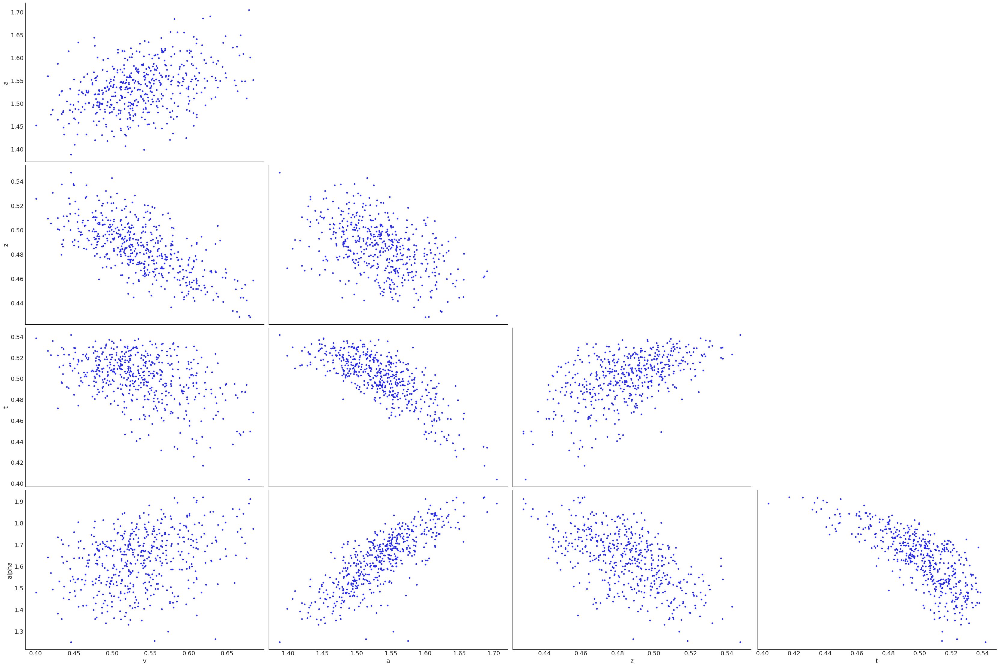

In [138]:
az.plot_pair(mcmc_levy_az, var_names = ['v', 'a', 'z', 't', 'alpha'])

## Define DDM - Hierarchical

In [10]:
base_dim = 1
n_samples = 500
v = torch.zeros(base_dim) + 0.5
a = torch.zeros(base_dim) + 1.5
z = torch.zeros(base_dim) + 0.5
t = torch.zeros(base_dim) + 0.5
theta = torch.vstack([v, a, z, t]).T
theta = theta.tile((n_samples, 1))
out = sim_wrap(theta = theta)
theta = torch.hstack([theta, out])

In [11]:
ssms.config.model_config['ddm']

{'name': 'ddm',
 'params': ['v', 'a', 'z', 't'],
 'param_bounds': [[-3.0, 0.3, 0.1, 0.0], [3.0, 2.5, 0.9, 2.0]],
 'boundary': <function ssms.basic_simulators.boundary_functions.constant(t=0)>,
 'n_params': 4,
 'default_params': [0.0, 1.0, 0.5, 0.001],
 'hddm_include': ['z'],
 'nchoices': 2}

(array([298., 227., 203., 123.,  86.,  33.,  16.,  10.,   3.,   1.]),
 array([4.05822357e-04, 5.48223409e-02, 1.09238860e-01, 1.63655378e-01,
        2.18071897e-01, 2.72488415e-01, 3.26904934e-01, 3.81321452e-01,
        4.35737971e-01, 4.90154490e-01, 5.44571008e-01]),
 <BarContainer object of 10 artists>)

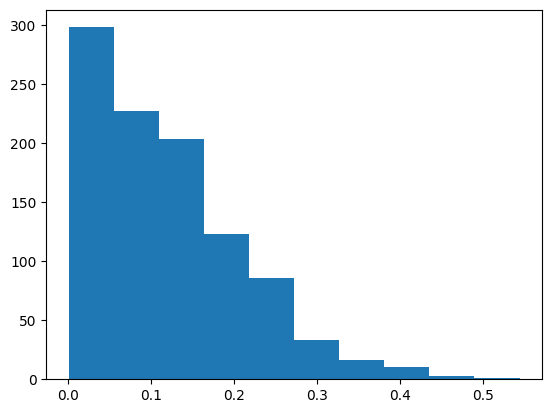

In [30]:
plt.hist(scipy.stats.halfnorm.rvs(loc = 0, scale = 0.15, size = 1000))

In [10]:
model_config = ssms.config.model_config["ddm"]
base_dim = 1
n_subjects = 20
n_samples_by_subject = 500
buffer_coefficient = 0.5

param_dict = {}
data_list = []
for param in model_config['params']:
    param_idx = model_config['params'].index(param)
    print('param')
    print(param)
    min_ = model_config['param_bounds'][0][param_idx]
    max_ = model_config['param_bounds'][1][param_idx]
    range_ = max_ - min_
    mean_ = (max_ + min_) / 2
    min_adj = mean_ - (0.5 * buffer_coefficient) * range_
    print(min_adj)
    max_adj = mean_ + (0.5 * buffer_coefficient) * range_
    print(max_adj)
    
    param_mu_mu = np.random.uniform(low = min_adj, high = max_adj) # potentially fix
    param_mu_std = np.random.uniform(low = 0.05, high = 0.1) # potentially fix
    param_mu = scipy.stats.norm.rvs(loc = param_mu_mu, scale = param_mu_std)
    param_std = scipy.stats.halfnorm.rvs(loc = 0, scale = 0.1) # potentially fix
    # param_std_std = scipy.stats.halfnorm(loc = 0, scale = 0.25) # potentially fix
    
    params_subj = np.random.normal(loc = param_mu, 
                                   scale = param_std, 
                                   size = n_subjects)
    
    param_dict[param + '_mu'] = param_mu.astype(np.float32)
    param_dict[param + '_std'] =  param_std.astype(np.float32)
    param_dict[param + '_subj'] = params_subj.astype(np.float32)
    
print(param_dict)
    
    
for i in range(n_subjects):
    v = torch.zeros(base_dim) + param_dict['v_subj'][i]
    a = torch.zeros(base_dim) + param_dict['a_subj'][i]
    z = torch.zeros(base_dim) + param_dict['z_subj'][i]
    t = torch.zeros(base_dim) + param_dict['t_subj'][i]
    
    theta = torch.vstack([v, a, z, t]).T
    theta = theta.tile((n_samples_by_subject, 1))
    out = sim_wrap(theta = theta)
    # theta = torch.hstack([theta, out])
    data_list.append(out)
    
#data = torch.stack(data_list).permute(2, 1, 0)
#data = torch.stack(data_list).permute(1, 2, 0)
#data = torch.stack(data_list).permute(2, 0, 1)
data = torch.stack(data_list).permute(1, 0, 2)

#data = torch.stack(data_list).unsqueeze(1).permute(2, 0, 3, 1)

param
v
-1.5
1.5
param
a
0.8499999999999999
1.95
param
z
0.3
0.7
param
t
0.5
1.5
{'v_mu': -1.5526872, 'v_std': 0.0012882757, 'v_subj': array([-1.5531745, -1.5533069, -1.5546418, -1.5533195, -1.5529972,
       -1.5535219, -1.551868 , -1.5504453, -1.5523049, -1.5517757,
       -1.5503389, -1.5521321, -1.5506997, -1.5538476, -1.5528637,
       -1.5510155, -1.5518172, -1.5526459, -1.5515043, -1.5521969],
      dtype=float32), 'a_mu': 1.9485394, 'a_std': 0.035523947, 'a_subj': array([1.955956 , 1.9602058, 1.9308405, 1.8742312, 1.9456055, 2.035757 ,
       1.8536155, 1.9160961, 1.9404643, 1.9581065, 1.9886978, 1.9855695,
       1.9948559, 1.9978963, 1.9252195, 1.9465408, 1.9307809, 1.9640427,
       1.935189 , 1.9157486], dtype=float32), 'z_mu': 0.43957964, 'z_std': 0.08247703, 'z_subj': array([0.33971325, 0.39806026, 0.38168773, 0.2767476 , 0.22054273,
       0.43482217, 0.38545933, 0.38500404, 0.5030332 , 0.36543238,
       0.5792659 , 0.29958847, 0.20919076, 0.4209274 , 0.4723584 ,
      

In [214]:
def broadcast_shape(*shapes, **kwargs):
    """
    Similar to ``np.broadcast()`` but for shapes.
    Equivalent to ``np.broadcast(*map(np.empty, shapes)).shape``.

    :param tuple shapes: shapes of tensors.
    :param bool strict: whether to use extend-but-not-resize broadcasting.
    :returns: broadcasted shape
    :rtype: tuple
    :raises: ValueError
    """
    strict = kwargs.pop("strict", False)
    reversed_shape = []
    for shape in shapes:
        for i, size in enumerate(reversed(shape)):
            if i >= len(reversed_shape):
                reversed_shape.append(size)
            elif reversed_shape[i] == 1 and not strict:
                reversed_shape[i] = size
            elif reversed_shape[i] != size and (size != 1 or strict):
                raise ValueError(
                    "shape mismatch: objects cannot be broadcast to a single shape: {}".format(
                        " vs ".join(map(str, shapes))
                    )
                )
    return tuple(reversed(reversed_shape))

In [218]:
broadcast_shape((10, 500), torch.Size([2, 10, 500])) #, strict = False)
    
#(500, 10) vs torch.Size([500, 2]

(2, 10, 500)

### Define DDM-hierarchical distribution

In [78]:
y = torch.rand(10, 1, 20)
tmp_params = torch.stack([y, y, y, y], dim = -1).tile(1, 500, 1, 1)
tmp_params

torch.Size([10, 500, 20, 4])

In [91]:
#ssms.config.model_config

In [72]:
from torch.distributions import transform_to

from typing import Callable, Optional

def init_to_uniform_custom(
    site: Optional[dict] = None,
    radius: float = 0.1,
    ):
    """
    Initialize to a random point in the area ``(-radius, radius)`` of
    unconstrained domain.

    :param float radius: specifies the range to draw an initial point in the
        unconstrained domain.
    """
    if site is None:
        return functools.partial(init_to_uniform, radius=radius)
    
    site_num = site['fn'].shape()
    print(site)
    # group level locs -------
    if site['name'] == 'v_mu_mu':
        return torch.rand(1) - 0.5
    
    if site['name'] == 'a_mu_mu':
        return (torch.rand(1) - 0.5) + 1.5
    
    if site['name'] == 'z_mu_mu':
        return (torch.rand(1) / 5) + 0.3
    
    if site['name'] == 't_mu_mu':
        return torch.rand(1) / 5
    
    if site['name'] == 'theta_mu_mu':
        return (torch.rand(1) / 10)
    
    if site['name'] == 'alpha_mu_mu':
        return (torch.rand(1) + 1.5)
    
    if site['name'] == 'beta_mu_mu':
        return (torch.rand(1) + 1.5)
    # -------
    
    # subject level locs -------
    if site['name'] == 'v_subj':
        print('passed')
        return torch.rand(site_num) - 0.5  
    
    if site['name'] == 'a_subj':
        print('passed')
        return (torch.rand(site_num) - 0.5) + 1.5
    
    if site['name'] == 'z_subj':
        print('passed')
        return (torch.rand(site_num) / 5) + 0.3
        
    if site['name'] == 't_subj':
        print('passed')
        return torch.rand(site_num) / 5
    
    if site['name'] == 'theta_subj':
        return (torch.rand(site_num) / 10)
    
    if site['name'] == 'alpha_subj':
        return (torch.rand(site_num) + 1.5)
    
    if site['name'] == 'beta_subj':
        return (torch.rand(site_num) + 1.5)
    
    # -------
    
    # std parameters keep the uniform random init
    value = site["fn"].sample().detach()
    t = transform_to(site["fn"].support)
    value = t(torch.rand_like(t.inv(value)) * (2 * radius) - radius)
    value._pyro_custom_init = False
    return value

In [162]:
import math
from numbers import Real
from numbers import Number

import torch
from torch.distributions import constraints
from torch.distributions.exp_family import ExponentialFamily
from torch.distributions.utils import _standard_normal, broadcast_all

network_config = pickle.load(open('nets/d27193a4153011ecb76ca0423f39a3e6_ddm_torch__network_config.pickle',
                                  'rb'))
network = lanfactory.trainers.torch_mlp.TorchMLP(network_config = network_config,
                                                 input_shape = 6)

network.load_state_dict(torch.load('nets/d27193a4153011ecb76ca0423f39a3e6_ddm_torch_state_dict.pt'))
network.eval()
#network = custom_torch_net

class MyDDMh(dist.TorchDistribution):
#     arg_constraints = {'loc': constraints.interval(-1, 1),
#                        'scale': constraints.interval(0.0001, 10)
#                       }
    def __init__(self, v, a, z, t, network):
        self.net = network
        self.n_samples = n_samples_by_subject
        self.boundaries = ssms.config.model_config['ddm']['param_bounds']
        self.out_of_bounds_val = -66.1
        self.v = v
        self.a = a
        self.z = z
        self.t = t
        
        print('v shape')
        print(self.v.size())
        
        if isinstance(v, Number): # and isinstance(a, Number):
            batch_shape = torch.Size()
        else:
            batch_shape = self.v.size()
            
        print('batch shape')
        print(batch_shape)
            
        super().__init__(batch_shape = batch_shape, 
                         event_shape = torch.Size((2,)), 
                         validate_args = False) #torch.Size((2,))) # event_shape = (1,))
        
    def sample(self):
        theta = torch.vstack([self.v, self.a, self.z, self.t]).T
        return sim_wrap(theta = theta, model = ssms.config.model_config['ddm']['name'])
    
    def log_prob(self, value):
        
        if self.v.dim() == 3:
            dat_tmp = value.repeat((self.v.size()[0], 1, 1, 1))
            # print('dat_tmp shape')
            # print(dat_tmp.shape)
            tmp_params = torch.stack([self.v, self.a, self.z, self.t], dim = -1).tile((1, self.n_samples, 1, 1))
            
            # print('tmp_params shape')
            # print(tmp_params.shape)
            
            net_in = torch.cat([tmp_params, dat_tmp], dim = -1)
            logp = torch.clip(self.net(net_in), min = -16.11)
            logp_squeezed = torch.squeeze(logp, dim = -1)
            
            # v constraint
            logp_squeezed = torch.where(net_in[..., 0] < torch.tensor(3.), logp_squeezed, torch.tensor(self.out_of_bounds_val))
            logp_squeezed = torch.where(net_in[..., 0] > torch.tensor(-3.), logp_squeezed, torch.tensor(self.out_of_bounds_val))

            # a constraint
            logp_squeezed = torch.where(net_in[..., 1] < torch.tensor(2.5), logp_squeezed, torch.tensor(self.out_of_bounds_val))
            logp_squeezed = torch.where(net_in[..., 1] > torch.tensor(0.3), logp_squeezed, torch.tensor(self.out_of_bounds_val))

            # z constraint
            logp_squeezed = torch.where(net_in[..., 2] < torch.tensor(0.9), logp_squeezed, torch.tensor(self.out_of_bounds_val))
            logp_squeezed = torch.where(net_in[..., 2] > torch.tensor(0.1), logp_squeezed, torch.tensor(self.out_of_bounds_val))

            # t constraint
            logp_squeezed = torch.where(net_in[..., 3] < torch.tensor(2.0), logp_squeezed, torch.tensor(self.out_of_bounds_val))
            logp_squeezed = torch.where(net_in[..., 3] > torch.tensor(0.0), logp_squeezed, torch.tensor(self.out_of_bounds_val))
            
            logp_squeezed = logp_squeezed #.unsqueeze(1)
        else: # single particle:
            tmp_params = torch.stack([self.v, self.a, self.z, self.t], dim = -1).tile((self.n_samples, 1, 1))

            net_in = torch.cat([tmp_params, value], dim = -1)
            logp = torch.clip(self.net(net_in), min = -16.11)
            logp_squeezed = torch.squeeze(logp, dim = -1)

            # v constraint
            logp_squeezed = torch.where(net_in[:, :, 0] < torch.tensor(3.), logp_squeezed, torch.tensor(self.out_of_bounds_val))
            logp_squeezed = torch.where(net_in[:, :, 0] > torch.tensor(-3.), logp_squeezed, torch.tensor(self.out_of_bounds_val))

            # a constraint
            logp_squeezed = torch.where(net_in[:, :, 1] < torch.tensor(2.5), logp_squeezed, torch.tensor(self.out_of_bounds_val))
            logp_squeezed = torch.where(net_in[:, :, 1] > torch.tensor(0.3), logp_squeezed, torch.tensor(self.out_of_bounds_val))

            # z constraint
            logp_squeezed = torch.where(net_in[:, :, 2] < torch.tensor(0.9), logp_squeezed, torch.tensor(self.out_of_bounds_val))
            logp_squeezed = torch.where(net_in[:, :, 2] > torch.tensor(0.1), logp_squeezed, torch.tensor(self.out_of_bounds_val))

            # t constraint
            logp_squeezed = torch.where(net_in[:, :, 3] < torch.tensor(2.0), logp_squeezed, torch.tensor(self.out_of_bounds_val))
            logp_squeezed = torch.where(net_in[:, :, 3] > torch.tensor(0.0), logp_squeezed, torch.tensor(self.out_of_bounds_val))

            #logp_squeezed = logp.reshape((self.n_samples, -1))
            #logp_squeezed = torch.squeeze(logp, dim = -1)
            
        # print('logp out shape')
        # print(logp_squeezed.shape)
        
        return logp_squeezed

tanh
tanh
linear


In [126]:
myval = torch.rand((8, 6, 4, 2))
myval.tile((2,2)).shape

torch.Size([8, 6, 8, 4])

In [59]:
y = torch.zeros((100, 4, 3))
y[..., 0].shape

torch.Size([100, 4])

In [118]:
myval = torch.rand((2, 1, 20, 4))
myval.tile((100, 1, 1, 1, 1,)).swapaxes(2, 1).swapaxes(0, 2).shape

torch.Size([2, 1, 100, 20, 4])

In [119]:
#myval = torch.rand((2, 1, 20, 4))
myval.unsqueeze(2).tile((1, 1, 100, 1, 1)).shape

torch.Size([2, 1, 100, 20, 4])

In [120]:
test = myval.unsqueeze(2).repeat((1, 1, 100, 1, 1))

In [123]:
test[0, 0, 1, :, :]

tensor([[0.0769, 0.7923, 0.5316, 0.5008],
        [0.3854, 0.2278, 0.5274, 0.3501],
        [0.6702, 0.8218, 0.8306, 0.6341],
        [0.7626, 0.6133, 0.5398, 0.8636],
        [0.2139, 0.3029, 0.6563, 0.0784],
        [0.1247, 0.9852, 0.1963, 0.1626],
        [0.0121, 0.1624, 0.3364, 0.7414],
        [0.0925, 0.4881, 0.0674, 0.4471],
        [0.9295, 0.1155, 0.6225, 0.7328],
        [0.2168, 0.0668, 0.2599, 0.4687],
        [0.9065, 0.5406, 0.7992, 0.6534],
        [0.0150, 0.6795, 0.2021, 0.0329],
        [0.7007, 0.2726, 0.2339, 0.9138],
        [0.0396, 0.8337, 0.7036, 0.6524],
        [0.3721, 0.5455, 0.9462, 0.1321],
        [0.2984, 0.7744, 0.1693, 0.6025],
        [0.9111, 0.5350, 0.5695, 0.9681],
        [0.0354, 0.1762, 0.3510, 0.3780],
        [0.8665, 0.0498, 0.8159, 0.2516],
        [0.1035, 0.5845, 0.9813, 0.4174]])

In [124]:
myval[0, 0, :, :]

tensor([[0.0769, 0.7923, 0.5316, 0.5008],
        [0.3854, 0.2278, 0.5274, 0.3501],
        [0.6702, 0.8218, 0.8306, 0.6341],
        [0.7626, 0.6133, 0.5398, 0.8636],
        [0.2139, 0.3029, 0.6563, 0.0784],
        [0.1247, 0.9852, 0.1963, 0.1626],
        [0.0121, 0.1624, 0.3364, 0.7414],
        [0.0925, 0.4881, 0.0674, 0.4471],
        [0.9295, 0.1155, 0.6225, 0.7328],
        [0.2168, 0.0668, 0.2599, 0.4687],
        [0.9065, 0.5406, 0.7992, 0.6534],
        [0.0150, 0.6795, 0.2021, 0.0329],
        [0.7007, 0.2726, 0.2339, 0.9138],
        [0.0396, 0.8337, 0.7036, 0.6524],
        [0.3721, 0.5455, 0.9462, 0.1321],
        [0.2984, 0.7744, 0.1693, 0.6025],
        [0.9111, 0.5350, 0.5695, 0.9681],
        [0.0354, 0.1762, 0.3510, 0.3780],
        [0.8665, 0.0498, 0.8159, 0.2516],
        [0.1035, 0.5845, 0.9813, 0.4174]])

In [181]:
torch.vstack([torch.tensor(3.0), torch.tensor(3.0), torch.tensor(3.0), torch.tensor(3.0)]).shape

torch.Size([4])

In [238]:
import math
from numbers import Real
from numbers import Number

import torch
from torch.distributions import constraints
from torch.distributions.exp_family import ExponentialFamily
from torch.distributions.utils import _standard_normal, broadcast_all

network_config = pickle.load(open('nets/d27193a4153011ecb76ca0423f39a3e6_ddm_torch__network_config.pickle',
                                  'rb'))
network = lanfactory.trainers.torch_mlp.TorchMLP(network_config = network_config,
                                                 input_shape = 6)

network.load_state_dict(torch.load('nets/d27193a4153011ecb76ca0423f39a3e6_ddm_torch_state_dict.pt'))
network.eval()

class MyDDMh_new(dist.TorchDistribution):
#     arg_constraints = {'loc': constraints.interval(-1, 1),
#                        'scale': constraints.interval(0.0001, 10)
#                       }
    def __init__(self, params, network, ssm_name):
        self.net = network
        self.n_samples = n_samples_by_subject
        self.boundaries = ssms.config.model_config[ssm_name]['param_bounds']
        self.out_of_bounds_val = -66.1
        self.params = params
        self.ssm_name = ssm_name
        self.params_shape = self.params.size()
        batch_shape = self.params.size()[:-1]
        
        super().__init__(batch_shape = batch_shape, #torch.Size((my_size,)),
                         event_shape = torch.Size((2,)), 
                         validate_args = False) #torch.Size((2,))) # event_shape = (1,))
        
    def sample(self):
        #theta = torch.vstack([self.v, self.a, self.z, self.t]).T
        return sim_wrap(theta = self.params, model = self.ssm_name, n_samples = self.n_samples)
    
    def log_prob(self, value):
        
        if self.params.dim() == 3:
            tmp_dat = value.repeat((self.params_shape[0], 1, 1, 1))
            tmp_params = self.params.unsqueeze(1).tile((1, self.n_samples, 1, 1))         
        elif self.params.dim() == 4:
            tmp_dat = value.repeat(self.params_shape[0], self.params_shape[1], 1, 1, 1)
            tmp_params = self.params.unsqueeze(2).tile((1, 1, self.n_samples, 1, 1))
            
            #myval.unsqueeze(2).repeat((1, 1, 100, 1, 1))
        else:
            tmp_dat = value
            tmp_params = self.params.tile((self.n_samples, 1, 1))
        
        net_in = torch.cat([tmp_params, tmp_dat], dim = -1)
        
        logp = torch.clip(self.net(net_in), min = -16.11)
        logp_squeezed = torch.squeeze(logp, dim = -1)
        
        for i in range(ssms.config.model_config[self.ssm_name]['n_params']):
            logp_squeezed = torch.where(net_in[..., i] < torch.tensor(self.boundaries[1][i]), 
                                        logp_squeezed, 
                                        torch.tensor(self.out_of_bounds_val))
            logp_squeezed = torch.where(net_in[..., i] > torch.tensor(self.boundaries[0][i]), 
                                        logp_squeezed, 
                                        torch.tensor(self.out_of_bounds_val))
        
        logp_squeezed = torch.squeeze(logp_squeezed) #, dim = 0) #.unsqueeze(1)
        return logp_squeezed

tanh
tanh
linear


In [239]:
myddmclass = MyDDMh_new(torch.randn(2, 1, 20, 4), network, 'ddm')

In [241]:
myddmclass.sample().shape

(2, 500, 20, 2)

### Define DDM Model

In [156]:
def hierarchical_ddm_model_new(num_subjects, num_trials, data, network, ssm_name):
    #v_mu_mu = pyro.sample("v_mu_mu", dist.Uniform(-3, 3))
    v_mu_mu = pyro.sample("v_mu_mu", dist.Normal(0, 0.5))
    v_mu_std = pyro.sample("v_mu_std", dist.HalfNormal(100.))
    
    #a_mu_mu = pyro.sample("a_mu_mu", dist.Uniform(0.3, 2.5))
    a_mu_std = pyro.sample("a_mu_std", dist.HalfNormal(100.))
    a_mu_mu = pyro.sample("a_mu_mu", dist.Normal(1.5, 0.5))

    #z_mu_mu = pyro.sample("z_mu_mu", dist.Uniform(0.1, 0.9))
    z_mu_std = pyro.sample("z_mu_std", dist.HalfNormal(100.))
    z_mu_mu = pyro.sample("z_mu_mu", dist.Normal(0.5, 0.1))
    
    #t_mu_mu = pyro.sample("t_mu_mu", dist.Uniform(0.0, 2.0))
    t_mu_std = pyro.sample("t_mu_std", dist.HalfNormal(100.))
    t_mu_mu = pyro.sample("t_mu_mu", dist.Normal(1.0, 0.5))

    with pyro.plate("subjects", num_subjects) as subjects_plate:
        v_subj = pyro.sample("v_subj", dist.Normal(v_mu_mu, v_mu_std))
        a_subj = pyro.sample("a_subj", dist.Normal(a_mu_mu, a_mu_std))
        z_subj = pyro.sample("z_subj", dist.Normal(z_mu_mu, z_mu_std))
        t_subj = pyro.sample("t_subj", dist.Normal(t_mu_mu, t_mu_std))
        with pyro.plate("data", num_trials) as data_plate:
            return pyro.sample("obs", 
                               MyDDMh_new(torch.stack([v_subj, a_subj, z_subj, t_subj], dim = -1), 
                                          network, 
                                          ssm_name), 
                               obs = data)

In [75]:
def hierarchical_ddm_model(num_subjects, num_trials, data, network = None):
    #v_mu_mu = pyro.sample("v_mu_mu", dist.Uniform(-3, 3))
    v_mu_mu = pyro.sample("v_mu_mu", dist.Normal(0, 0.5))
    v_mu_std = pyro.sample("v_mu_std", dist.HalfNormal(100.))
    
    #a_mu_mu = pyro.sample("a_mu_mu", dist.Uniform(0.3, 2.5))
    a_mu_std = pyro.sample("a_mu_std", dist.HalfNormal(100.))
    a_mu_mu = pyro.sample("a_mu_mu", dist.Normal(1.5, 0.5))

    #z_mu_mu = pyro.sample("z_mu_mu", dist.Uniform(0.1, 0.9))
    z_mu_std = pyro.sample("z_mu_std", dist.HalfNormal(100.))
    z_mu_mu = pyro.sample("z_mu_mu", dist.Normal(0.5, 0.1))
    
    #t_mu_mu = pyro.sample("t_mu_mu", dist.Uniform(0.0, 2.0))
    t_mu_std = pyro.sample("t_mu_std", dist.HalfNormal(100.))
    t_mu_mu = pyro.sample("t_mu_mu", dist.Normal(1.0, 0.5))

    with pyro.plate("subjects", num_subjects) as subjects_plate:
        v_subj = pyro.sample("v_subj", dist.Normal(v_mu_mu, v_mu_std))
        a_subj = pyro.sample("a_subj", dist.Normal(a_mu_mu, a_mu_std))
        z_subj = pyro.sample("z_subj", dist.Normal(z_mu_mu, z_mu_std))
        t_subj = pyro.sample("t_subj", dist.Normal(t_mu_mu, t_mu_std))
        with pyro.plate("data", num_trials) as data_plate:
            return pyro.sample("obs", 
                               MyDDMh(v_subj, a_subj, z_subj, t_subj, network), 
                               obs = data)

In [ ]:
# def ddm_hierarchical_guide(num_subjects, num_trials, model_config, network, data):
#     params_group_locs = pyro.param('group_params_mu', lambda:torch.tensor([0., 1., 0.5, 0.5]),
#                                    constraints.interval(torch.tensor([-3., 0.3, 0.1, 0.0]), torch.tensor([3., 2.5, 0.9, 2.0])))
#     params_group_cov = pyro.param('group_params_cov', lambda:torch.eye(4, 4) * 0.01,
#                             constraint = constraints.positive_definite)
    
#     params_subj_mus_list = []
#     params_subj_covs_list = []
    
#     for i in range(num_subjects):
#         params_subj_loc_list.append(pyro.param('params_subj_mu_' + str(i), lambda:torch.tensor([0., 1., 0.5, 0.5]),
#                                    constraints.interval(torch.tensor([-3., 0.3, 0.1, 0.0]), torch.tensor([3., 2.5, 0.9, 2.0])))
#         params_subj_covs_list.append(pyro.param('params_subj_cov_' + str(i), lambda:torch.eye(4, 4) * 0.01,
#                                     constraint = constraints.positive_definite))
                                     
#     # Define actual guide distribution
#     params_group =                                 
                                     

In [ ]:
# def ddm_collapsed_guide(num_trials, model_config, network, data):
#     params_locs = pyro.param('params_locs', lambda:torch.tensor([0., 1., 0.5, 0.5]),
#                              constraint = constraints.interval(torch.tensor([-3., 0.3, 0.1, 0.0]), torch.tensor([3., 2.5, 0.9, 2.0])))
#     params_cov = pyro.param('cov_params', lambda:torch.eye(4, 4) * 0.01,
#                             constraint = constraints.positive_definite)
    
#     #with pyro.plat("data", num_trials) as data_plate:
#     params = pyro.sample("params", dist.MultivariateNormal(loc = params_locs, covariance_matrix = params_cov))
    
#     return {'params_locs': params_locs,
#             'params_cov': params_cov,
#             'params': params}
    

In [196]:
def hierarchical_noncentered_ddm_model(num_subjects, num_trials, data):
    v_mu_mu = pyro.sample("v_mu_mu", dist.Uniform(-3, 3))
    v_mu_std = pyro.sample("v_mu_std", dist.HalfNormal(1.))
    
    a_mu_mu = pyro.sample("a_mu_mu", dist.Uniform(0.3, 2.5))
    a_mu_std = pyro.sample("a_mu_std", dist.HalfNormal(1.))
    
    z_mu_mu = pyro.sample("z_mu_mu", dist.Uniform(0.1, 0.9))
    z_mu_std = pyro.sample("z_mu_std", dist.HalfNormal(1.))
    
    t_mu_mu = pyro.sample("t_mu_mu", dist.Uniform(0.0, 2.0))
    t_mu_std = pyro.sample("t_mu_std", dist.HalfNormal(1.))
    
    with pyro.plate("subjects", num_subjects) as subjects_plate:
        v_subj_z = pyro.sample("v_subj_z", 
                               dist.Normal(torch.tensor(0.0), torch.tensor(1.0)))
        a_subj_z = pyro.sample("a_subj_z", 
                               dist.Normal(torch.tensor(0.0), torch.tensor(1.0)))
        z_subj_z = pyro.sample("z_subj_z", 
                               dist.Normal(torch.tensor(0.0), torch.tensor(1.0)))
        t_subj_z = pyro.sample("t_subj_z", 
                               dist.Normal(torch.tensor(0.0), torch.tensor(1.0)))
        
        v_subj = pyro.deterministic("v_subj", v_mu_mu + (v_subj_z * v_mu_std))
        a_subj = pyro.deterministic("a_subj", a_mu_mu + (a_subj_z * a_mu_std))
        z_subj = pyro.deterministic("z_subj", z_mu_mu + (z_subj_z * z_mu_std))
        t_subj = pyro.deterministic("t_subj", t_mu_mu + (t_subj_z * t_mu_std))

        with pyro.plate("data", num_trials) as data_plate:
            return pyro.sample("obs", 
                               MyDDMh(v_subj, a_subj, z_subj, t_subj), 
                               obs = data)

In [143]:
auto_guide_hierarchical = pyro.infer.autoguide.AutoMultivariateNormal(hierarchical_ddm_model, init_scale = 0.02, init_loc_fn = init_to_uniform_custom)

In [ ]:
#auto_guide_hierarchical = pyro.infer.autoguide.AutoMultivariateNormal(hierarchical_ddm_model, init_scale = 0.02, init_loc_fn = init_to_uniform_custom)

In [73]:
def my_init(site = None, values = 0):
    print(site)
    return

In [21]:
from torch.distributions import transform_to

from typing import Callable, Optional

def init_to_uniform(
    site: Optional[dict] = None,
    radius: float = 2.0,
    ):
    """
    Initialize to a random point in the area ``(-radius, radius)`` of
    unconstrained domain.

    :param float radius: specifies the range to draw an initial point in the
        unconstrained domain.
    """
    if site is None:
        return functools.partial(init_to_uniform, radius=radius)

    print('value 1')
    value = site["fn"].sample().detach()
    print(value)
    t = transform_to(site["fn"].support)
    value = t(torch.rand_like(t.inv(value)) * (2 * radius) - radius)
    value._pyro_custom_init = False
    print('site')
    print(site)
    print('value 2')
    print(value)
    return value

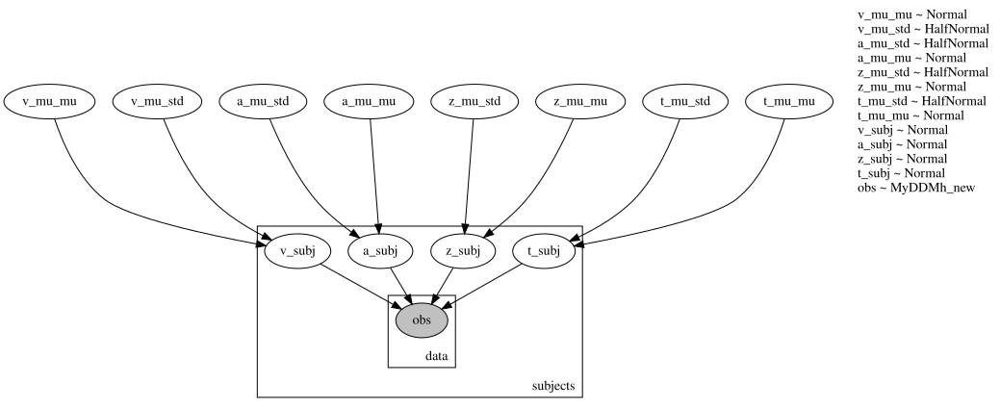

In [158]:
#import ipdb
pyro.render_model(hierarchical_ddm_model_new, 
                  model_args = (n_subjects, 
                                n_samples_by_subject, 
                                data,
                                network,
                                'ddm'), 
                  render_distributions = True, 
                  render_params = True)

v shape
torch.Size([20])
batch shape
torch.Size([20])


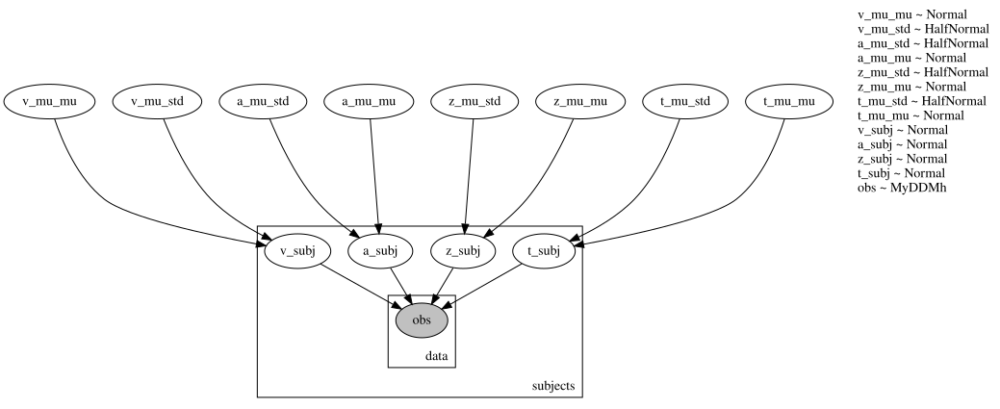

In [76]:
#import ipdb
pyro.render_model(hierarchical_ddm_model, 
                  model_args = (n_subjects, 
                                n_samples_by_subject, 
                                data,
                                network), 
                  render_distributions = True, 
                  render_params = True)

In [39]:
#import ipdb
pyro.render_model(hierarchical_noncentered_ddm_model, 
                  model_args = (n_subjects, 
                                n_samples_by_subject, 
                                data),
                  render_distributions = True,
                  render_params = True)

NameError: name 'hierarchical_noncentered_ddm_model' is not defined

### Sample / NUTS

#### Centered

In [159]:
# NUTS VERSION
from pyro.infer import MCMC, NUTS
#torch_data = torch.tensor(out)
num_chains = 1

nuts_kernel = NUTS(hierarchical_ddm_model_new,
                   step_size = 0.01,
                   max_tree_depth = 5)
                   #jit_compile = True,
                   #ignore_jit_warnings = True)
                   #max_tree_depth = 1)

mcmc = MCMC(nuts_kernel, 
            num_samples = 100, 
            warmup_steps = 100, 
            num_chains = num_chains, 
            initial_params = {'v_mu_mu': torch.tensor(param_dict['v_mu']).repeat(num_chains, 1),
                              'v_mu_std': torch.tensor(param_dict['v_std']).repeat(num_chains, 1),
                              'a_mu_mu': torch.tensor(param_dict['a_mu']).repeat(num_chains, 1),
                              'a_mu_std': torch.tensor(param_dict['a_std']).repeat(num_chains, 1),
                              'z_mu_mu': torch.tensor(param_dict['z_mu']).repeat(num_chains, 1),
                              'z_mu_std': torch.tensor(param_dict['z_std']).repeat(num_chains, 1),
                              't_mu_mu': torch.tensor(param_dict['t_mu']).repeat(num_chains, 1),
                              't_mu_std': torch.tensor(param_dict['t_std']).repeat(num_chains, 1),
                              'v_subj': torch.tensor(param_dict['v_subj']).repeat(num_chains, 1),
                              'a_subj': torch.tensor(param_dict['a_subj']).repeat(num_chains, 1),
                              'z_subj': torch.tensor(param_dict['z_subj']).repeat(num_chains, 1),
                              't_subj': torch.tensor(param_dict['t_subj']).repeat(num_chains, 1),
                              }
           )
mcmc.run(n_subjects, n_samples_by_subject, data, network, 'ddm')
hmc_samples = {k: v.detach().cpu().numpy() for k, v in mcmc.get_samples().items()}

hmc_samples_new = {}
#hmc_samples_new['v'] = np.expand_dims(hmc_samples['v'], axis = (1))
#hmc_samples_new['a'] = np.expand_dims(hmc_samples['v'], axis = (1))
#hmc_samples_new['z'] = np.expand_dims(hmc_samples['v'], axis = (1))
#hmc_samples_new['t'] = np.expand_dims(hmc_samples['v'], axis = (1))
#hmc_samples_new['g_mu_std'] = np.expand_dims(hmc_samples['g_mu_std'], axis = (1,2))
#hmc_samples_new['subj_mu'] = np.expand_dims(hmc_samples['subj_mu'], axis = 1)

Warmup:   4%|▎         | 7/200 [00:05,  1.15it/s, step size=5.13e-03, acc. prob=0.727]

KeyboardInterrupt: 

In [33]:
# NUTS VERSION
from pyro.infer import MCMC, NUTS
#torch_data = torch.tensor(out)
num_chains = 1

nuts_kernel = NUTS(hierarchical_ddm_model,
                   step_size = 0.01,
                   max_tree_depth = 5)
                   #jit_compile = True,
                   #ignore_jit_warnings = True)
                   #max_tree_depth = 1)

mcmc = MCMC(nuts_kernel, 
            num_samples = 100, 
            warmup_steps = 100, 
            num_chains = num_chains, 
            initial_params = {'v_mu_mu': torch.tensor(param_dict['v_mu']).repeat(num_chains, 1),
                              'v_mu_std': torch.tensor(param_dict['v_std']).repeat(num_chains, 1),
                              'a_mu_mu': torch.tensor(param_dict['a_mu']).repeat(num_chains, 1),
                              'a_mu_std': torch.tensor(param_dict['a_std']).repeat(num_chains, 1),
                              'z_mu_mu': torch.tensor(param_dict['z_mu']).repeat(num_chains, 1),
                              'z_mu_std': torch.tensor(param_dict['z_std']).repeat(num_chains, 1),
                              't_mu_mu': torch.tensor(param_dict['t_mu']).repeat(num_chains, 1),
                              't_mu_std': torch.tensor(param_dict['t_std']).repeat(num_chains, 1),
                              'v_subj': torch.tensor(param_dict['v_subj']).repeat(num_chains, 1),
                              'a_subj': torch.tensor(param_dict['a_subj']).repeat(num_chains, 1),
                              'z_subj': torch.tensor(param_dict['z_subj']).repeat(num_chains, 1),
                              't_subj': torch.tensor(param_dict['t_subj']).repeat(num_chains, 1),
                              }
           )
mcmc.run(n_subjects, n_samples_by_subject, data, network = network)
hmc_samples = {k: v.detach().cpu().numpy() for k, v in mcmc.get_samples().items()}

hmc_samples_new = {}
#hmc_samples_new['v'] = np.expand_dims(hmc_samples['v'], axis = (1))
#hmc_samples_new['a'] = np.expand_dims(hmc_samples['v'], axis = (1))
#hmc_samples_new['z'] = np.expand_dims(hmc_samples['v'], axis = (1))
#hmc_samples_new['t'] = np.expand_dims(hmc_samples['v'], axis = (1))
#hmc_samples_new['g_mu_std'] = np.expand_dims(hmc_samples['g_mu_std'], axis = (1,2))
#hmc_samples_new['subj_mu'] = np.expand_dims(hmc_samples['subj_mu'], axis = 1)

Warmup:   0%|          | 0/200 [00:00, ?it/s]

v shape
torch.Size([20])
batch shape
torch.Size([20])
v shape
torch.Size([20])
batch shape
torch.Size([20])
v shape
torch.Size([1, 20])
batch shape
torch.Size([1, 20])
v shape
torch.Size([1, 20])
batch shape
torch.Size([1, 20])
v shape
torch.Size([1, 20])
batch shape
torch.Size([1, 20])
v shape
torch.Size([1, 20])
batch shape
torch.Size([1, 20])
v shape
torch.Size([1, 20])
batch shape
torch.Size([1, 20])
v shape
torch.Size([1, 20])
batch shape
torch.Size([1, 20])
v shape
torch.Size([1, 20])
batch shape
torch.Size([1, 20])
v shape
torch.Size([1, 20])
batch shape
torch.Size([1, 20])
v shape
torch.Size([1, 20])
batch shape
torch.Size([1, 20])
v shape
torch.Size([1, 20])
batch shape
torch.Size([1, 20])
v shape
torch.Size([1, 20])
batch shape
torch.Size([1, 20])
v shape
torch.Size([1, 20])
batch shape
torch.Size([1, 20])
v shape
torch.Size([1, 20])
batch shape
torch.Size([1, 20])
v shape
torch.Size([1, 20])
batch shape
torch.Size([1, 20])
v shape
torch.Size([1, 20])
batch shape
torch.Size([

Warmup:   0%|          | 1/200 [00:01,  1.18s/it, step size=3.59e-02, acc. prob=1.000]

v shape
torch.Size([1, 20])
batch shape
torch.Size([1, 20])
v shape
torch.Size([1, 20])
batch shape
torch.Size([1, 20])
v shape
torch.Size([1, 20])
batch shape
torch.Size([1, 20])
v shape
torch.Size([1, 20])
batch shape
torch.Size([1, 20])
v shape
torch.Size([1, 20])
batch shape
torch.Size([1, 20])
v shape
torch.Size([1, 20])
batch shape
torch.Size([1, 20])
v shape
torch.Size([1, 20])
batch shape
torch.Size([1, 20])
v shape
torch.Size([1, 20])
batch shape
torch.Size([1, 20])
v shape
torch.Size([1, 20])
batch shape
torch.Size([1, 20])
v shape
torch.Size([1, 20])
batch shape
torch.Size([1, 20])
v shape
torch.Size([1, 20])
batch shape
torch.Size([1, 20])
v shape
torch.Size([1, 20])
batch shape
torch.Size([1, 20])
v shape
torch.Size([1, 20])
batch shape
torch.Size([1, 20])
v shape
torch.Size([1, 20])
batch shape
torch.Size([1, 20])
v shape
torch.Size([1, 20])
batch shape
torch.Size([1, 20])
v shape
torch.Size([1, 20])
batch shape
torch.Size([1, 20])
v shape
torch.Size([1, 20])
batch shape


KeyboardInterrupt: 

In [45]:
mcmc.get_samples()['a_mu_mu'].shape

torch.Size([100, 1, 1])

In [46]:
mcmc.get_samples()['a_subj'].shape

torch.Size([100, 1, 20])

In [47]:
az_mcmc = az.from_pyro(mcmc)

/users/afengler/data/software/miniconda3/envs/lanfactory/lib/python3.7/site-packages/torch/distributions/distribution.py:46: UserWarning: <class '__main__.MyDDMh'> does not define `arg_constraints`. Please set `arg_constraints = {}` or initialize the distribution with `validate_args=False` to turn off validation.
  'with `validate_args=False` to turn off validation.')


In [89]:
az_mcmc

Inference data with groups:
	> posterior
	> log_likelihood
	> sample_stats
	> observed_data

array([[<AxesSubplot:ylabel='a_subj\n0, 0'>, <AxesSubplot:>,
        <AxesSubplot:>],
       [<AxesSubplot:ylabel='z_subj\n0, 0'>, <AxesSubplot:>,
        <AxesSubplot:>],
       [<AxesSubplot:xlabel='v_subj\n0, 0', ylabel='t_subj\n0, 0'>,
        <AxesSubplot:xlabel='a_subj\n0, 0'>,
        <AxesSubplot:xlabel='z_subj\n0, 0'>]], dtype=object)

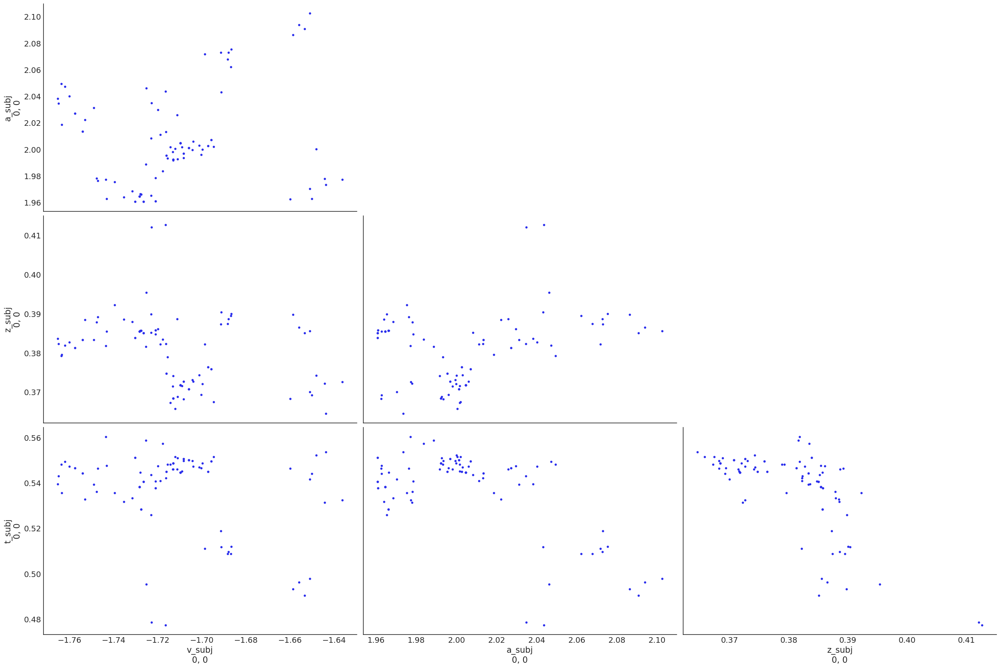

In [174]:
az.plot_pair(az_mcmc, var_names = ['v_subj', 'a_subj', 'z_subj', 't_subj'], coords = {'t_subj_dim_1': [0],
                                                                                      'a_subj_dim_1': [0],
                                                                                      'z_subj_dim_1': [0],
                                                                                      'v_subj_dim_1': [0]})

In [18]:
cpickle.dump(mcmc, open('pyro_save_test.pyro', 'wb'))

In [20]:
mcmc_loaded = cpickle.load(open('pyro_save_test.pyro', 'rb'))

In [21]:
import arviz as az

In [152]:
# NUTS VERSION
# from pyro.infer import MCMC, NUTS
# #torch_data = torch.tensor(out)

# nuts_kernel = NUTS(hierarchical_ddm_model,
#                    step_size = 0.01,
#                    max_tree_depth = 5)
#                    #jit_compile = True,
#                    #ignore_jit_warnings = True)
#                    #max_tree_depth = 1)

# mcmc = MCMC(nuts_kernel, 
#             num_samples = 100, 
#             warmup_steps = 100, 
#             num_chains = 1, 
#             initial_params = {'v_mu_mu': torch.tensor(param_dict['v_mu']),
#                               'v_mu_std': torch.tensor(param_dict['v_std']),
#                               'a_mu_mu': torch.tensor(param_dict['a_mu']),
#                               'a_mu_std': torch.tensor(param_dict['a_std']),
#                               'z_mu_mu': torch.tensor(param_dict['z_mu']),
#                               'z_mu_std': torch.tensor(param_dict['z_std']),
#                               't_mu_mu': torch.tensor(param_dict['t_mu']),
#                               't_mu_std': torch.tensor(param_dict['t_std']),
#                               'v_subj': torch.tensor(param_dict['v_subj']),
#                               'a_subj': torch.tensor(param_dict['a_subj']),
#                               'z_subj': torch.tensor(param_dict['z_subj']),
#                               't_subj': torch.tensor(param_dict['t_subj']),
#                               }
#            )
# mcmc.run(n_subjects, n_samples_by_subject, data)
# hmc_samples = {k: v.detach().cpu().numpy() for k, v in mcmc.get_samples().items()}

# hmc_samples_new = {}
#hmc_samples_new['v'] = np.expand_dims(hmc_samples['v'], axis = (1))
#hmc_samples_new['a'] = np.expand_dims(hmc_samples['v'], axis = (1))
#hmc_samples_new['z'] = np.expand_dims(hmc_samples['v'], axis = (1))
#hmc_samples_new['t'] = np.expand_dims(hmc_samples['v'], axis = (1))
#hmc_samples_new['g_mu_std'] = np.expand_dims(hmc_samples['g_mu_std'], axis = (1,2))
#hmc_samples_new['subj_mu'] = np.expand_dims(hmc_samples['subj_mu'], axis = 1)

In [181]:
param_dict.keys()

dict_keys(['v_mu', 'v_std', 'v_subjects', 'a_mu', 'a_std', 'a_subjects', 'z_mu', 'z_std', 'z_subjects', 't_mu', 't_std', 't_subjects'])

In [182]:
param_dict

{'v_mu': 0.074449174,
 'v_std': 0.16536614,
 'v_subjects': array([ 0.30066875,  0.0786009 ,  0.0090498 ,  0.2868434 ,  0.1672654 ,
         0.11409166,  0.15380824,  0.08466102, -0.10257731, -0.13609664,
         0.2265986 ,  0.24889697,  0.16379453,  0.12555781,  0.23499675,
         0.26540145,  0.14433436,  0.23968449,  0.2205535 , -0.01322781],
       dtype=float32),
 'a_mu': 0.9268145,
 'a_std': 0.06799549,
 'a_subjects': array([0.8994963 , 1.0587475 , 0.8422006 , 0.9906833 , 0.9104406 ,
        0.94522816, 0.8523227 , 1.0900949 , 0.9077819 , 1.0648998 ,
        0.92124295, 0.8439534 , 0.8719509 , 1.0164354 , 0.88746965,
        0.93239367, 1.0217301 , 1.0003774 , 0.8576929 , 0.9069599 ],
       dtype=float32),
 'z_mu': 0.55008066,
 'z_std': 0.021121053,
 'z_subjects': array([0.5237771 , 0.55651295, 0.53744227, 0.55267996, 0.53337735,
        0.5636804 , 0.5488208 , 0.5693694 , 0.5270465 , 0.5463876 ,
        0.57258046, 0.5762123 , 0.5716198 , 0.5682593 , 0.53461087,
        0.55

In [180]:
hmc_samples.keys()

dict_keys(['a_mu_mu', 'a_mu_std', 'subj_a_mu', 'subj_t_mu', 'subj_v_mu', 'subj_z_mu', 't_mu_mu', 't_mu_std', 'v_mu_mu', 'v_mu_std', 'z_mu_mu', 'z_mu_std'])

In [ ]:
hmc_samples.keys()

In [189]:
hmc_samples['subj_v_mu'].mean(axis = 0)

array([ 0.28045312, -0.00290187,  0.05078039,  0.30843392,  0.15132928,
        0.14299703,  0.15890175,  0.04985668,  0.02284678, -0.05311567,
        0.12789455,  0.20260686,  0.24523318,  0.14472143,  0.24350509,
        0.15939087,  0.1362527 ,  0.1949281 ,  0.15406664,  0.12569422],
      dtype=float32)

#### Non-centered

In [151]:
# NUTS VERSION
# from pyro.infer import MCMC, NUTS
# #torch_data = torch.tensor(out)

# nuts_kernel = NUTS(hierarchical_noncentered_ddm_model,
#                    step_size = 0.01,
#                    max_tree_depth = 5)
#                    #jit_compile = True,
#                    #ignore_jit_warnings = True)
#                    #max_tree_depth = 1)

# mcmc = MCMC(nuts_kernel, 
#             num_samples = 1000, 
#             warmup_steps = 1000, 
#             num_chains = 1, 
#             initial_params = {'v_mu_mu': torch.tensor(0.0),
#                               'v_mu_std': torch.tensor(10.0),
#                               'a_mu_mu': torch.tensor(1.0),
#                               'a_mu_std': torch.tensor(10.),
#                               'z_mu_mu': torch.tensor(0.5),
#                               'z_mu_std': torch.tensor(10.0),
#                               't_mu_mu': torch.tensor(0.5),
#                               't_mu_std': torch.tensor(10.0),
#                               'v_subj_z': (torch.rand(20) / 10),
#                               'a_subj_z': (torch.rand(20) / 10),
#                               'z_subj_z': (torch.rand(20) / 10),
#                               't_subj_z': (torch.rand(20) / 10),
#                               }
#            )
# mcmc.run(n_subjects, n_samples_by_subject, data)
# hmc_samples = {k: v.detach().cpu().numpy() for k, v in mcmc.get_samples().items()}

# hmc_samples_new = {}
#hmc_samples_new['v'] = np.expand_dims(hmc_samples['v'], axis = (1))
#hmc_samples_new['a'] = np.expand_dims(hmc_samples['v'], axis = (1))
#hmc_samples_new['z'] = np.expand_dims(hmc_samples['v'], axis = (1))
#hmc_samples_new['t'] = np.expand_dims(hmc_samples['v'], axis = (1))
#hmc_samples_new['g_mu_std'] = np.expand_dims(hmc_samples['g_mu_std'], axis = (1,2))
#hmc_samples_new['subj_mu'] = np.expand_dims(hmc_samples['subj_mu'], axis = 1)

In [189]:
param_dict['t_mu']

(1.165789028764945,)

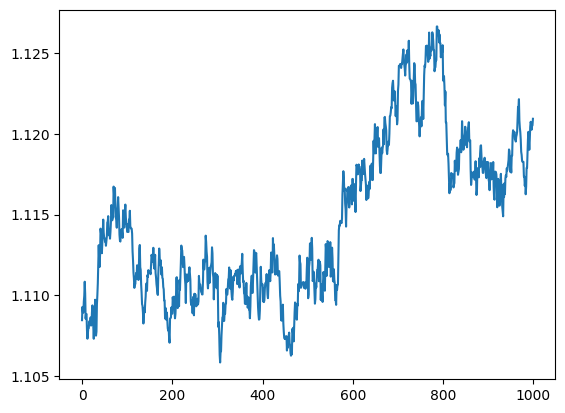

In [190]:
plt.plot(hmc_samples['t_mu_mu'])

(array([3.00e+00, 0.00e+00, 1.00e+00, 1.00e+00, 0.00e+00, 4.00e+00,
        6.00e+00, 1.00e+01, 1.50e+01, 2.20e+01, 2.90e+01, 4.70e+01,
        1.06e+02, 2.27e+02, 4.91e+02, 6.93e+02, 1.02e+03, 8.97e+02,
        6.59e+02, 4.17e+02, 1.77e+02, 8.40e+01, 3.50e+01, 2.00e+01,
        1.70e+01, 6.00e+00, 6.00e+00, 3.00e+00, 3.00e+00, 1.00e+00]),
 array([1.03719118, 1.04553313, 1.05387508, 1.06221703, 1.07055898,
        1.07890093, 1.08724288, 1.09558483, 1.10392678, 1.11226873,
        1.12061068, 1.12895263, 1.13729458, 1.14563653, 1.15397848,
        1.16232043, 1.17066238, 1.17900433, 1.18734628, 1.19568823,
        1.20403018, 1.21237213, 1.22071408, 1.22905603, 1.23739798,
        1.24573993, 1.25408188, 1.26242383, 1.27076578, 1.27910773,
        1.28744968]),
 <BarContainer object of 30 artists>)

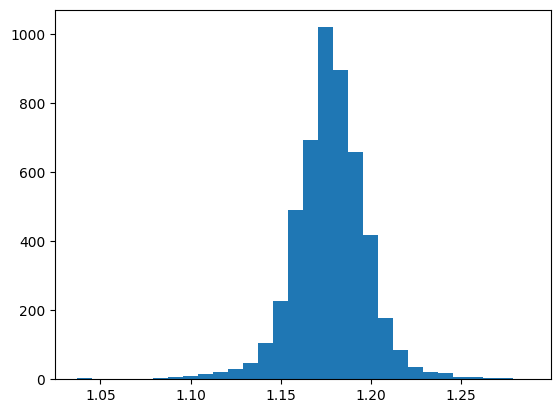

In [103]:
plt.hist(hmc_samples['t_mu_mu'], bins = 30)

(array([ 30.,  45.,  55., 151., 212., 257., 148.,  56.,  30.,  16.]),
 array([-0.84129277, -0.82021188, -0.79913098, -0.77805009, -0.7569692 ,
        -0.7358883 , -0.71480741, -0.69372651, -0.67264562, -0.65156473,
        -0.63048383]),
 <BarContainer object of 10 artists>)

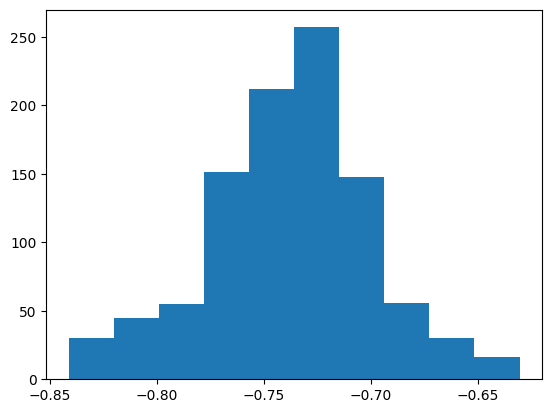

In [58]:
plt.hist(hmc_samples['subj_v_mu'][:, 3])

In [99]:
#help(pyro.infer.Predictive)

### Sample Variational

In [13]:
from torch.distributions import transform_to

from typing import Callable, Optional

def init_to_uniform_custom(
    site: Optional[dict] = None,
    radius: float = 0.1,
    ):
    """
    Initialize to a random point in the area ``(-radius, radius)`` of
    unconstrained domain.

    :param float radius: specifies the range to draw an initial point in the
        unconstrained domain.
    """
    if site is None:
        return functools.partial(init_to_uniform, radius=radius)
    
    site_num = site['fn'].shape()
    print(site)
    # group level locs -------
    if site['name'] == 'v_mu_mu':
        return torch.rand(1) - 0.5
    
    if site['name'] == 'a_mu_mu':
        return (torch.rand(1) - 0.5) + 1.5
    
    if site['name'] == 'z_mu_mu':
        return (torch.rand(1) / 5) + 0.3
    
    if site['name'] == 't_mu_mu':
        return torch.rand(1) / 5
    
    if site['name'] == 'theta_mu_mu':
        return (torch.rand(1) / 5) + 0.3
    
    # -------
    
    # subject level locs -------
    if site['name'] == 'v_subj':
        print('passed')
        return torch.rand(site_num) - 0.5  
    
    if site['name'] == 'a_subj':
        print('passed')
        return (torch.rand(site_num) - 0.5) + 1.5
    
    if site['name'] == 'z_subj':
        print('passed')
        return (torch.rand(site_num) / 5) + 0.3
        
    if site['name'] == 't_subj':
        print('passed')
        return torch.rand(site_num) / 5
    
    if site['name'] == 'theta_subj':
        return (torch.rand(site_num) / 5) + 0.3
    # -------
    
    # std parameters keep the uniform random init
    value = site["fn"].sample().detach()
    t = transform_to(site["fn"].support)
    value = t(torch.rand_like(t.inv(value)) * (2 * radius) - radius)
    value._pyro_custom_init = False
    return value

In [113]:
torch.rand_like(torch.zeros(20))

tensor([0.4128, 0.0695, 0.9679, 0.0028, 0.1596, 0.6709, 0.4591, 0.0890, 0.7104,
        0.9050, 0.4239, 0.1989, 0.7037, 0.1603, 0.0371, 0.2748, 0.0239, 0.2538,
        0.9814, 0.2620])

In [99]:
dist.Normal(loc = torch.zeros(20), scale = torch.ones(20)).shape()

torch.Size([20])

In [123]:
torch.rand(1)

tensor([0.5090])

In [96]:
dir(x)

['__abstractmethods__',
 '__call__',
 '__class__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_abc_impl',
 '_batch_shape',
 '_event_shape',
 '_extended_shape',
 '_get_checked_instance',
 '_log_normalizer',
 '_mean_carrier_measure',
 '_natural_params',
 '_validate_args',
 '_validate_sample',
 'arg_constraints',
 'batch_shape',
 'cdf',
 'conjugate_update',
 'entropy',
 'enumerate_support',
 'event_dim',
 'event_shape',
 'expand',
 'expand_by',
 'has_enumerate_support',
 'has_rsample',
 'has_rsample_',
 'icdf',
 'independent',
 'infer_shapes',
 'loc',
 'log_prob',
 'mask',
 'mean',
 'perplexity',
 'reshape',
 'rsample',
 'rv',
 'sample',
 'sample_n',
 'scale',
 'score_parts',
 's

Guessed max_plate_nesting = 3
Step 0 out of 1000, Elbo loss: 7246.822971642017
Step 100 out of 1000, Elbo loss: 7234.238054633141
Warmup:   9%|▉         | 18/200 [1:20:27, 268.17s/it, step size=3.25e-03, acc. prob=0.763]
Step 200 out of 1000, Elbo loss: 7231.408937096596
Step 300 out of 1000, Elbo loss: 7271.619547367096
Step 400 out of 1000, Elbo loss: 7232.557461857796
Step 500 out of 1000, Elbo loss: 7276.51896327734
Step 600 out of 1000, Elbo loss: 7288.896629989147
Step 700 out of 1000, Elbo loss: 7246.823987007141
Step 800 out of 1000, Elbo loss: 7224.175361037254
Step 900 out of 1000, Elbo loss: 7226.1514040231705


CPU times: user 1min 6s, sys: 466 ms, total: 1min 6s
Wall time: 1min 6s


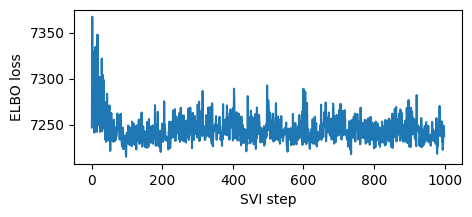

In [164]:
%%time
pyro.clear_param_store()
#torch_data = torch.tensor(out)
steps = 1000

# These should be reset each training loop.
#auto_guide = pyro.infer.autoguide.AutoMultivariateNormal(basic_ddm_model)
adam = pyro.optim.Adam({"lr": 0.02})
#elbo = pyro.infer.Trace_ELBO(num_particles = 1, vectorize_particles = True)
elbo = pyro.infer.Trace_ELBO(num_particles = 2, vectorize_particles = True)
#elbo = pyro.infer.Trace_ELBO(num_particles = 1, vectorize_particles = True)
#svi = pyro.infer.SVI(basic_hierarchical_model, auto_guide, adam, elbo)

svi = pyro.infer.SVI(hierarchical_ddm_model_new, auto_guide_hierarchical, adam, elbo, )
losses = []
from time import time
start_t = time()
for step in range(steps if not smoke_test else 2):  # Consider running for more steps.
    loss = svi.step(*(n_subjects, n_samples_by_subject, data, network, 'ddm'))
    losses.append(loss)
    if step % 100 == 0:
        logging.info("Step {} out of {}, Elbo loss: {}".format(step, steps, loss))
end_t = time()
plt.figure(figsize=(5, 2))
plt.plot(losses)
plt.xlabel("SVI step");
plt.ylabel("ELBO loss");

#predictive = pyro.infer.Predictive(basic_hierarchical_model, guide = auto_guide, num_samples = 1000)
predictive = pyro.infer.Predictive(hierarchical_ddm_model_new, guide = auto_guide_hierarchical, num_samples = 1000)
svi_samples = predictive(n_subjects, n_samples_by_subject, data, network, 'ddm') #torch.tensor(data))
svi_samples_new = {key_: svi_samples[key_].numpy().swapaxes(0, 1) for key_ in svi_samples.keys() if key_ != 'obs'}
az_svi = az.from_dict(posterior = svi_samples_new, 
                      posterior_predictive = {'obs': np.expand_dims(svi_samples['obs'].numpy(), 0)})
az_svi.posterior.attrs['runtime'] = end_t - start_t

In [168]:
svi_samples['obs'].shape

torch.Size([1000, 500, 20, 2])

In [176]:
#data[:, 0, :]

tensor([[ 1.5290, -1.0000],
        [ 2.5761, -1.0000],
        [ 1.1060, -1.0000],
        [ 1.1980, -1.0000],
        [ 1.0640, -1.0000],
        [ 0.9781, -1.0000],
        [ 1.5350, -1.0000],
        [ 1.1830, -1.0000],
        [ 1.0430, -1.0000],
        [ 0.9681, -1.0000],
        [ 0.7731, -1.0000],
        [ 1.3540, -1.0000],
        [ 1.4210, -1.0000],
        [ 1.0251, -1.0000],
        [ 1.3440, -1.0000],
        [ 2.3281, -1.0000],
        [ 1.2060, -1.0000],
        [ 0.8101, -1.0000],
        [ 1.2040, -1.0000],
        [ 0.8891, -1.0000],
        [ 0.8591, -1.0000],
        [ 1.4410, -1.0000],
        [ 1.3200, -1.0000],
        [ 0.7651, -1.0000],
        [ 1.0950, -1.0000],
        [ 1.8541, -1.0000],
        [ 1.9401, -1.0000],
        [ 1.3760, -1.0000],
        [ 1.6250, -1.0000],
        [ 0.9701, -1.0000],
        [ 2.1231, -1.0000],
        [ 0.9881, -1.0000],
        [ 2.1991, -1.0000],
        [ 1.0850, -1.0000],
        [ 1.6940, -1.0000],
        [ 0.8761, -1

In [177]:
#svi_samples['obs'][0, :, 0, :]

In [77]:
%%time
pyro.clear_param_store()
#torch_data = torch.tensor(out)
steps = 1000

# These should be reset each training loop.
#auto_guide = pyro.infer.autoguide.AutoMultivariateNormal(basic_ddm_model)
adam = pyro.optim.Adam({"lr": 0.02})
#elbo = pyro.infer.Trace_ELBO(num_particles = 1, vectorize_particles = True)
elbo = pyro.infer.Trace_ELBO(num_particles = 2, vectorize_particles = True)
#elbo = pyro.infer.Trace_ELBO(num_particles = 1, vectorize_particles = True)
#svi = pyro.infer.SVI(basic_hierarchical_model, auto_guide, adam, elbo)

svi = pyro.infer.SVI(hierarchical_ddm_model, auto_guide_hierarchical, adam, elbo, )
losses = []
from time import time
start_t = time()
for step in range(steps if not smoke_test else 2):  # Consider running for more steps.
    loss = svi.step(*(n_subjects, n_samples_by_subject, data, network))
    losses.append(loss)
    if step % 100 == 0:
        logging.info("Step {} out of {}, Elbo loss: {}".format(step, steps, loss))
end_t = time()
plt.figure(figsize=(5, 2))
plt.plot(losses)
plt.xlabel("SVI step");
plt.ylabel("ELBO loss");

#predictive = pyro.infer.Predictive(basic_hierarchical_model, guide = auto_guide, num_samples = 1000)
predictive = pyro.infer.Predictive(hierarchical_ddm_model, guide = auto_guide_hierarchical, num_samples = 1000)
svi_samples = predictive(n_subjects, n_samples_by_subject, data, network) #torch.tensor(data))
svi_samples_new = {key_: svi_samples[key_].numpy().swapaxes(0, 1) for key_ in svi_samples.keys() if key_ != 'obs'}
az_svi = az.from_dict(posterior = svi_samples_new, 
                      posterior_predictive = {'obs': np.expand_dims(svi_samples['obs'].numpy(), 0)})
az_svi.posterior.attrs['runtime'] = end_t - start_t

Guessed max_plate_nesting = 3
Step 0 out of 1000, Elbo loss: 35889.47366290167


v shape
torch.Size([20])
batch shape
torch.Size([20])
v shape
torch.Size([2, 1, 20])
batch shape
torch.Size([2, 1, 20])
v shape
torch.Size([2, 1, 20])
batch shape
torch.Size([2, 1, 20])
v shape
torch.Size([2, 1, 20])
batch shape
torch.Size([2, 1, 20])
v shape
torch.Size([2, 1, 20])
batch shape
torch.Size([2, 1, 20])
v shape
torch.Size([2, 1, 20])
batch shape
torch.Size([2, 1, 20])
v shape
torch.Size([2, 1, 20])
batch shape
torch.Size([2, 1, 20])
v shape
torch.Size([2, 1, 20])
batch shape
torch.Size([2, 1, 20])
v shape
torch.Size([2, 1, 20])
batch shape
torch.Size([2, 1, 20])
v shape
torch.Size([2, 1, 20])
batch shape
torch.Size([2, 1, 20])
v shape
torch.Size([2, 1, 20])
batch shape
torch.Size([2, 1, 20])
v shape
torch.Size([2, 1, 20])
batch shape
torch.Size([2, 1, 20])
v shape
torch.Size([2, 1, 20])
batch shape
torch.Size([2, 1, 20])
v shape
torch.Size([2, 1, 20])
batch shape
torch.Size([2, 1, 20])
v shape
torch.Size([2, 1, 20])
batch shape
torch.Size([2, 1, 20])
v shape
torch.Size([2,

KeyboardInterrupt: 

In [23]:
az_svi

Inference data with groups:
	> posterior
	> posterior_predictive

array([[<AxesSubplot:ylabel='a_mu_mu\n0'>, <AxesSubplot:>,
        <AxesSubplot:>],
       [<AxesSubplot:ylabel='z_mu_mu\n0'>, <AxesSubplot:>,
        <AxesSubplot:>],
       [<AxesSubplot:xlabel='v_mu_mu\n0', ylabel='t_mu_mu\n0'>,
        <AxesSubplot:xlabel='a_mu_mu\n0'>,
        <AxesSubplot:xlabel='z_mu_mu\n0'>]], dtype=object)

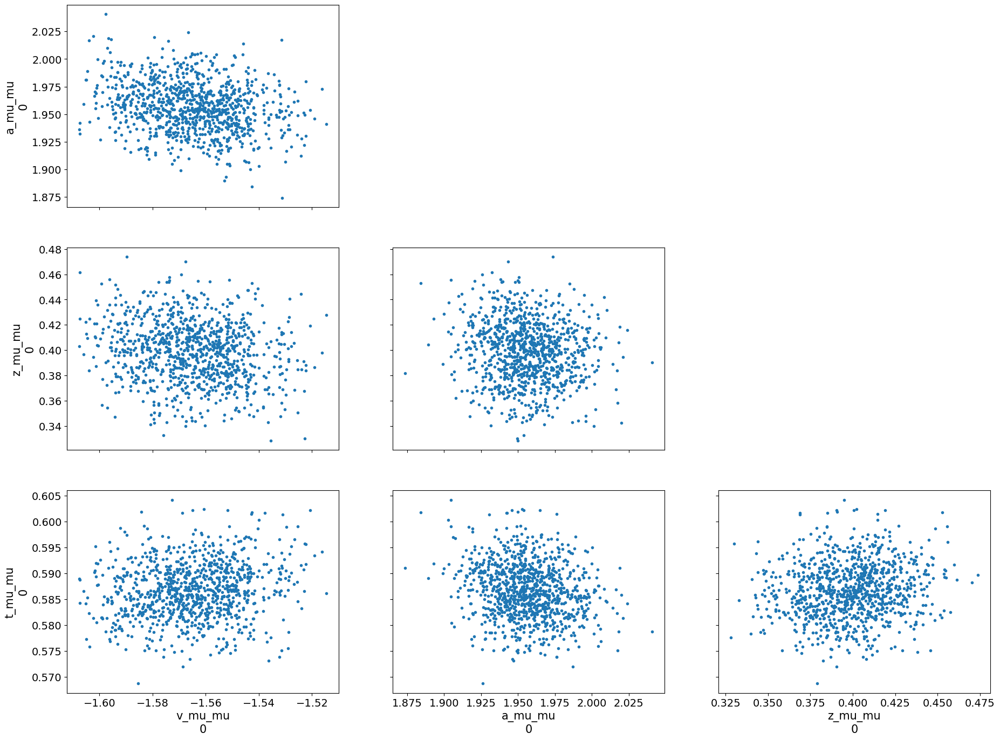

In [152]:
az.plot_pair(az_svi, var_names = ['v_mu_mu', 'a_mu_mu', 'z_mu_mu', 't_mu_mu'])
#az.plot_pair(az_mcmc, var_names = ['v_mu_mu', 'a_mu_mu', 'z_mu_mu', 't_mu_mu'])

array([[<AxesSubplot:ylabel='a_subj\n3'>, <AxesSubplot:>, <AxesSubplot:>],
       [<AxesSubplot:ylabel='z_subj\n3'>, <AxesSubplot:>, <AxesSubplot:>],
       [<AxesSubplot:xlabel='v_subj\n3', ylabel='t_subj\n3'>,
        <AxesSubplot:xlabel='a_subj\n3'>,
        <AxesSubplot:xlabel='z_subj\n3'>]], dtype=object)

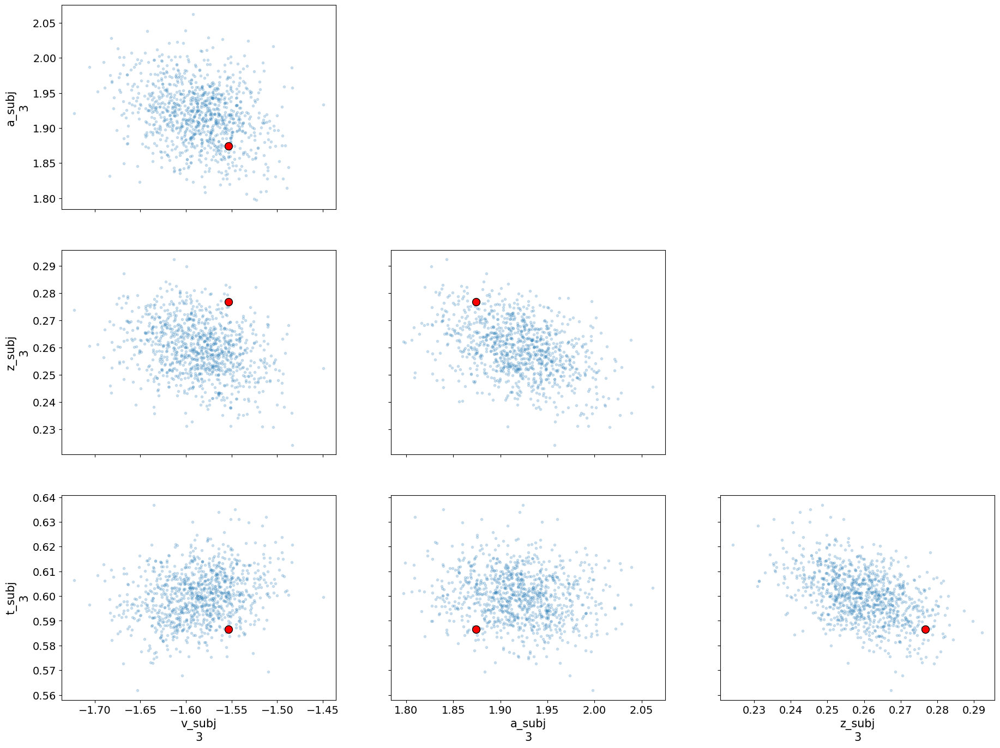

In [153]:
subj_id = 3
az.plot_pair(az_svi, 
             var_names = ['v_subj', 'a_subj', 'z_subj', 't_subj'], 
             scatter_kwargs = {'alpha': 0.2},
             coords = {'t_subj_dim_0': [subj_id],
                      'a_subj_dim_0': [subj_id],
                      'z_subj_dim_0': [subj_id],
                      'v_subj_dim_0': [subj_id]},
             reference_values = {'v_subj ' + str(subj_id): param_dict['v_subj'][subj_id],
                                 'a_subj ' + str(subj_id): param_dict['a_subj'][subj_id],
                                 't_subj ' + str(subj_id): param_dict['t_subj'][subj_id],
                                 'z_subj ' + str(subj_id): param_dict['z_subj'][subj_id]},
             reference_values_kwargs = {'color': 'red',
                                        'marker': 'o',
                                        'ms': 10})

## Define ANGLE - Hierarchical

### Simulation

In [54]:
model_config = ssms.config.model_config["angle"]
base_dim = 1
n_subjects = 20
n_samples_by_subject = 500
buffer_coefficient = 0.5

param_dict = {}
data_list = []
for param in model_config['params']:
    param_idx = model_config['params'].index(param)
    print('param')
    print(param)
    min_ = model_config['param_bounds'][0][param_idx]
    max_ = model_config['param_bounds'][1][param_idx]
    range_ = max_ - min_
    mean_ = (max_ + min_) / 2
    min_adj = mean_ - (0.5 * buffer_coefficient) * range_
    print(min_adj)
    max_adj = mean_ + (0.5 * buffer_coefficient) * range_
    print(max_adj)
    
    param_mu_mu = np.random.uniform(low = min_adj, high = max_adj) # potentially fix
    param_mu_std = np.random.uniform(low = 0.05, high = 0.1) # potentially fix
    param_mu = scipy.stats.norm.rvs(loc = param_mu_mu, scale = param_mu_std)
    param_std = scipy.stats.halfnorm.rvs(loc = 0, scale = 0.1) # potentially fix
    # param_std_std = scipy.stats.halfnorm(loc = 0, scale = 0.25) # potentially fix
    
    params_subj = np.random.normal(loc = param_mu, 
                                   scale = param_std, 
                                   size = n_subjects)
    
    param_dict[param + '_mu'] = param_mu.astype(np.float32)
    param_dict[param + '_std'] =  param_std.astype(np.float32)
    param_dict[param + '_subj'] = params_subj.astype(np.float32)
    
print(param_dict)
    
    
for i in range(n_subjects):
    v = torch.zeros(base_dim) + param_dict['v_subj'][i]
    a = torch.zeros(base_dim) + param_dict['a_subj'][i]
    z = torch.zeros(base_dim) + param_dict['z_subj'][i]
    t = torch.zeros(base_dim) + param_dict['t_subj'][i]
    theta_param = torch.zeros(base_dim) + param_dict['theta_subj'][i]
    
    theta = torch.vstack([v, a, z, t, theta_param]).T
    theta = theta.tile((n_samples_by_subject, 1))
    out = sim_wrap(theta = theta, model = 'angle')
    # theta = torch.hstack([theta, out])
    data_list.append(out)
    
#data = torch.stack(data_list).permute(2, 1, 0)
#data = torch.stack(data_list).permute(1, 2, 0)
#data = torch.stack(data_list).permute(2, 0, 1)
data = torch.stack(data_list).permute(1, 0, 2)

#data = torch.stack(data_list).unsqueeze(1).permute(2, 0, 3, 1)

param
v
-1.5
1.5
param
a
0.9749999999999999
2.325
param
z
0.3
0.7
param
t
0.5007499999999999
1.5002499999999999
param
theta
0.24999999999999994
0.95
{'v_mu': -0.9870931, 'v_std': 0.21800493, 'v_subj': array([-1.1920463 , -1.3377154 , -1.0527049 , -1.0886735 , -0.7284583 ,
       -1.2263329 , -0.5638629 , -1.227956  , -0.89469016, -0.52598625,
       -0.67628866, -0.76782167, -0.99188256, -0.921294  , -1.1543841 ,
       -0.60378677, -1.0853975 , -1.0661033 , -1.0129117 , -1.0252622 ],
      dtype=float32), 'a_mu': 1.5184442, 'a_std': 0.06294213, 'a_subj': array([1.5631948, 1.5079398, 1.5033691, 1.359984 , 1.5192229, 1.4705527,
       1.4548343, 1.5798247, 1.4739875, 1.5145218, 1.6173517, 1.5684172,
       1.5171711, 1.4911667, 1.5156937, 1.3394591, 1.5663195, 1.5174117,
       1.6030319, 1.5705456], dtype=float32), 'z_mu': 0.5675346, 'z_std': 0.038512323, 'z_subj': array([0.58425045, 0.66561764, 0.58193433, 0.46747884, 0.566496  ,
       0.5655564 , 0.59465635, 0.56713086, 0.5359705 , 

### Define Hierarchical Distribution

In [55]:
import math
from numbers import Real
from numbers import Number

import torch
from torch.distributions import constraints
from torch.distributions.exp_family import ExponentialFamily
from torch.distributions.utils import _standard_normal, broadcast_all

angle_network_config = pickle.load(open('nets/eba53550128911ec9fef3cecef056d26_angle_torch__network_config.pickle',
                                  'rb'))

angle_network = lanfactory.trainers.torch_mlp.TorchMLP(network_config = angle_network_config,
                                                 input_shape = 7)

angle_network.load_state_dict(torch.load('nets/eba53550128911ec9fef3cecef056d26_angle_torch_state_dict.pt'))
angle_network.eval()
#network = custom_torch_net

class MyAngleH(dist.TorchDistribution):
#     arg_constraints = {'loc': constraints.interval(-1, 1),
#                        'scale': constraints.interval(0.0001, 10)
#                       }
    def __init__(self, v, a, z, t, theta):
        self.net = angle_network
        self.n_samples = n_samples_by_subject
        self.boundaries = model_config['param_bounds']
        self.out_of_bounds_val = -66.1
        self.v = v
        self.a = a
        self.z = z
        self.t = t
        self.theta = theta
        
        
        if isinstance(v, Number): # and isinstance(a, Number):
            batch_shape = torch.Size()
        else:
            batch_shape = self.v.size()
            
        super().__init__(batch_shape = batch_shape, event_shape = torch.Size((2,))) #torch.Size((2,))) # event_shape = (1,))
        
    def sample(self):
        theta = torch.vstack([self.v, self.a, self.z, self.t , self.theta]).T
        return sim_wrap(theta = theta, model = 'angle')
    
    def log_prob(self, value):
        if self.v.dim() == 3:
            dat_tmp = value.repeat((self.v.size()[0], 1, 1, 1))
            tmp_params = torch.stack([self.v, self.a, self.z, self.t, self.theta], dim = -1).tile((1, self.n_samples, 1, 1))
            
            # print('tmp_params shape')
            # print(tmp_params.shape)
            
            net_in = torch.cat([tmp_params, dat_tmp], dim = -1)
            logp = torch.clip(self.net(net_in), min = -16.11)
            logp_squeezed = torch.squeeze(logp, dim = -1)
            
            # v constraint
            logp_squeezed = torch.where(net_in[:, :, :, 0] < torch.tensor(3.), logp_squeezed, torch.tensor(self.out_of_bounds_val))
            logp_squeezed = torch.where(net_in[:, :, :, 0] > torch.tensor(-3.), logp_squeezed, torch.tensor(self.out_of_bounds_val))

            # a constraint
            logp_squeezed = torch.where(net_in[:, :, :, 1] < torch.tensor(2.5), logp_squeezed, torch.tensor(self.out_of_bounds_val))
            logp_squeezed = torch.where(net_in[:, :, :, 1] > torch.tensor(0.3), logp_squeezed, torch.tensor(self.out_of_bounds_val))

            # z constraint
            logp_squeezed = torch.where(net_in[:, :, :, 2] < torch.tensor(0.9), logp_squeezed, torch.tensor(self.out_of_bounds_val))
            logp_squeezed = torch.where(net_in[:, :, :, 2] > torch.tensor(0.1), logp_squeezed, torch.tensor(self.out_of_bounds_val))

            # t constraint
            logp_squeezed = torch.where(net_in[:, :, :, 3] < torch.tensor(2.0), logp_squeezed, torch.tensor(self.out_of_bounds_val))
            logp_squeezed = torch.where(net_in[:, :, :, 3] > torch.tensor(0.0), logp_squeezed, torch.tensor(self.out_of_bounds_val))
            
            # theta constraint
            logp_squeezed = torch.where(net_in[:, :, :, 4] < torch.tensor(1.3), logp_squeezed, torch.tensor(self.out_of_bounds_val))
            logp_squeezed = torch.where(net_in[:, :, :, 4] > torch.tensor(-0.1), logp_squeezed, torch.tensor(self.out_of_bounds_val))
            
            logp_squeezed = logp_squeezed #.unsqueeze(1)
        else: # single particle:
            tmp_params = torch.stack([self.v, self.a, self.z, self.t, self.theta], dim = -1).tile((self.n_samples, 1, 1))

            net_in = torch.cat([tmp_params, value], dim = -1)
            logp = torch.clip(self.net(net_in), min = -16.11)
            logp_squeezed = torch.squeeze(logp, dim = -1)

            # v constraint
            logp_squeezed = torch.where(net_in[:, :, 0] < torch.tensor(3.), logp_squeezed, torch.tensor(self.out_of_bounds_val))
            logp_squeezed = torch.where(net_in[:, :, 0] > torch.tensor(-3.), logp_squeezed, torch.tensor(self.out_of_bounds_val))

            # a constraint
            logp_squeezed = torch.where(net_in[:, :, 1] < torch.tensor(2.5), logp_squeezed, torch.tensor(self.out_of_bounds_val))
            logp_squeezed = torch.where(net_in[:, :, 1] > torch.tensor(0.3), logp_squeezed, torch.tensor(self.out_of_bounds_val))

            # z constraint
            logp_squeezed = torch.where(net_in[:, :, 2] < torch.tensor(0.9), logp_squeezed, torch.tensor(self.out_of_bounds_val))
            logp_squeezed = torch.where(net_in[:, :, 2] > torch.tensor(0.1), logp_squeezed, torch.tensor(self.out_of_bounds_val))

            # t constraint
            logp_squeezed = torch.where(net_in[:, :, 3] < torch.tensor(2.0), logp_squeezed, torch.tensor(self.out_of_bounds_val))
            logp_squeezed = torch.where(net_in[:, :, 3] > torch.tensor(0.0), logp_squeezed, torch.tensor(self.out_of_bounds_val))
            
            # theta constraint
            logp_squeezed = torch.where(net_in[:, :, 4] < torch.tensor(1.3), logp_squeezed, torch.tensor(self.out_of_bounds_val))
            logp_squeezed = torch.where(net_in[:, :, 4] > torch.tensor(-0.1), logp_squeezed, torch.tensor(self.out_of_bounds_val))
            

            #logp_squeezed = logp.reshape((self.n_samples, -1))
            #logp_squeezed = torch.squeeze(logp, dim = -1)
            
#         print('logp out shape')
#         print(logp_squeezed.shape)
        
        return logp_squeezed
       
#####

# tmp_params = torch.stack([self.v, self.a, self.z, self.t], dim = -1)
#         tmp_params2 = tmp_params.repeat_interleave(value.size()[0], -2)
#         #print('self.v.dim: ')
#         #print(self.v.dim())
#         if self.v.dim() == 3:
#             dat_tmp = value.repeat((self.v.size()[0], self.v.size()[1], 1, 1))
#         else: 
#             dat_tmp = value
            
#         #print('dat_tmp size')
#         #print(dat_tmp.size())
            
#         #tmp_params = torch.cat([self.v, self.a, self.z, self.t])
#         #print('tmp_params2 size')
#         #print(tmp_params2.shape)
#         #tmp_params2 = tmp_params.repeat_interleave(value.size()[0], -2)
#         net_in = torch.cat([tmp_params2, dat_tmp], dim = -1)
        
#         # Old
#         #net_in = torch.hstack([torch.hstack([self.v, self.a, self.z, self.t]).tile(value.size()[0], 1), value])
#         logp = torch.clip(self.net(net_in), min = -16.11)
#         print('logp shape')
#         print(logp.shape)
        
#         logp_squeezed = torch.squeeze(logp, dim = -1)
#         print('logp squeezed shape')
#         print(logp_squeezed.shape)
#         if self.v.dim() == 3:
#             logp_squeezed = logp_squeezed.unsqueeze(1)
#         return logp_squeezed
#         #return torch.squeeze(torch.clip(self.net(net_in), min = -16.11))

tanh
tanh
linear


### Define Hierarchical Model

In [56]:
def hierarchical_angle_model(num_subjects, num_trials, data):
    #v_mu_mu = pyro.sample("v_mu_mu", dist.Uniform(-3, 3))
    v_mu_mu = pyro.sample("v_mu_mu", dist.Normal(0, 0.5))
    v_mu_std = pyro.sample("v_mu_std", dist.HalfNormal(100.))
    
    #a_mu_mu = pyro.sample("a_mu_mu", dist.Uniform(0.3, 2.5))
    a_mu_std = pyro.sample("a_mu_std", dist.HalfNormal(100.))
    a_mu_mu = pyro.sample("a_mu_mu", dist.Normal(1.5, 0.5))

    #z_mu_mu = pyro.sample("z_mu_mu", dist.Uniform(0.1, 0.9))
    z_mu_std = pyro.sample("z_mu_std", dist.HalfNormal(100.))
    z_mu_mu = pyro.sample("z_mu_mu", dist.Normal(0.5, 0.1))
    
    #t_mu_mu = pyro.sample("t_mu_mu", dist.Uniform(0.0, 2.0))
    t_mu_std = pyro.sample("t_mu_std", dist.HalfNormal(100.))
    t_mu_mu = pyro.sample("t_mu_mu", dist.Normal(1.0, 0.5))
    
    theta_mu_std = pyro.sample("theta_mu_std", dist.HalfNormal(100.))
    theta_mu_mu = pyro.sample("theta_mu_mu", dist.Normal(0.5, 0.5))

    with pyro.plate("subjects", num_subjects) as subjects_plate:
        v_subj = pyro.sample("v_subj", dist.Normal(v_mu_mu, v_mu_std))
        a_subj = pyro.sample("a_subj", dist.Normal(a_mu_mu, a_mu_std))
        z_subj = pyro.sample("z_subj", dist.Normal(z_mu_mu, z_mu_std))
        t_subj = pyro.sample("t_subj", dist.Normal(t_mu_mu, t_mu_std))
        theta_subj = pyro.sample("theta_subj", dist.Normal(theta_mu_mu, theta_mu_std))
        
        with pyro.plate("data", num_trials) as data_plate:
            return pyro.sample("obs", 
                               MyAngleH(v_subj, a_subj, z_subj, t_subj, theta_subj), 
                               obs = data)

In [146]:
auto_guide_angle_hierarchical = pyro.infer.autoguide.AutoMultivariateNormal(hierarchical_angle_model, init_scale = 0.02, init_loc_fn = init_to_uniform_custom)

### Define Guide

In [312]:
def hierarchical_angle_guide(num_subjects, num_trials, data):
    # Initialize the parameters:
    # ----------------
    
    # Global mus
    v_mu_mu_loc = pyro.param('v_mu_mu_loc', lambda:torch.tensor(0.),
                             constraint = constraints.interval(-3, 3))
    v_mu_mu_scale = pyro.param('v_mu_mu_scale', lambda:torch.tensor(0.02),
                               constraint = constraints.positive)
    
    a_mu_mu_loc = pyro.param('a_mu_mu_loc', lambda:torch.tensor(1.),
                             constraint = constraints.interval(0.3, 2.5))
    a_mu_mu_scale = pyro.param('a_mu_mu_scale', lambda:torch.tensor(0.02),
                               constraint = constraints.positive)
    
    z_mu_mu_loc = pyro.param('z_mu_mu_loc', lambda:torch.tensor(0.5),
                             constraint = constraints.interval(0.1, 0.9))
    z_mu_mu_scale = pyro.param('z_mu_mu_scale', lambda:torch.tensor(0.02),
                               constraint = constraints.positive)
    
    t_mu_mu_loc = pyro.param('t_mu_mu_loc', lambda:torch.tensor(0.5),
                             constraint = constraints.interval(0.0, 2.0))
    t_mu_mu_scale = pyro.param('t_mu_mu_scale', lambda:torch.tensor(0.02),
                               constraint = constraints.positive)
    
    
    theta_mu_mu_loc = pyro.param('theta_mu_mu_loc', lambda:torch.tensor(0.1),
                                 constraint = constraints.interval(0.0, 1.2))
    theta_mu_mu_scale = pyro.param('theta_mu_mu_scale', lambda:torch.tensor(0.02),
                                   constraint = constraints.positive)
    
    # Global stds
    v_mu_std_scale = pyro.param('v_mu_std_scale', lambda:torch.tensor(1/100),
                                constraint = constraints.positive)
    v_mu_std_concentration = pyro.param('v_mu_std_concentration', lambda:torch.tensor(10.),
                                        constraint = constraints.positive)
    
    a_mu_std_scale = pyro.param('a_mu_std_scale', lambda:torch.tensor(1/100),
                                constraint = constraints.positive)
    a_mu_std_concentration = pyro.param('a_mu_std_concentration', lambda:torch.tensor(10.),
                                        constraint = constraints.positive)
    
    z_mu_std_scale = pyro.param('z_mu_std_scale', lambda:torch.tensor(1/100),
                                constraint = constraints.positive)
    z_mu_std_concentration = pyro.param('z_mu_std_concentration', lambda:torch.tensor(10.),
                                        constraint = constraints.positive)
    
    t_mu_std_scale = pyro.param('t_mu_std_scale', lambda:torch.tensor(1/100),
                                constraint = constraints.positive)
    t_mu_std_concentration = pyro.param('t_mu_std_concentration', lambda:torch.tensor(10.),
                                        constraint = constraints.positive)
    
    theta_mu_std_scale = pyro.param('theta_mu_std_scale', lambda:torch.tensor(1/100),
                                    constraint = constraints.positive)
    
    theta_mu_std_concentration = pyro.param('t_mu_std_concentration', lambda:torch.tensor(10.),
                                            constraint = constraints.positive)

    # Subj Mus
    v_subj_mu_loc = pyro.param('v_subj_mus', 
                                  lambda:torch.rand(num_subjects) - torch.tensor(0.5),
                                  constraint = constraints.interval(-3, 3))
    
    v_subj_mu_scale = pyro.param('v_subj_scales', 
                                    lambda:torch.ones(num_subjects) + \
                                    (torch.rand(num_subjects) - torch.tensor(0.5)) / 5,
                                    constraint = constraints.positive)

    
    a_subj_mu_loc = pyro.param('a_subj_mus', 
                                  lambda:(torch.rand(num_subjects) - 0.5) + 1.5,
                                  constraint = constraints.interval(0.3, 2.5))
    a_subj_mu_scale = pyro.param('a_subj_scales', 
                                    lambda:torch.ones(num_subjects) + \
                                    (torch.rand(num_subjects) - 0.5) / 5,
                                    constraint = constraints.positive)
    
    z_subj_mu_loc = pyro.param('z_subj_mus', 
                                  lambda:(torch.rand(num_subjects) / 5) + 0.3,
                                  constraint = constraints.interval(0.1, 0.9))
    z_subj_mu_scale = pyro.param('z_subj_scales', 
                                    lambda:torch.ones(num_subjects) / 50,
                                    constraint = constraints.positive)
    
    t_subj_mu_loc = pyro.param('t_subj_mus', 
                                  lambda:torch.rand(num_subjects),
                                  constraint = constraints.interval(0., 2.))
    t_subj_mu_scale = pyro.param('t_subj_scales', 
                                    lambda:torch.ones(num_subjects) + \
                                    (torch.rand(num_subjects) - 0.5) / 5,
                                    constraint = constraints.positive)
    
    theta_subj_mu_loc = pyro.param('theta_subj_mus',
                                   lambda:(torch.rand(num_subjects) + 0.05),
                                   constraint = constraints.interval(0.0, 1.2))
    
    theta_subj_mu_scale = pyro.param('theta_subj_scales',
                                     lambda:torch.ones(num_subjects) - 0.5 + \
                                     ((torch.rand(num_subjects) - 0.5) / 5),
                                     constraint = constraints.positive)
                                    
    # ---------------
    # Specify the actual variational distributions
    # ----------------
                                    
    v_mu_mu = pyro.sample("v_mu_mu", 
                          dist.Normal(v_mu_mu_loc, v_mu_mu_scale))
    v_mu_std = pyro.sample("v_mu_std", 
                           dist.Gamma(v_mu_std_concentration, 1 / v_mu_std_scale))
    
    a_mu_mu = pyro.sample("a_mu_mu", 
                          dist.Normal(a_mu_mu_loc, a_mu_mu_scale))
    a_mu_std = pyro.sample("a_mu_std", 
                           dist.Gamma(a_mu_std_concentration, 1 / a_mu_std_scale))
    
    z_mu_mu = pyro.sample("z_mu_mu", 
                          dist.Normal(z_mu_mu_loc, z_mu_mu_scale))
    z_mu_std = pyro.sample("z_mu_std", 
                           dist.Gamma(z_mu_std_concentration, 1 / z_mu_std_scale))

    t_mu_mu = pyro.sample("t_mu_mu", 
                          dist.Normal(t_mu_mu_loc, t_mu_mu_scale))
    t_mu_std = pyro.sample("t_mu_std", 
                           dist.Gamma(t_mu_std_concentration, 1 / t_mu_std_scale))
    
    theta_mu_mu = pyro.sample("theta_mu_mu", 
                              dist.Normal(theta_mu_mu_loc, theta_mu_mu_scale))
    theta_mu_std = pyro.sample("theta_mu_std",
                               dist.Gamma(theta_mu_std_concentration, 1 / theta_mu_std_scale))
                               
    with pyro.plate("subjects", num_subjects) as subjects_plate:
        subj_v_mu = pyro.sample("v_subj", dist.Normal(v_subj_mu_loc, v_subj_mu_scale))
        subj_a_mu = pyro.sample("a_subj", dist.Normal(a_subj_mu_loc, a_subj_mu_scale))
        subj_z_mu = pyro.sample("z_subj", dist.Normal(z_subj_mu_loc, z_subj_mu_scale))
        subj_t_mu = pyro.sample("t_subj", dist.Normal(t_subj_mu_loc, t_subj_mu_scale))
        subj_theta_mu = pyro.sample("theta_subj", dist.Normal(theta_subj_mu_loc, theta_subj_mu_scale))                       
    
    return {"v_mu_mu": v_mu_mu,
            "v_mu_std": v_mu_std,
            "v_subj": subj_v_mu,
            "a_mu_mu": a_mu_mu,
            "a_mu_std": a_mu_std,
            "a_subj": subj_a_mu,
            "z_mu_mu": z_mu_mu,
            "z_mu_std": z_mu_std,
            "z_subj": subj_z_mu,
            "t_mu_mu": t_mu_mu,
            "t_mu_std": t_mu_std,
            "t_subj": subj_t_mu,
            "theta_mu_mu": theta_mu_mu,
            "theta_mu_std": theta_mu_std,
            "theta_subj": subj_theta_mu}

    # ----------------

### Sample NUTS

In [323]:
# NUTS VERSION
from pyro.infer import MCMC, NUTS
#torch_data = torch.tensor(out)
num_chains = 1

nuts_kernel = NUTS(hierarchical_angle_model,
                   step_size = 0.01,
                   max_tree_depth = 5)
                   #jit_compile = True,
                   #ignore_jit_warnings = True)
                   #max_tree_depth = 1)

mcmc_angle = MCMC(nuts_kernel, 
                  num_samples = 1000, 
                  warmup_steps = 500, 
                  num_chains = num_chains, 
                  initial_params = {'v_mu_mu': torch.tensor(param_dict['v_mu']).repeat(num_chains, 1),
                                    'v_mu_std': torch.tensor(param_dict['v_std']).repeat(num_chains, 1),
                                    'a_mu_mu': torch.tensor(param_dict['a_mu']).repeat(num_chains, 1),
                                    'a_mu_std': torch.tensor(param_dict['a_std']).repeat(num_chains, 1),
                                    'z_mu_mu': torch.tensor(param_dict['z_mu']).repeat(num_chains, 1),
                                    'z_mu_std': torch.tensor(param_dict['z_std']).repeat(num_chains, 1),
                                    't_mu_mu': torch.tensor(param_dict['t_mu']).repeat(num_chains, 1),
                                    't_mu_std': torch.tensor(param_dict['t_std']).repeat(num_chains, 1),
                                    'theta_mu_mu': torch.tensor(param_dict['theta_mu']).repeat(num_chains, 1),
                                    'theta_mu_std': torch.tensor(param_dict['theta_std']).repeat(num_chains, 1),
                                    'v_subj': torch.tensor(param_dict['v_subj']).repeat(num_chains, 1),
                                    'a_subj': torch.tensor(param_dict['a_subj']).repeat(num_chains, 1),
                                    'z_subj': torch.tensor(param_dict['z_subj']).repeat(num_chains, 1),
                                    't_subj': torch.tensor(param_dict['t_subj']).repeat(num_chains, 1),
                                    'theta_subj': torch.tensor(param_dict['theta_subj']).repeat(num_chains, 1),
                                    }
               )

mcmc_angle.run(n_subjects, n_samples_by_subject, data)
#hmc_samples = {k: v.detach().cpu().numpy() for k, v in mcmc.get_samples().items()}

#hmc_samples_new = {}
#hmc_samples_new['v'] = np.expand_dims(hmc_samples['v'], axis = (1))
#hmc_samples_new['a'] = np.expand_dims(hmc_samples['v'], axis = (1))
#hmc_samples_new['z'] = np.expand_dims(hmc_samples['v'], axis = (1))
#hmc_samples_new['t'] = np.expand_dims(hmc_samples['v'], axis = (1))
#hmc_samples_new['g_mu_std'] = np.expand_dims(hmc_samples['g_mu_std'], axis = (1,2))
#hmc_samples_new['subj_mu'] = np.expand_dims(hmc_samples['subj_mu'], axis = 1)

Sample: 100%|██████████| 1500/1500 [19:13,  1.30it/s, step size=1.46e-01, acc. prob=0.772]


In [324]:
az_mcmc_angle = az.from_pyro(mcmc_angle)

In [325]:
az_mcmc_angle

Inference data with groups:
	> posterior
	> log_likelihood
	> sample_stats
	> observed_data

/users/afengler/data/software/miniconda3/envs/lanfactory/lib/python3.7/site-packages/arviz/plots/backends/matplotlib/pairplot.py:98: UserWarning: Argument reference_values does not include reference value for: z_mu_mu 0, 0, a_mu_mu 0, 0, v_mu_mu 0, 0, t_mu_mu 0, 0, theta_mu_mu 0, 0
  UserWarning,


array([[<AxesSubplot:ylabel='a_mu_mu\n0, 0'>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>],
       [<AxesSubplot:ylabel='t_mu_mu\n0, 0'>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>],
       [<AxesSubplot:ylabel='z_mu_mu\n0, 0'>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>],
       [<AxesSubplot:xlabel='v_mu_mu\n0, 0', ylabel='theta_mu_mu\n0, 0'>,
        <AxesSubplot:xlabel='a_mu_mu\n0, 0'>,
        <AxesSubplot:xlabel='t_mu_mu\n0, 0'>,
        <AxesSubplot:xlabel='z_mu_mu\n0, 0'>]], dtype=object)

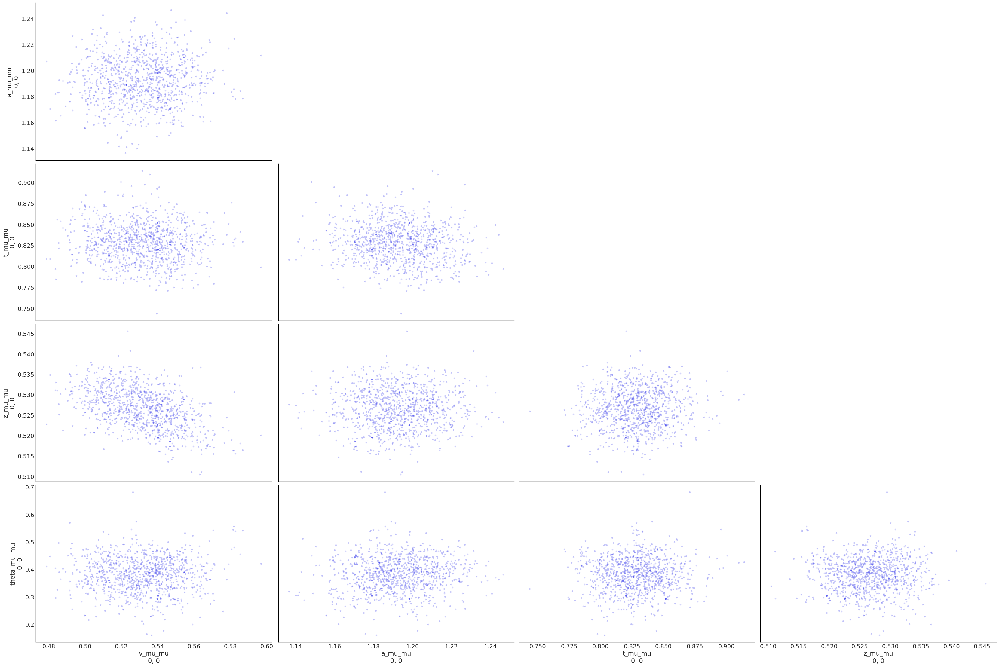

In [330]:
az.plot_pair(az_mcmc_angle, 
             var_names = ['v_mu_mu', 'a_mu_mu', 't_mu_mu', 'z_mu_mu', 'theta_mu_mu'], 
             scatter_kwargs = {'alpha': 0.2},
             reference_values = {'v_mu_mu 0 0': param_dict['v_mu'],
                                 'a_mu_mu': param_dict['a_mu'],
                                 't_mu_mu': param_dict['t_mu'],
                                 'z_mu_mu': param_dict['z_mu'],
                                 'theta_mu_mu': param_dict['theta_mu']},
             reference_values_kwargs = {'color': 'red',
                                        'marker': 'o',
                                        'ms': 10})

array([[<AxesSubplot:ylabel='a_subj\n0, 0'>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>],
       [<AxesSubplot:ylabel='z_subj\n0, 0'>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>],
       [<AxesSubplot:ylabel='t_subj\n0, 0'>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>],
       [<AxesSubplot:xlabel='v_subj\n0, 0', ylabel='theta_subj\n0, 0'>,
        <AxesSubplot:xlabel='a_subj\n0, 0'>,
        <AxesSubplot:xlabel='z_subj\n0, 0'>,
        <AxesSubplot:xlabel='t_subj\n0, 0'>]], dtype=object)

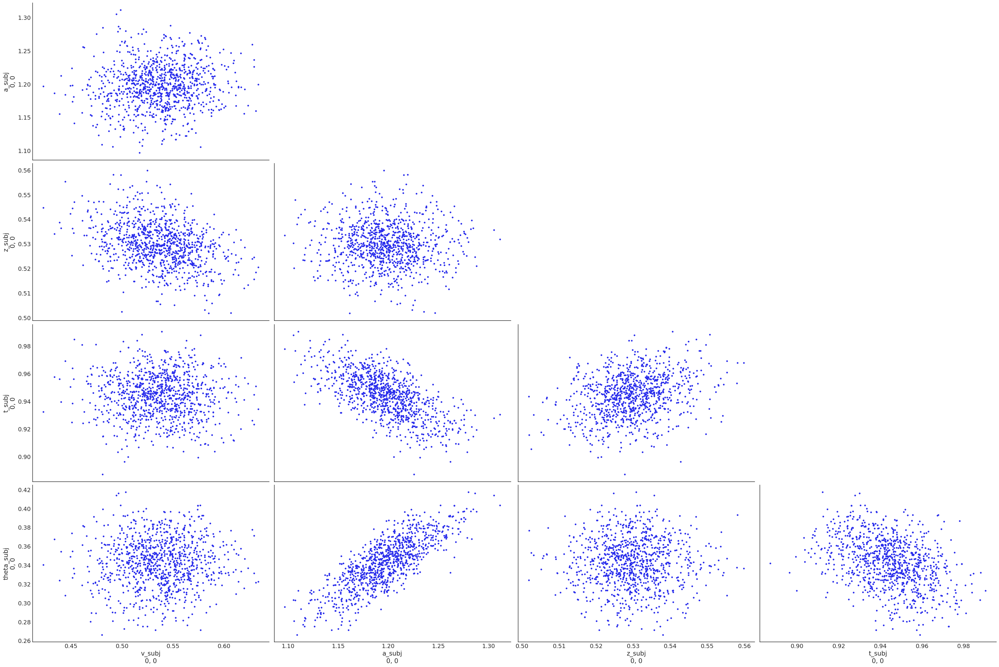

In [333]:
az.plot_pair(az_mcmc_angle, var_names = ['v_subj', 'a_subj', 'z_subj', 't_subj', 'theta_subj'], coords = {'t_subj_dim_1': [0],
                                                                                      'a_subj_dim_1': [0],
                                                                                      'z_subj_dim_1': [0],
                                                                                      'v_subj_dim_1': [0],
                                                                                      'theta_subj_dim_1': [0]})

array([[<AxesSubplot:title={'center':'v_mu_mu'}>,
        <AxesSubplot:title={'center':'v_mu_mu'}>],
       [<AxesSubplot:title={'center':'a_mu_mu'}>,
        <AxesSubplot:title={'center':'a_mu_mu'}>],
       [<AxesSubplot:title={'center':'t_mu_mu'}>,
        <AxesSubplot:title={'center':'t_mu_mu'}>],
       [<AxesSubplot:title={'center':'z_mu_mu'}>,
        <AxesSubplot:title={'center':'z_mu_mu'}>],
       [<AxesSubplot:title={'center':'theta_mu_mu'}>,
        <AxesSubplot:title={'center':'theta_mu_mu'}>]], dtype=object)

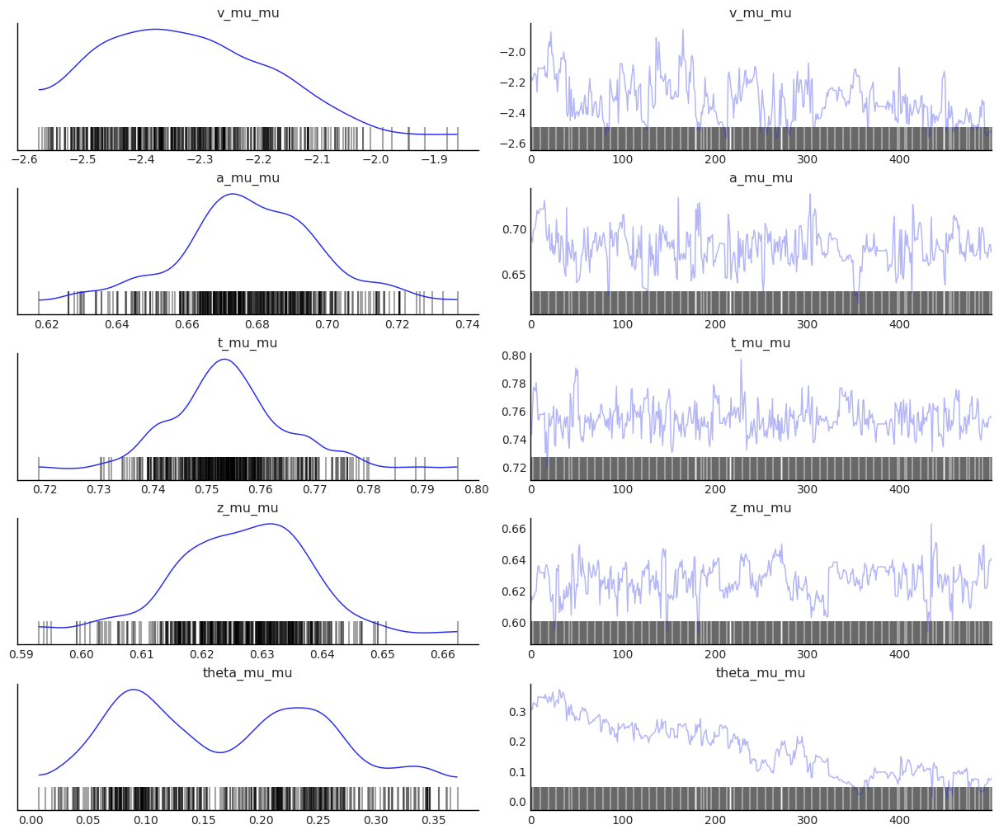

In [279]:
az.plot_trace(az_mcmc_angle, 
             var_names = ['v_mu_mu', 'a_mu_mu', 't_mu_mu', 'z_mu_mu', 'theta_mu_mu'])

In [293]:
az_mcmc_angle.posterior.data_vars['v_subj'].values.squeeze().mean(axis = 0)

array([-2.1962574, -2.5983748, -2.761274 , -2.8150208, -2.4008453,
       -1.565038 , -2.0610976, -2.3051565, -2.6601176, -2.9118688,
       -2.2175274, -2.887751 , -2.3329856, -2.8625722, -2.3135805,
       -2.4711752, -2.7117443, -2.8778617, -1.355004 , -2.5631597],
      dtype=float32)

In [294]:
param_dict['v_subj']

array([-0.96104604, -0.9295313 , -0.89905715, -0.9898931 , -0.8543255 ,
       -0.96372783, -0.95416534, -0.93201613, -0.9909533 , -0.94677454,
       -0.94895756, -0.96520096, -0.9408621 , -0.969475  , -0.9482329 ,
       -0.99659127, -0.93259394, -0.9219786 , -0.8962567 , -0.970997  ],
      dtype=float32)

### Sample Variational

In [71]:
from torch.distributions import transform_to

from typing import Callable, Optional

def init_to_uniform_custom(
    site: Optional[dict] = None,
    radius: float = 0.1,
    ):
    """
    Initialize to a random point in the area ``(-radius, radius)`` of
    unconstrained domain.

    :param float radius: specifies the range to draw an initial point in the
        unconstrained domain.
    """
    if site is None:
        return functools.partial(init_to_uniform, radius=radius)
    
    site_num = site['fn'].shape()
    print(site)
    # group level locs -------
    if site['name'] == 'v_mu_mu':
        return torch.rand(1) - 0.5
    
    if site['name'] == 'a_mu_mu':
        return (torch.rand(1) - 0.5) + 1.5
    
    if site['name'] == 'z_mu_mu':
        return (torch.rand(1) / 5) + 0.3
    
    if site['name'] == 't_mu_mu':
        return torch.rand(1) / 5
    
    if site['name'] == 'theta_mu_mu':
        return (torch.rand(1) / 10)
    
    # -------
    
    # subject level locs -------
    if site['name'] == 'v_subj':
        print('passed')
        return torch.rand(site_num) - 0.5  
    
    if site['name'] == 'a_subj':
        print('passed')
        return (torch.rand(site_num) - 0.5) + 1.5
    
    if site['name'] == 'z_subj':
        print('passed')
        return (torch.rand(site_num) / 5) + 0.3
        
    if site['name'] == 't_subj':
        print('passed')
        return torch.rand(site_num) / 5
    
    if site['name'] == 'theta_subj':
        return (torch.rand(site_num) / 10)
    
    # -------
    
    # std parameters keep the uniform random init
    value = site["fn"].sample().detach()
    t = transform_to(site["fn"].support)
    value = t(torch.rand_like(t.inv(value)) * (2 * radius) - radius)
    value._pyro_custom_init = False
    return value

In [58]:
auto_guide_angle_hierarchical = pyro.infer.autoguide.AutoMultivariateNormal(hierarchical_angle_model,
                                                                            init_scale = 0.02,
                                                                            init_loc_fn = init_to_uniform_custom)

In [68]:
auto_guide_angle_hierarchical_normal = pyro.infer.autoguide.AutoNormal(hierarchical_angle_model,
                                                                       init_scale = 0.02,
                                                                       init_loc_fn = init_to_uniform_custom)

/users/afengler/data/software/miniconda3/envs/lanfactory/lib/python3.7/site-packages/torch/distributions/distribution.py:46: UserWarning: <class '__main__.MyAngleH'> does not define `arg_constraints`. Please set `arg_constraints = {}` or initialize the distribution with `validate_args=False` to turn off validation.
  'with `validate_args=False` to turn off validation.')
Guessed max_plate_nesting = 3
Step 0 out of 1000, Elbo loss: 11088.022751152515
Step 100 out of 1000, Elbo loss: 11095.494898617268
Step 200 out of 1000, Elbo loss: 11135.245585501194
Step 300 out of 1000, Elbo loss: 11076.88893815875
Step 400 out of 1000, Elbo loss: 11089.208148479462
Step 500 out of 1000, Elbo loss: 11088.440604567528
Step 600 out of 1000, Elbo loss: 11091.404409706593
Step 700 out of 1000, Elbo loss: 11089.826820731163
Step 800 out of 1000, Elbo loss: 11111.818672150373
Step 900 out of 1000, Elbo loss: 11105.174129158258


CPU times: user 1min 17s, sys: 147 ms, total: 1min 17s
Wall time: 1min 17s


/users/afengler/data/software/miniconda3/envs/lanfactory/lib/python3.7/site-packages/arviz/data/base.py:225: UserWarning: More chains (1000) than draws (1). Passed array should have shape (chains, draws, *shape)
  UserWarning,


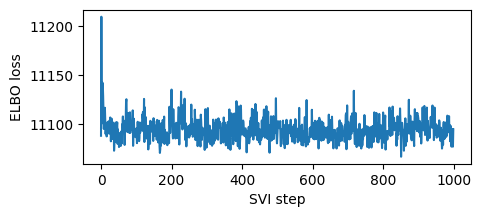

In [74]:
%%time
pyro.clear_param_store()
#torch_data = torch.tensor(out)
steps = 1000

# These should be reset each training loop.
#auto_guide = pyro.infer.autoguide.AutoMultivariateNormal(basic_ddm_model)
adam = pyro.optim.Adam({"lr": 0.02})
#elbo = pyro.infer.Trace_ELBO(num_particles = 1, vectorize_particles = True)
elbo = pyro.infer.Trace_ELBO(num_particles = 2, vectorize_particles = True)
#elbo = pyro.infer.Trace_ELBO(num_particles = 1, vectorize_particles = True)
#svi = pyro.infer.SVI(basic_hierarchical_model, auto_guide, adam, elbo)

svi_angle_normal = pyro.infer.SVI(hierarchical_angle_model, auto_guide_angle_hierarchical_normal, adam, elbo)
losses = []
for step in range(steps if not smoke_test else 2):  # Consider running for more steps.
    loss = svi_angle_normal.step(*(n_subjects, n_samples_by_subject, data))
    losses.append(loss)
    if step % 100 == 0:
        logging.info("Step {} out of {}, Elbo loss: {}".format(step, steps, loss))

plt.figure(figsize=(5, 2))
plt.plot(losses)
plt.xlabel("SVI step");
plt.ylabel("ELBO loss");

#predictive = pyro.infer.Predictive(basic_hierarchical_model, guide = auto_guide, num_samples = 1000)
predictive = pyro.infer.Predictive(hierarchical_angle_model, guide = auto_guide_angle_hierarchical_normal, num_samples = 1000)
svi_angle_normal_samples = predictive(n_subjects, n_samples_by_subject, data) #torch.tensor(data))
svi_angle_normal_samples_new = {key_: svi_angle_normal_samples[key_].numpy() for key_ in svi_angle_normal_samples.keys() if key_ != 'obs'}
az_angle_normal_svi = az.from_dict(svi_angle_normal_samples_new)

In [73]:
az_angle_normal_svi

Inference data with groups:
	> posterior

array([[<AxesSubplot:ylabel='a_mu_mu\n0'>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>],
       [<AxesSubplot:ylabel='t_mu_mu\n0'>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>],
       [<AxesSubplot:ylabel='z_mu_mu\n0'>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>],
       [<AxesSubplot:xlabel='v_mu_mu\n0', ylabel='theta_mu_mu\n0'>,
        <AxesSubplot:xlabel='a_mu_mu\n0'>,
        <AxesSubplot:xlabel='t_mu_mu\n0'>,
        <AxesSubplot:xlabel='z_mu_mu\n0'>]], dtype=object)

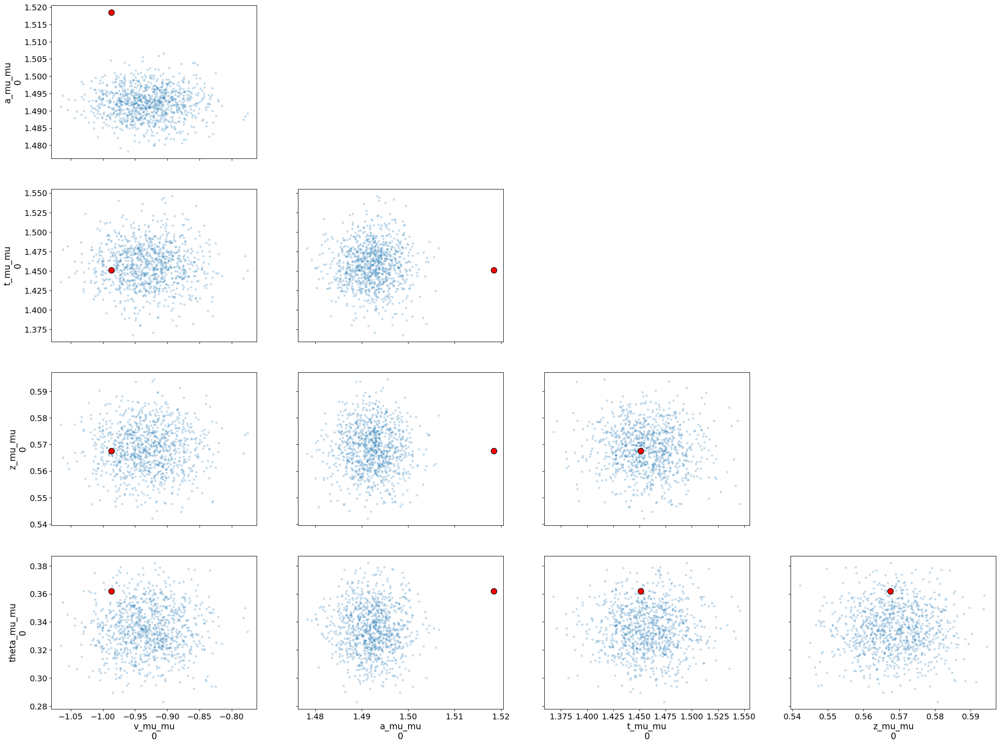

In [75]:
#subj_id = 3
az.plot_pair(az_angle_normal_svi, 
             var_names = ['v_mu_mu', 'a_mu_mu', 't_mu_mu', 'z_mu_mu', 'theta_mu_mu'], 
             scatter_kwargs = {'alpha': 0.2},
             reference_values = {'v_mu_mu 0': param_dict['v_mu'],
                                 'a_mu_mu 0': param_dict['a_mu'],
                                 't_mu_mu 0': param_dict['t_mu'],
                                 'z_mu_mu 0': param_dict['z_mu'],
                                 'theta_mu_mu 0': param_dict['theta_mu']},
             reference_values_kwargs = {'color': 'red',
                                        'marker': 'o',
                                        'ms': 10})

array([[<AxesSubplot:ylabel='a_subj\n0'>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>],
       [<AxesSubplot:ylabel='z_subj\n0'>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>],
       [<AxesSubplot:ylabel='t_subj\n0'>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>],
       [<AxesSubplot:xlabel='v_subj\n0', ylabel='theta_subj\n0'>,
        <AxesSubplot:xlabel='a_subj\n0'>,
        <AxesSubplot:xlabel='z_subj\n0'>,
        <AxesSubplot:xlabel='t_subj\n0'>]], dtype=object)

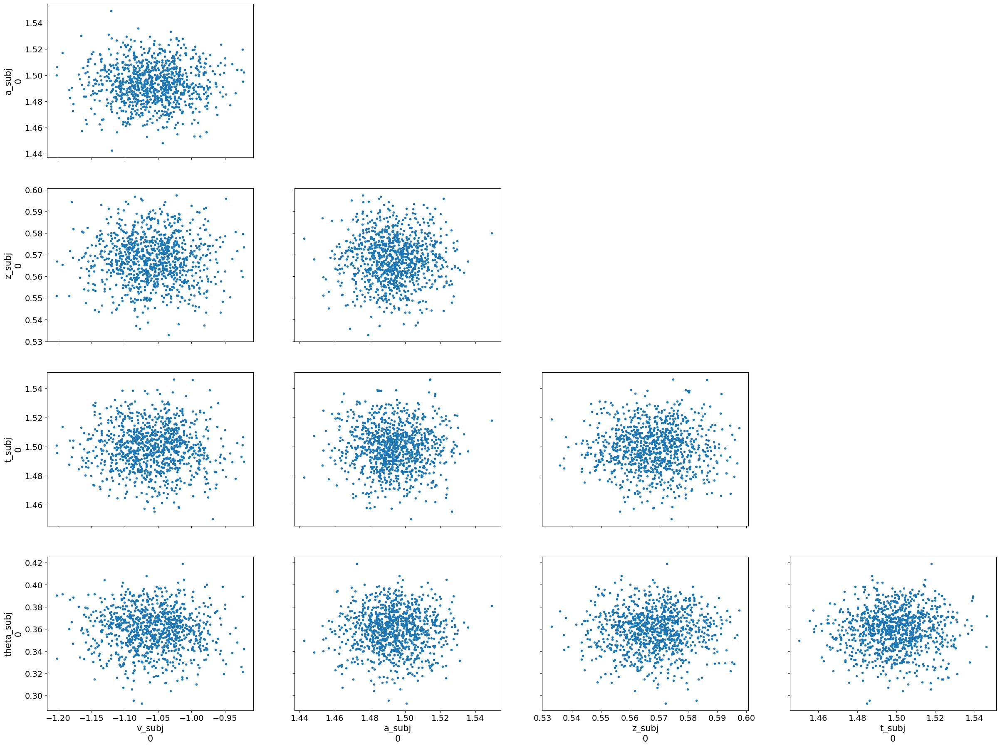

In [76]:
az.plot_pair(az_angle_normal_svi, var_names = ['v_subj', 'a_subj', 'z_subj', 't_subj', 'theta_subj'], coords = {'t_subj_dim_0': [0],
                                                                                      'a_subj_dim_0': [0],
                                                                                      'z_subj_dim_0': [0],
                                                                                      'v_subj_dim_0': [0],
                                                                                      'theta_subj_dim_0': [0]})

/users/afengler/data/software/miniconda3/envs/lanfactory/lib/python3.7/site-packages/torch/distributions/distribution.py:46: UserWarning: <class '__main__.MyAngleH'> does not define `arg_constraints`. Please set `arg_constraints = {}` or initialize the distribution with `validate_args=False` to turn off validation.
  'with `validate_args=False` to turn off validation.')
Guessed max_plate_nesting = 3
Step 0 out of 1000, Elbo loss: 103946.32739397511


{'type': 'sample', 'name': 'v_mu_mu', 'fn': Normal(loc: 0.0, scale: 0.5), 'is_observed': False, 'args': (), 'kwargs': {}, 'value': None, 'infer': {}, 'scale': 1.0, 'mask': None, 'cond_indep_stack': (), 'done': False, 'stop': False, 'continuation': None}
{'type': 'sample', 'name': 'v_mu_std', 'fn': HalfNormal(), 'is_observed': False, 'args': (), 'kwargs': {}, 'value': None, 'infer': {}, 'scale': 1.0, 'mask': None, 'cond_indep_stack': (), 'done': False, 'stop': False, 'continuation': None}
{'type': 'sample', 'name': 'a_mu_std', 'fn': HalfNormal(), 'is_observed': False, 'args': (), 'kwargs': {}, 'value': None, 'infer': {}, 'scale': 1.0, 'mask': None, 'cond_indep_stack': (), 'done': False, 'stop': False, 'continuation': None}
{'type': 'sample', 'name': 'a_mu_mu', 'fn': Normal(loc: 1.5, scale: 0.5), 'is_observed': False, 'args': (), 'kwargs': {}, 'value': None, 'infer': {}, 'scale': 1.0, 'mask': None, 'cond_indep_stack': (), 'done': False, 'stop': False, 'continuation': None}
{'type': 'samp

Step 100 out of 1000, Elbo loss: 43883.11801683903
Step 200 out of 1000, Elbo loss: 11139.37486565113
Step 300 out of 1000, Elbo loss: 11084.415793389082
Step 400 out of 1000, Elbo loss: 11109.196581959724
Step 500 out of 1000, Elbo loss: 11085.38102710247
Step 600 out of 1000, Elbo loss: 11093.253107130527
Step 700 out of 1000, Elbo loss: 11092.68756851554
Step 800 out of 1000, Elbo loss: 11105.007992655039
Step 900 out of 1000, Elbo loss: 11088.748823434114


CPU times: user 1min 4s, sys: 72.7 ms, total: 1min 4s
Wall time: 1min 4s


Text(0, 0.5, 'ELBO loss')

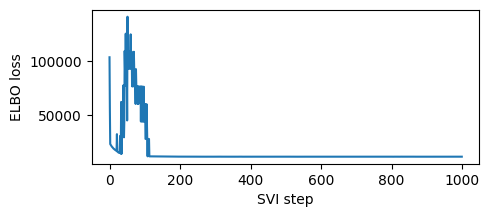

In [59]:
%%time
pyro.clear_param_store()
#torch_data = torch.tensor(out)
steps = 1000

# These should be reset each training loop.
#auto_guide = pyro.infer.autoguide.AutoMultivariateNormal(basic_ddm_model)
adam = pyro.optim.Adam({"lr": 0.02})
#elbo = pyro.infer.Trace_ELBO(num_particles = 1, vectorize_particles = True)
elbo = pyro.infer.Trace_ELBO(num_particles = 2, vectorize_particles = True)
#elbo = pyro.infer.Trace_ELBO(num_particles = 1, vectorize_particles = True)
#svi = pyro.infer.SVI(basic_hierarchical_model, auto_guide, adam, elbo)

svi_angle = pyro.infer.SVI(hierarchical_angle_model, auto_guide_angle_hierarchical, adam, elbo)
losses = []
for step in range(steps if not smoke_test else 2):  # Consider running for more steps.
    loss = svi_angle.step(*(n_subjects, n_samples_by_subject, data))
    losses.append(loss)
    if step % 100 == 0:
        logging.info("Step {} out of {}, Elbo loss: {}".format(step, steps, loss))

plt.figure(figsize=(5, 2))
plt.plot(losses)
plt.xlabel("SVI step");
plt.ylabel("ELBO loss");

#predictive = pyro.infer.Predictive(basic_hierarchical_model, guide = auto_guide, num_samples = 1000)
predictive = pyro.infer.Predictive(hierarchical_angle_model, guide = auto_guide_angle_hierarchical, num_samples = 1000)
svi_angle_samples = predictive(n_subjects, n_samples_by_subject, data) #torch.tensor(data))
svi_angle_samples_new = {key_: svi_angle_samples[key_].numpy().squeeze() for key_ in svi_angle_samples.keys() if key_ != 'obs'}
az_angle_svi = az.from_dict(svi_angle_samples_new)

In [154]:
data.shape

torch.Size([500, 20, 2])

In [60]:
predictive = pyro.infer.Predictive(hierarchical_angle_model, guide = auto_guide_angle_hierarchical, num_samples = 1000)
svi_angle_samples = predictive(n_subjects, n_samples_by_subject, data) #torch.tensor(data))
svi_angle_samples_new = {key_: svi_angle_samples[key_].numpy().swapaxes(0, 1) for key_ in svi_angle_samples.keys() if key_ != 'obs'}
az_angle_svi = az.from_dict(svi_angle_samples_new)

In [261]:
svi_angle_samples_new['v_subj'].shape

(1000, 1, 20)

In [61]:
az_angle_svi

Inference data with groups:
	> posterior

In [65]:
az_angle_svi.posterior.data_vars['theta_subj'].values.mean(axis = 1)

array([[0.35155067, 0.45622307, 0.37798887, 0.40237713, 0.3367343 ,
        0.4376767 , 0.3222353 , 0.27474797, 0.35999075, 0.46873805,
        0.33687925, 0.3125887 , 0.46106508, 0.2796079 , 0.29666546,
        0.3195758 , 0.22414954, 0.28602666, 0.20106567, 0.27947286]],
      dtype=float32)

In [64]:
param_dict['theta_subj']

array([0.36508498, 0.46158877, 0.36864036, 0.40152565, 0.34312493,
       0.47613052, 0.30743504, 0.2916245 , 0.37488228, 0.48193252,
       0.3388595 , 0.34722045, 0.45766297, 0.28784835, 0.30151874,
       0.24795248, 0.20103477, 0.28268513, 0.2439887 , 0.2841638 ],
      dtype=float32)

array([[<AxesSubplot:ylabel='a_mu_mu\n0'>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>],
       [<AxesSubplot:ylabel='t_mu_mu\n0'>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>],
       [<AxesSubplot:ylabel='z_mu_mu\n0'>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>],
       [<AxesSubplot:xlabel='v_mu_mu\n0', ylabel='theta_mu_mu\n0'>,
        <AxesSubplot:xlabel='a_mu_mu\n0'>,
        <AxesSubplot:xlabel='t_mu_mu\n0'>,
        <AxesSubplot:xlabel='z_mu_mu\n0'>]], dtype=object)

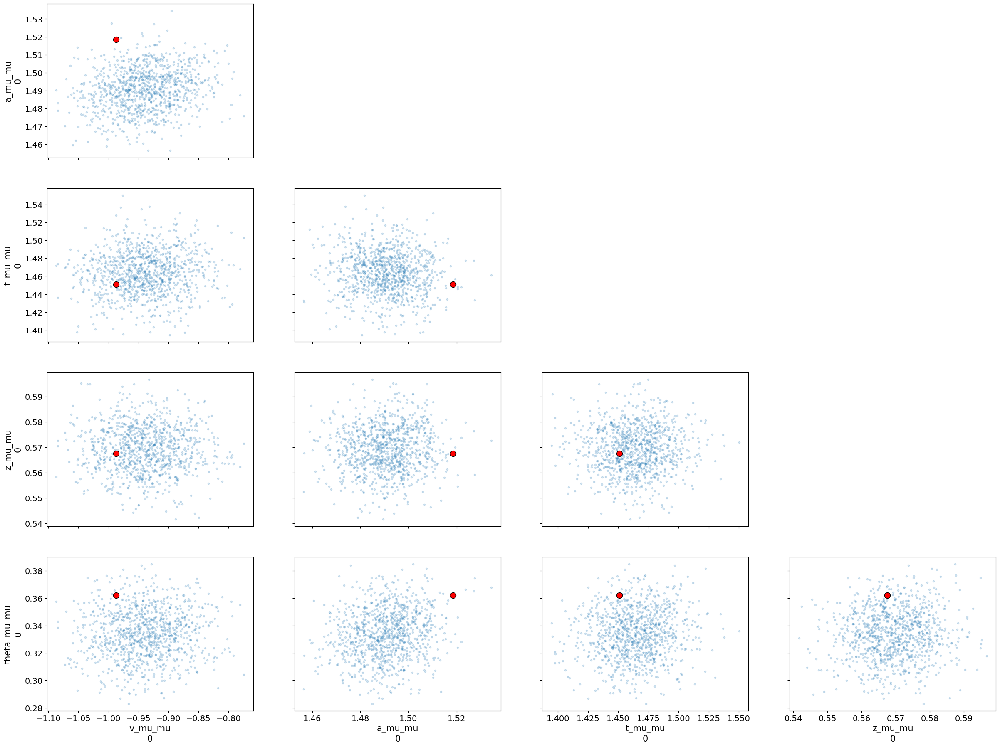

In [66]:
#subj_id = 3
az.plot_pair(az_angle_svi, 
             var_names = ['v_mu_mu', 'a_mu_mu', 't_mu_mu', 'z_mu_mu', 'theta_mu_mu'], 
             scatter_kwargs = {'alpha': 0.2},
             reference_values = {'v_mu_mu 0': param_dict['v_mu'],
                                 'a_mu_mu 0': param_dict['a_mu'],
                                 't_mu_mu 0': param_dict['t_mu'],
                                 'z_mu_mu 0': param_dict['z_mu'],
                                 'theta_mu_mu 0': param_dict['theta_mu']},
             reference_values_kwargs = {'color': 'red',
                                        'marker': 'o',
                                        'ms': 10})

array([[<AxesSubplot:ylabel='a_subj\n0'>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>],
       [<AxesSubplot:ylabel='z_subj\n0'>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>],
       [<AxesSubplot:ylabel='t_subj\n0'>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>],
       [<AxesSubplot:xlabel='v_subj\n0', ylabel='theta_subj\n0'>,
        <AxesSubplot:xlabel='a_subj\n0'>,
        <AxesSubplot:xlabel='z_subj\n0'>,
        <AxesSubplot:xlabel='t_subj\n0'>]], dtype=object)

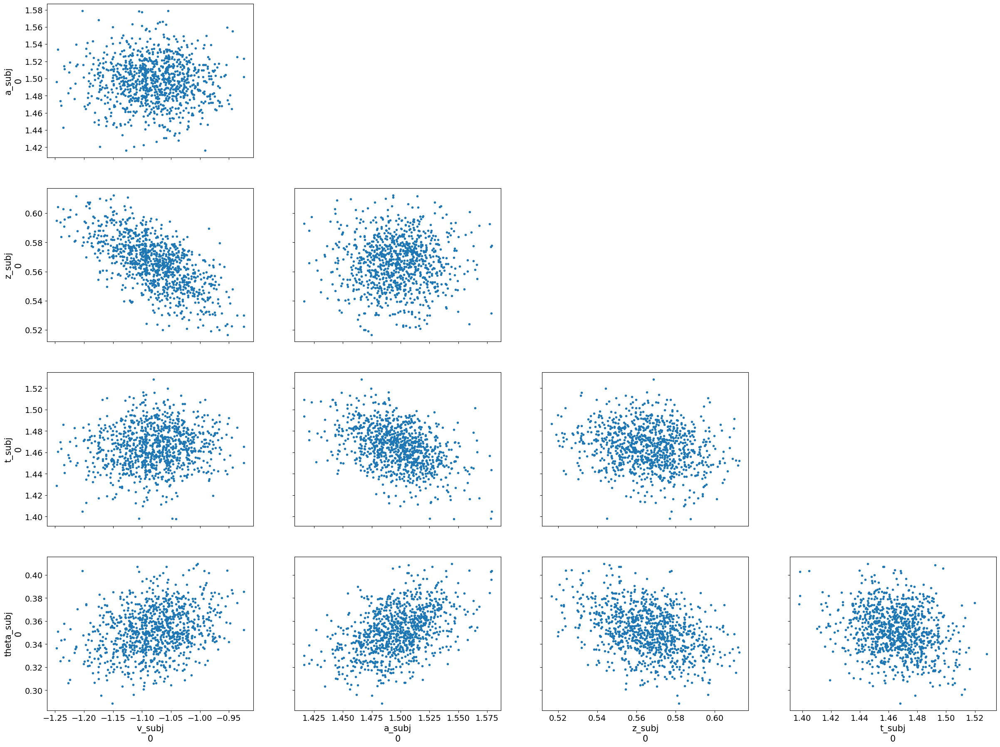

In [67]:
az.plot_pair(az_angle_svi, var_names = ['v_subj', 'a_subj', 'z_subj', 't_subj', 'theta_subj'], coords = {'t_subj_dim_0': [0],
                                                                                      'a_subj_dim_0': [0],
                                                                                      'z_subj_dim_0': [0],
                                                                                      'v_subj_dim_0': [0],
                                                                                      'theta_subj_dim_0': [0]})

In [335]:
az_angle_svi

Inference data with groups:
	> posterior

(array([ 1.,  0.,  0.,  0.,  0.,  0.,  3.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  3.,  1.,  0.,  0.,  1.,  2.,  4.,  3.,
         2.,  6.,  5.,  4.,  4.,  7.,  4., 11.,  8., 11., 16., 14., 17.,
        18., 23., 19., 30., 31., 49., 49., 57., 44., 36., 17.]),
 array([-5.0829086 , -4.9959316 , -4.908954  , -4.821977  , -4.735     ,
        -4.648023  , -4.5610456 , -4.4740686 , -4.3870916 , -4.3001146 ,
        -4.213137  , -4.12616   , -4.039183  , -3.952206  , -3.865229  ,
        -3.7782516 , -3.6912746 , -3.6042974 , -3.5173204 , -3.4303432 ,
        -3.3433661 , -3.256389  , -3.169412  , -3.0824347 , -2.9954576 ,
        -2.9084804 , -2.8215034 , -2.7345262 , -2.6475492 , -2.560572  ,
        -2.473595  , -2.3866177 , -2.2996407 , -2.2126634 , -2.1256864 ,
        -2.0387092 , -1.951732  , -1.8647549 , -1.7777778 , -1.6908007 ,
        -1.6038235 , -1.5168464 , -1.4298693 , -1.3428922 , -1.255915  ,
        -1.1689379 , -1.0819608 , -0.9949837 , -0.90800655,

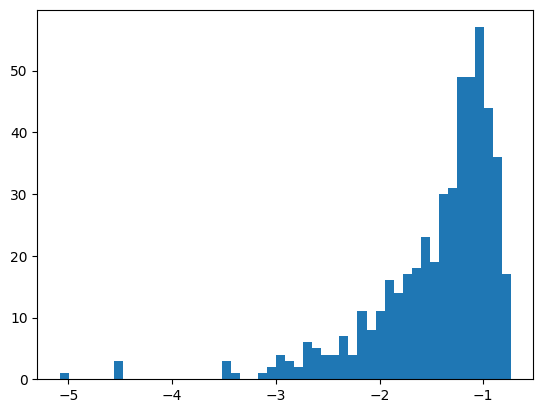

In [41]:
plt.hist(svi_samples['obs'][0, :, 0, 0].numpy() * svi_samples['obs'][0, :, 0, 1].numpy(),
         bins = 50)

(array([  3.,  14.,  71., 171., 281., 232., 140.,  69.,  16.,   3.]),
 array([-0.0683161 ,  0.04809742,  0.16451094,  0.28092447,  0.39733797,
         0.5137515 ,  0.63016504,  0.7465786 ,  0.86299205,  0.9794056 ,
         1.0958191 ], dtype=float32),
 <BarContainer object of 10 artists>)

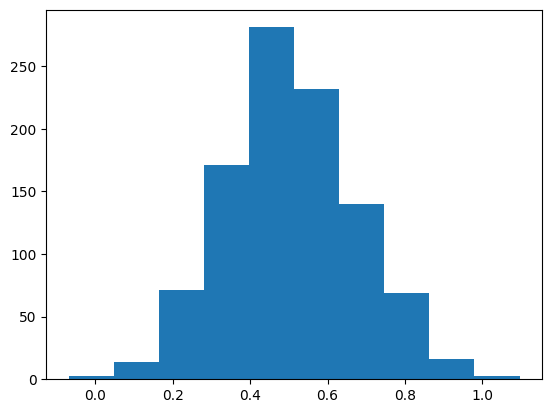

In [52]:
plt.hist(svi_samples['t_subj'][:, 0, 5].numpy())

In [118]:
svi_samples['z_subj'].squeeze().numpy().mean(axis = 0)

array([0.29455552, 0.39044872, 0.32149148, 0.23241293, 0.18667804,
       0.3889286 , 0.3188563 , 0.32132903, 0.44829404, 0.30164993,
       0.532676  , 0.268578  , 0.17854626, 0.40562153, 0.4058106 ,
       0.5709354 , 0.35899097, 0.33516625, 0.36299092, 0.6495979 ],
      dtype=float32)

In [117]:
param_dict['z_subj']

array([0.33971325, 0.39806026, 0.38168773, 0.2767476 , 0.22054273,
       0.43482217, 0.38545933, 0.38500404, 0.5030332 , 0.36543238,
       0.5792659 , 0.29958847, 0.20919076, 0.4209274 , 0.4723584 ,
       0.5764671 , 0.39885688, 0.40856022, 0.42558002, 0.6389354 ],
      dtype=float32)

0.08247703


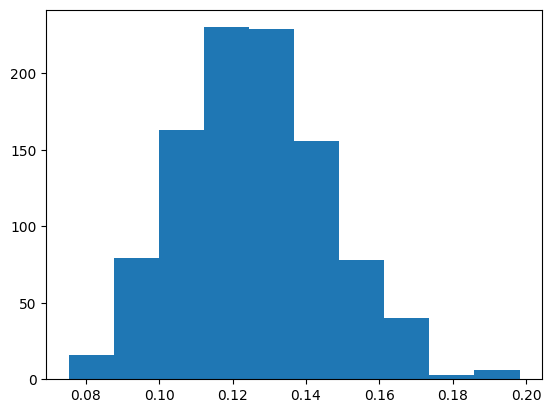

In [119]:
plt.hist(svi_samples['z_mu_std'].squeeze().numpy())
print(param_dict['z_std'])

In [104]:
param_dict['a_subj']

array([1.955956 , 1.9602058, 1.9308405, 1.8742312, 1.9456055, 2.035757 ,
       1.8536155, 1.9160961, 1.9404643, 1.9581065, 1.9886978, 1.9855695,
       1.9948559, 1.9978963, 1.9252195, 1.9465408, 1.9307809, 1.9640427,
       1.935189 , 1.9157486], dtype=float32)

In [96]:
param_dict.keys()


dict_keys(['v_mu', 'v_std', 'v_subj', 'a_mu', 'a_std', 'a_subj', 'z_mu', 'z_std', 'z_subj', 't_mu', 't_std', 't_subj'])

(array([ 35., 160., 255., 249., 169.,  87.,  32.,  12.,   0.,   1.]),
 array([0.0755928 , 0.10796805, 0.1403433 , 0.17271854, 0.20509379,
        0.23746902, 0.26984426, 0.3022195 , 0.33459476, 0.36697   ,
        0.39934525], dtype=float32),
 <BarContainer object of 10 artists>)

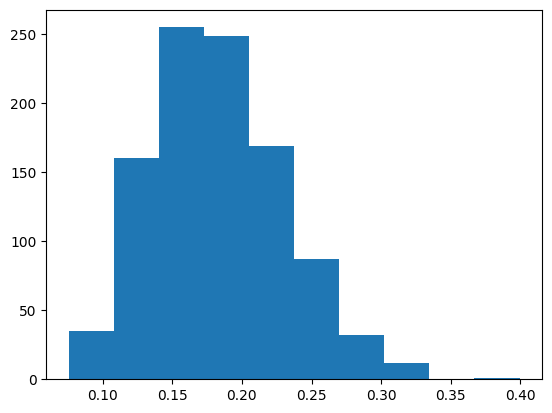

In [176]:
plt.hist(svi_samples['t_mu_std'].squeeze().numpy())

(array([  4.,  23.,  89., 171., 249., 271., 136.,  45.,  11.,   1.]),
 array([0.53129476, 0.5350916 , 0.53888845, 0.5426853 , 0.5464821 ,
        0.5502789 , 0.5540758 , 0.5578726 , 0.5616694 , 0.5654663 ,
        0.5692631 ], dtype=float32),
 <BarContainer object of 10 artists>)

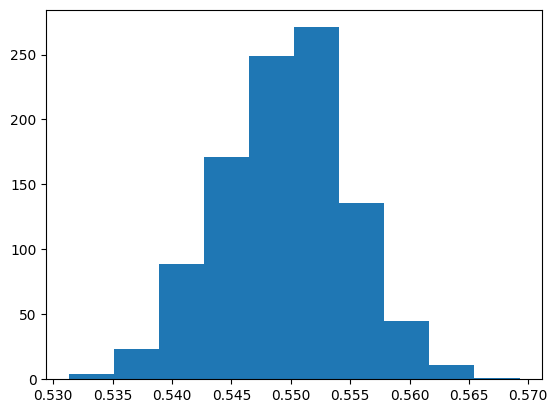

In [158]:
plt.hist(svi_samples['z_mu_mu'].squeeze().numpy())

(array([  2.,   0.,  10.,  63., 172., 272., 288., 139.,  45.,   9.]),
 array([-0.10400686, -0.06829887, -0.03259088,  0.00311711,  0.0388251 ,
         0.07453309,  0.11024108,  0.14594907,  0.18165706,  0.21736504,
         0.25307304], dtype=float32),
 <BarContainer object of 10 artists>)

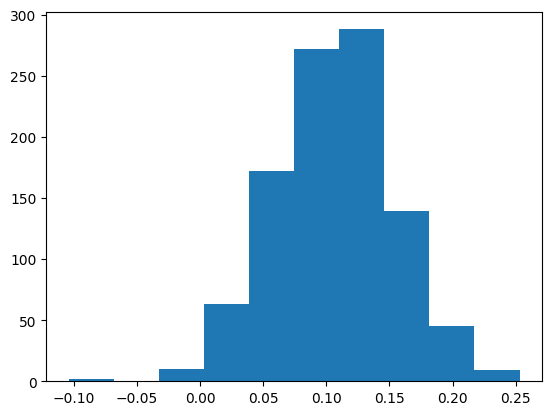

In [168]:
plt.hist(svi_samples['subj_v_mu'].squeeze().numpy()[:, 19])

/users/afengler/data/software/miniconda3/envs/lanfactory/lib/python3.7/site-packages/ipykernel_launcher.py:2: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  
Guessed max_plate_nesting = 2
Step 0 out of 2000, Elbo loss: 13417.54596272111
Step 100 out of 2000, Elbo loss: -11702.706844300032
Step 200 out of 2000, Elbo loss: -21727.80176898837
Step 300 out of 2000, Elbo loss: -35647.11387595534
Step 400 out of 2000, Elbo loss: -20409.475065857172
Step 500 out of 2000, Elbo loss: -31144.538378089666
Step 600 out of 2000, Elbo loss: -40313.98530378938
Step 700 out of 2000, Elbo loss: -40255.28565129638
Step 800 out of 2000, Elbo loss: -40573.67958423495
Step 900 out of 2000, Elbo loss: -37778.76841285825
Step 1000 out of 2000, Elbo loss: -41171.83035573363
Step 1100 out of 2000, Elbo loss: -55505.41206559539
Step 1200 out of 2000, Elbo loss: -

CPU times: user 1min 4s, sys: 32.8 s, total: 1min 37s
Wall time: 1min 37s


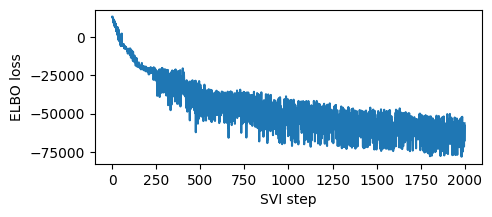

In [65]:
%%time
pyro.clear_param_store()
torch_data = torch.tensor(out)
steps = 2000

# These should be reset each training loop.
auto_guide = pyro.infer.autoguide.AutoMultivariateNormal(hierarchical_ddm_model)
adam = pyro.optim.Adam({"lr": 0.02})
#elbo = pyro.infer.Trace_ELBO(num_particles = 1, vectorize_particles = True)
elbo = pyro.infer.Trace_ELBO(num_particles = 1, vectorize_particles = True)
#elbo = pyro.infer.Trace_ELBO(num_particles = 1, vectorize_particles = True)
#svi = pyro.infer.SVI(basic_hierarchical_model, auto_guide, adam, elbo)

svi = pyro.infer.SVI(hierarchical_ddm_model, auto_guide, adam, elbo)
losses = []
for step in range(steps if not smoke_test else 2):  # Consider running for more steps.
    loss = svi.step(*(n_subjects, n_samples_by_subject, data))
    losses.append(loss)
    if step % 100 == 0:
        logging.info("Step {} out of {}, Elbo loss: {}".format(step, steps, loss))

plt.figure(figsize=(5, 2))
plt.plot(losses)
plt.xlabel("SVI step");
plt.ylabel("ELBO loss");

#predictive = pyro.infer.Predictive(basic_hierarchical_model, guide = auto_guide, num_samples = 1000)
predictive = pyro.infer.Predictive(hierarchical_ddm_model, guide = auto_guide, num_samples = 1000)
svi_samples = predictive(20, 500, data) #torch.tensor(data))

In [44]:
param_dict

{'v_mu': 0.074449174,
 'v_std': 0.16536614,
 'v_subjects': array([ 0.30066875,  0.0786009 ,  0.0090498 ,  0.2868434 ,  0.1672654 ,
         0.11409166,  0.15380824,  0.08466102, -0.10257731, -0.13609664,
         0.2265986 ,  0.24889697,  0.16379453,  0.12555781,  0.23499675,
         0.26540145,  0.14433436,  0.23968449,  0.2205535 , -0.01322781],
       dtype=float32),
 'a_mu': 0.9268145,
 'a_std': 0.06799549,
 'a_subjects': array([0.8994963 , 1.0587475 , 0.8422006 , 0.9906833 , 0.9104406 ,
        0.94522816, 0.8523227 , 1.0900949 , 0.9077819 , 1.0648998 ,
        0.92124295, 0.8439534 , 0.8719509 , 1.0164354 , 0.88746965,
        0.93239367, 1.0217301 , 1.0003774 , 0.8576929 , 0.9069599 ],
       dtype=float32),
 'z_mu': 0.55008066,
 'z_std': 0.021121053,
 'z_subjects': array([0.5237771 , 0.55651295, 0.53744227, 0.55267996, 0.53337735,
        0.5636804 , 0.5488208 , 0.5693694 , 0.5270465 , 0.5463876 ,
        0.57258046, 0.5762123 , 0.5716198 , 0.5682593 , 0.53461087,
        0.55

In [47]:
svi_samples.keys()

dict_keys(['v_mu_mu', 'v_mu_std', 'a_mu_mu', 'a_mu_std', 'z_mu_mu', 'z_mu_std', 't_mu_mu', 't_mu_std', 'subj_v_mu', 'subj_a_mu', 'subj_z_mu', 'subj_t_mu', 'obs'])

In [49]:
svi_samples['subj_v_mu'].shape

torch.Size([1000, 1, 20])

(array([  1.,  17.,  36.,  98., 208., 245., 237., 109.,  37.,  12.]),
 array([-6.69426  , -6.609806 , -6.5253515, -6.4408975, -6.3564434,
        -6.271989 , -6.187535 , -6.1030807, -6.0186267, -5.934172 ,
        -5.849718 ], dtype=float32),
 <BarContainer object of 10 artists>)

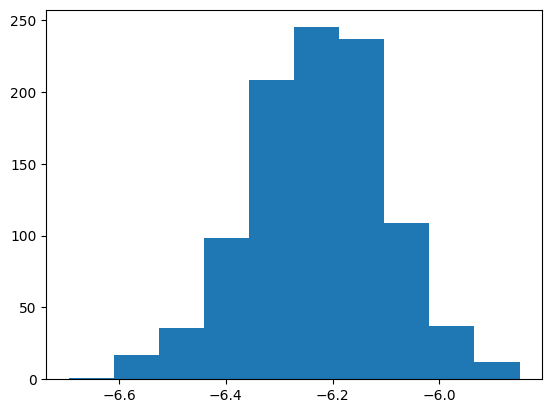

In [60]:
plt.hist(svi_samples['subj_v_mu'].squeeze()[:, 10].numpy())

In [ ]:
import pyro.distributions as dist
import pyro.distributions.constraints as constraints

def basic_hierarchical_model(num_subjects, num_trials, data):
    g_mu_mu = pyro.sample("g_mu_mu", dist.Normal(0., 100.))
    g_mu_std = pyro.sample("g_mu_std", dist.HalfNormal(100.))
    #g_mu_std = pyro.sample("g_mu_std", dist.HalfNormal(100.))
    #g_std_mu = pyro.sample("g_std_mu", dist.HalfNormal(100.))
    #g_std_std = pyro.sample("g_std_std", dist.HalfNormal(100.))
    
    with pyro.plate("subjects", num_subjects) as subjects_plate:
        subj_mu = pyro.sample("subj_mu", dist.Normal(g_mu_mu, g_mu_std))
        #subj_std = pyro.sample("subj_std", dist.LogNormal(g_std_mu, g_std_std))
        with pyro.plate("data", num_trials) as data_plate:
            return pyro.sample("obs", dist.Normal(subj_mu, torch.tensor(10)), obs = data)

## Historical

In [49]:
#svi_samples['v'].squeeze().numpy()

(array([ 0.34003695,  0.72865061,  1.65160805,  5.3920145 , 10.44399206,
        15.4473929 ,  9.18099767,  3.49752292,  1.16584097,  0.72865061]),
 array([0.36340134, 0.38398733, 0.40457333, 0.42515933, 0.44574533,
        0.46633133, 0.48691732, 0.50750332, 0.52808932, 0.54867532,
        0.56926132]),
 [<matplotlib.patches.Polygon at 0x7fd30748e910>])

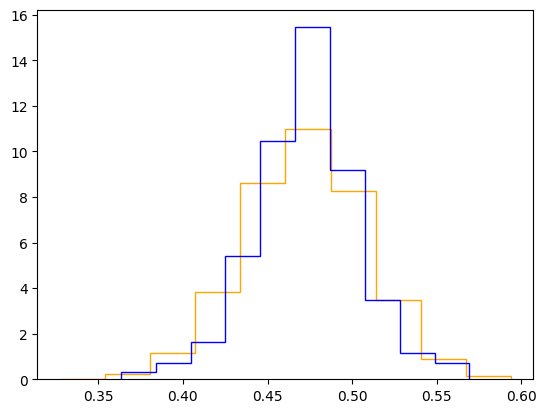

In [61]:
plt.hist(svi_samples['v'].squeeze().numpy(), histtype = 'step', color = 'orange', label = 'variational', density = True)
plt.hist(hmc_samples['v'], histtype = 'step', color = 'blue', label = 'hmc', density = True)

{'g_mu_mu': array([0]), 'g_mu_std': array([0.25]), 'subj_mu': array([ 2.77138678e-04, -7.23860173e-02, -2.79016576e-01, -3.22068919e-03,
       -9.45903661e-02, -1.20283841e-01, -3.79332795e-01, -1.22717995e-01,
       -6.01701446e-02, -1.61986865e-01,  1.58972770e-01,  4.35029326e-01,
        7.41705544e-02,  1.76875915e-01,  4.55703941e-01,  1.07692257e-01,
        3.85682406e-01, -2.25180293e-01, -3.42812526e-02,  3.24394753e-01])}
g_mu_mu
torch.Size([1000, 1, 1])
[0]
0


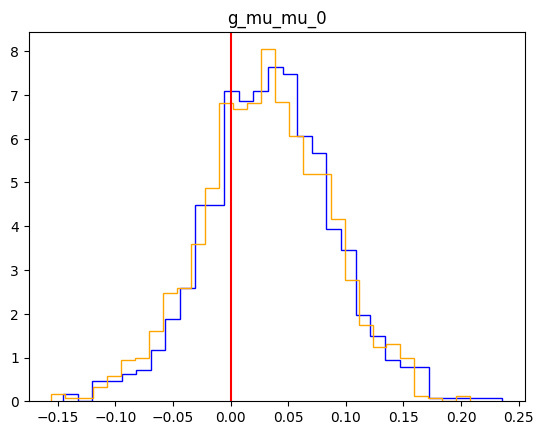

Warmup:   0%|          | 0/2200 [14:14, ?it/s]

{'g_mu_mu': array([0]), 'g_mu_std': array([0.25]), 'subj_mu': array([ 2.77138678e-04, -7.23860173e-02, -2.79016576e-01, -3.22068919e-03,
       -9.45903661e-02, -1.20283841e-01, -3.79332795e-01, -1.22717995e-01,
       -6.01701446e-02, -1.61986865e-01,  1.58972770e-01,  4.35029326e-01,
        7.41705544e-02,  1.76875915e-01,  4.55703941e-01,  1.07692257e-01,
        3.85682406e-01, -2.25180293e-01, -3.42812526e-02,  3.24394753e-01])}
g_mu_std
torch.Size([1000, 1, 1])
[0.25]
0.25


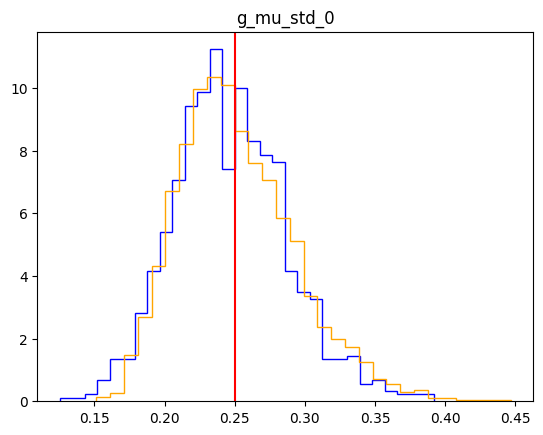

{'g_mu_mu': array([0]), 'g_mu_std': array([0.25]), 'subj_mu': array([ 2.77138678e-04, -7.23860173e-02, -2.79016576e-01, -3.22068919e-03,
       -9.45903661e-02, -1.20283841e-01, -3.79332795e-01, -1.22717995e-01,
       -6.01701446e-02, -1.61986865e-01,  1.58972770e-01,  4.35029326e-01,
        7.41705544e-02,  1.76875915e-01,  4.55703941e-01,  1.07692257e-01,
        3.85682406e-01, -2.25180293e-01, -3.42812526e-02,  3.24394753e-01])}
subj_mu
torch.Size([1000, 1, 20])
[ 2.77138678e-04 -7.23860173e-02 -2.79016576e-01 -3.22068919e-03
 -9.45903661e-02 -1.20283841e-01 -3.79332795e-01 -1.22717995e-01
 -6.01701446e-02 -1.61986865e-01  1.58972770e-01  4.35029326e-01
  7.41705544e-02  1.76875915e-01  4.55703941e-01  1.07692257e-01
  3.85682406e-01 -2.25180293e-01 -3.42812526e-02  3.24394753e-01]
0.0002771386780527433


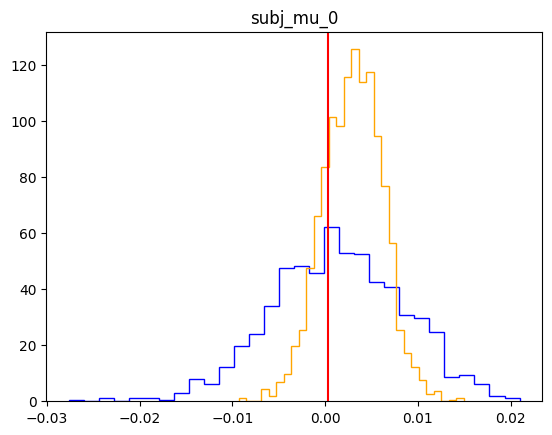

[ 2.77138678e-04 -7.23860173e-02 -2.79016576e-01 -3.22068919e-03
 -9.45903661e-02 -1.20283841e-01 -3.79332795e-01 -1.22717995e-01
 -6.01701446e-02 -1.61986865e-01  1.58972770e-01  4.35029326e-01
  7.41705544e-02  1.76875915e-01  4.55703941e-01  1.07692257e-01
  3.85682406e-01 -2.25180293e-01 -3.42812526e-02  3.24394753e-01]
-0.0723860173125497


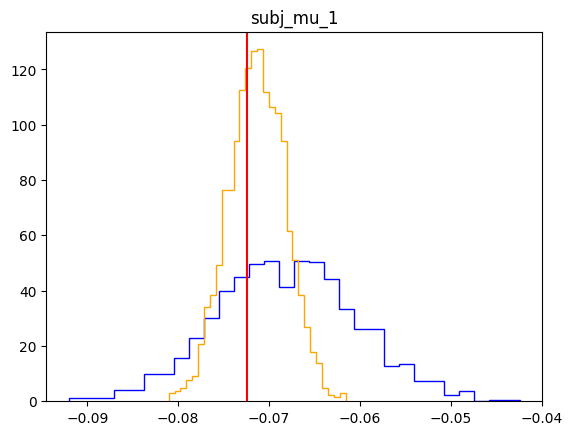

[ 2.77138678e-04 -7.23860173e-02 -2.79016576e-01 -3.22068919e-03
 -9.45903661e-02 -1.20283841e-01 -3.79332795e-01 -1.22717995e-01
 -6.01701446e-02 -1.61986865e-01  1.58972770e-01  4.35029326e-01
  7.41705544e-02  1.76875915e-01  4.55703941e-01  1.07692257e-01
  3.85682406e-01 -2.25180293e-01 -3.42812526e-02  3.24394753e-01]
-0.27901657576610356


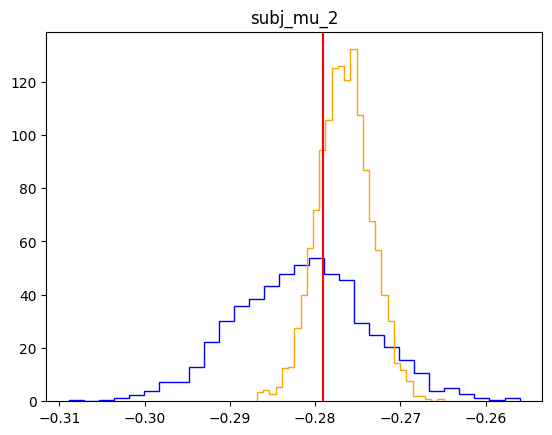

[ 2.77138678e-04 -7.23860173e-02 -2.79016576e-01 -3.22068919e-03
 -9.45903661e-02 -1.20283841e-01 -3.79332795e-01 -1.22717995e-01
 -6.01701446e-02 -1.61986865e-01  1.58972770e-01  4.35029326e-01
  7.41705544e-02  1.76875915e-01  4.55703941e-01  1.07692257e-01
  3.85682406e-01 -2.25180293e-01 -3.42812526e-02  3.24394753e-01]
-0.0032206891864485737


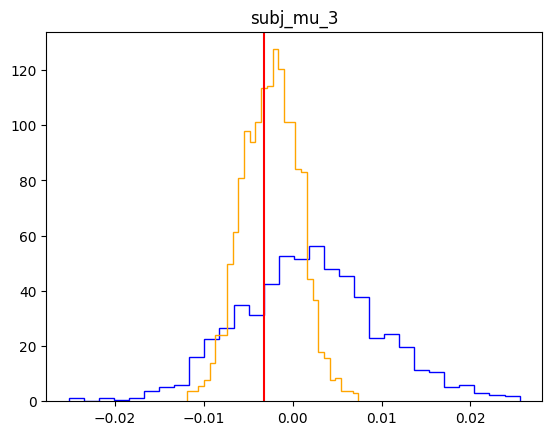

[ 2.77138678e-04 -7.23860173e-02 -2.79016576e-01 -3.22068919e-03
 -9.45903661e-02 -1.20283841e-01 -3.79332795e-01 -1.22717995e-01
 -6.01701446e-02 -1.61986865e-01  1.58972770e-01  4.35029326e-01
  7.41705544e-02  1.76875915e-01  4.55703941e-01  1.07692257e-01
  3.85682406e-01 -2.25180293e-01 -3.42812526e-02  3.24394753e-01]
-0.09459036605197953


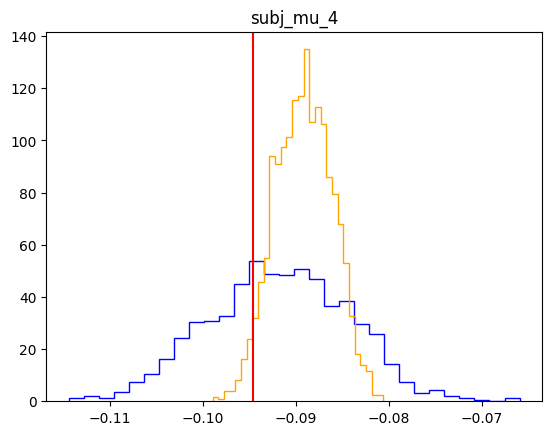

[ 2.77138678e-04 -7.23860173e-02 -2.79016576e-01 -3.22068919e-03
 -9.45903661e-02 -1.20283841e-01 -3.79332795e-01 -1.22717995e-01
 -6.01701446e-02 -1.61986865e-01  1.58972770e-01  4.35029326e-01
  7.41705544e-02  1.76875915e-01  4.55703941e-01  1.07692257e-01
  3.85682406e-01 -2.25180293e-01 -3.42812526e-02  3.24394753e-01]
-0.12028384071922597


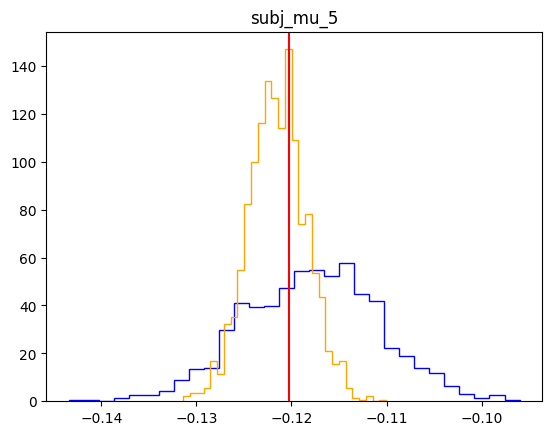

[ 2.77138678e-04 -7.23860173e-02 -2.79016576e-01 -3.22068919e-03
 -9.45903661e-02 -1.20283841e-01 -3.79332795e-01 -1.22717995e-01
 -6.01701446e-02 -1.61986865e-01  1.58972770e-01  4.35029326e-01
  7.41705544e-02  1.76875915e-01  4.55703941e-01  1.07692257e-01
  3.85682406e-01 -2.25180293e-01 -3.42812526e-02  3.24394753e-01]
-0.379332794698918


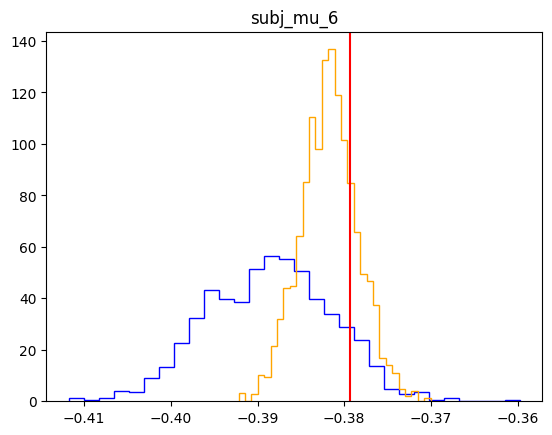

[ 2.77138678e-04 -7.23860173e-02 -2.79016576e-01 -3.22068919e-03
 -9.45903661e-02 -1.20283841e-01 -3.79332795e-01 -1.22717995e-01
 -6.01701446e-02 -1.61986865e-01  1.58972770e-01  4.35029326e-01
  7.41705544e-02  1.76875915e-01  4.55703941e-01  1.07692257e-01
  3.85682406e-01 -2.25180293e-01 -3.42812526e-02  3.24394753e-01]
-0.12271799530543662


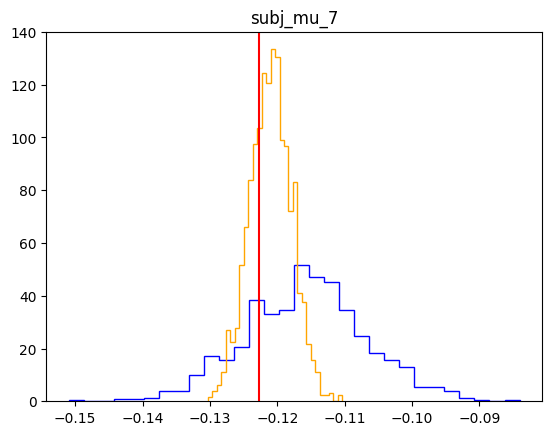

[ 2.77138678e-04 -7.23860173e-02 -2.79016576e-01 -3.22068919e-03
 -9.45903661e-02 -1.20283841e-01 -3.79332795e-01 -1.22717995e-01
 -6.01701446e-02 -1.61986865e-01  1.58972770e-01  4.35029326e-01
  7.41705544e-02  1.76875915e-01  4.55703941e-01  1.07692257e-01
  3.85682406e-01 -2.25180293e-01 -3.42812526e-02  3.24394753e-01]
-0.06017014462566819


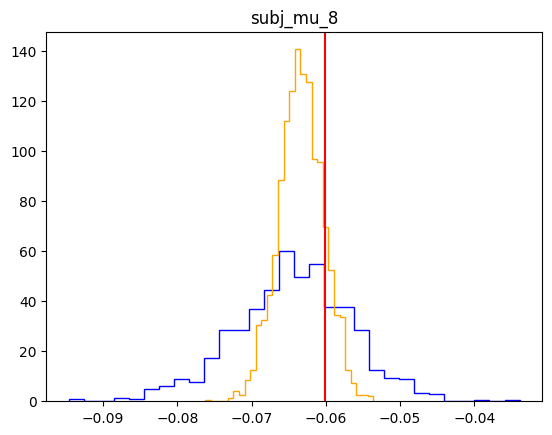

[ 2.77138678e-04 -7.23860173e-02 -2.79016576e-01 -3.22068919e-03
 -9.45903661e-02 -1.20283841e-01 -3.79332795e-01 -1.22717995e-01
 -6.01701446e-02 -1.61986865e-01  1.58972770e-01  4.35029326e-01
  7.41705544e-02  1.76875915e-01  4.55703941e-01  1.07692257e-01
  3.85682406e-01 -2.25180293e-01 -3.42812526e-02  3.24394753e-01]
-0.1619868650554009


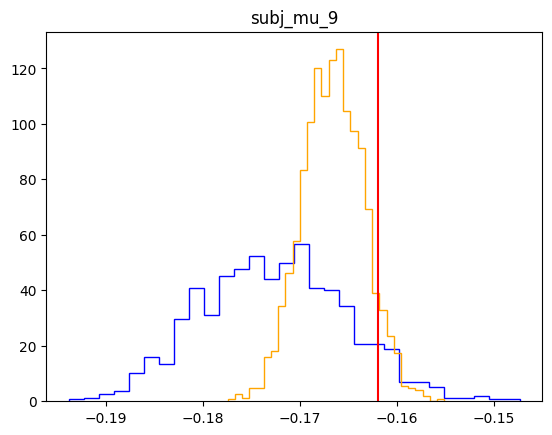

[ 2.77138678e-04 -7.23860173e-02 -2.79016576e-01 -3.22068919e-03
 -9.45903661e-02 -1.20283841e-01 -3.79332795e-01 -1.22717995e-01
 -6.01701446e-02 -1.61986865e-01  1.58972770e-01  4.35029326e-01
  7.41705544e-02  1.76875915e-01  4.55703941e-01  1.07692257e-01
  3.85682406e-01 -2.25180293e-01 -3.42812526e-02  3.24394753e-01]
0.15897277006170793


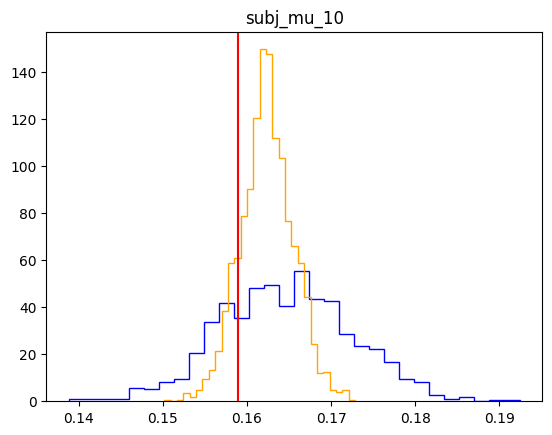

[ 2.77138678e-04 -7.23860173e-02 -2.79016576e-01 -3.22068919e-03
 -9.45903661e-02 -1.20283841e-01 -3.79332795e-01 -1.22717995e-01
 -6.01701446e-02 -1.61986865e-01  1.58972770e-01  4.35029326e-01
  7.41705544e-02  1.76875915e-01  4.55703941e-01  1.07692257e-01
  3.85682406e-01 -2.25180293e-01 -3.42812526e-02  3.24394753e-01]
0.43502932632129415


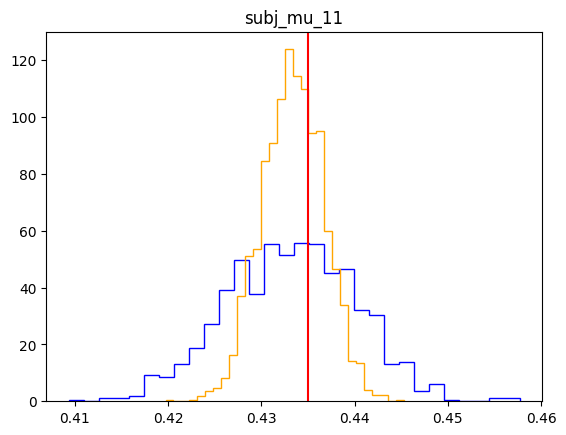

[ 2.77138678e-04 -7.23860173e-02 -2.79016576e-01 -3.22068919e-03
 -9.45903661e-02 -1.20283841e-01 -3.79332795e-01 -1.22717995e-01
 -6.01701446e-02 -1.61986865e-01  1.58972770e-01  4.35029326e-01
  7.41705544e-02  1.76875915e-01  4.55703941e-01  1.07692257e-01
  3.85682406e-01 -2.25180293e-01 -3.42812526e-02  3.24394753e-01]
0.07417055442785082


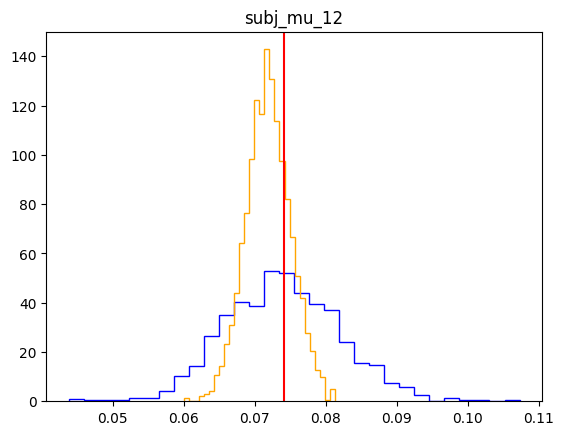

[ 2.77138678e-04 -7.23860173e-02 -2.79016576e-01 -3.22068919e-03
 -9.45903661e-02 -1.20283841e-01 -3.79332795e-01 -1.22717995e-01
 -6.01701446e-02 -1.61986865e-01  1.58972770e-01  4.35029326e-01
  7.41705544e-02  1.76875915e-01  4.55703941e-01  1.07692257e-01
  3.85682406e-01 -2.25180293e-01 -3.42812526e-02  3.24394753e-01]
0.17687591546297207


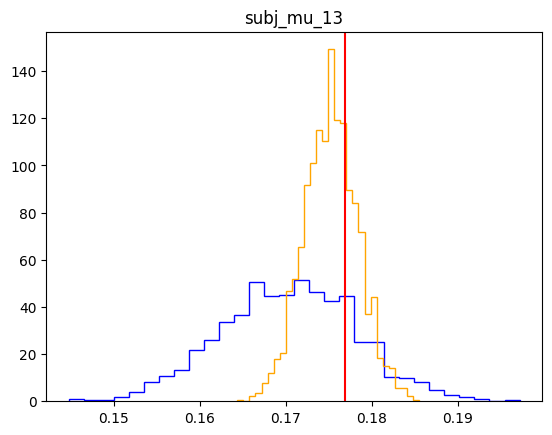

[ 2.77138678e-04 -7.23860173e-02 -2.79016576e-01 -3.22068919e-03
 -9.45903661e-02 -1.20283841e-01 -3.79332795e-01 -1.22717995e-01
 -6.01701446e-02 -1.61986865e-01  1.58972770e-01  4.35029326e-01
  7.41705544e-02  1.76875915e-01  4.55703941e-01  1.07692257e-01
  3.85682406e-01 -2.25180293e-01 -3.42812526e-02  3.24394753e-01]
0.45570394077955917


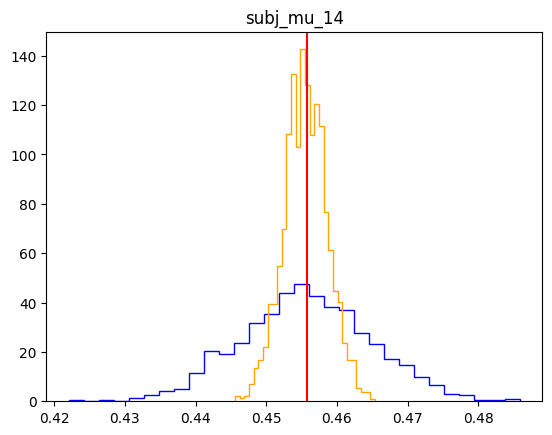

[ 2.77138678e-04 -7.23860173e-02 -2.79016576e-01 -3.22068919e-03
 -9.45903661e-02 -1.20283841e-01 -3.79332795e-01 -1.22717995e-01
 -6.01701446e-02 -1.61986865e-01  1.58972770e-01  4.35029326e-01
  7.41705544e-02  1.76875915e-01  4.55703941e-01  1.07692257e-01
  3.85682406e-01 -2.25180293e-01 -3.42812526e-02  3.24394753e-01]
0.10769225737472315


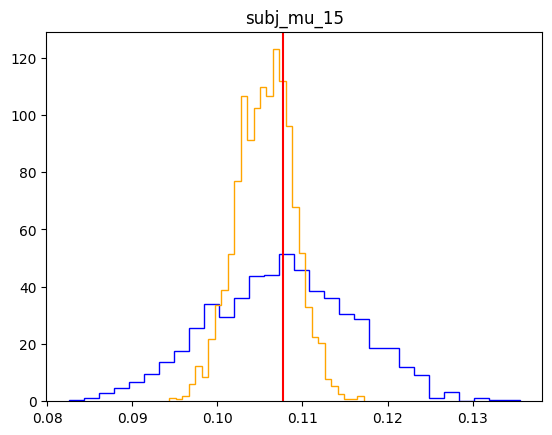

[ 2.77138678e-04 -7.23860173e-02 -2.79016576e-01 -3.22068919e-03
 -9.45903661e-02 -1.20283841e-01 -3.79332795e-01 -1.22717995e-01
 -6.01701446e-02 -1.61986865e-01  1.58972770e-01  4.35029326e-01
  7.41705544e-02  1.76875915e-01  4.55703941e-01  1.07692257e-01
  3.85682406e-01 -2.25180293e-01 -3.42812526e-02  3.24394753e-01]
0.3856824063720217


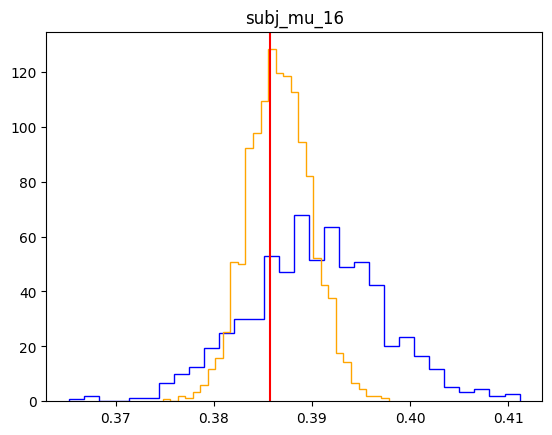

[ 2.77138678e-04 -7.23860173e-02 -2.79016576e-01 -3.22068919e-03
 -9.45903661e-02 -1.20283841e-01 -3.79332795e-01 -1.22717995e-01
 -6.01701446e-02 -1.61986865e-01  1.58972770e-01  4.35029326e-01
  7.41705544e-02  1.76875915e-01  4.55703941e-01  1.07692257e-01
  3.85682406e-01 -2.25180293e-01 -3.42812526e-02  3.24394753e-01]
-0.22518029285417218


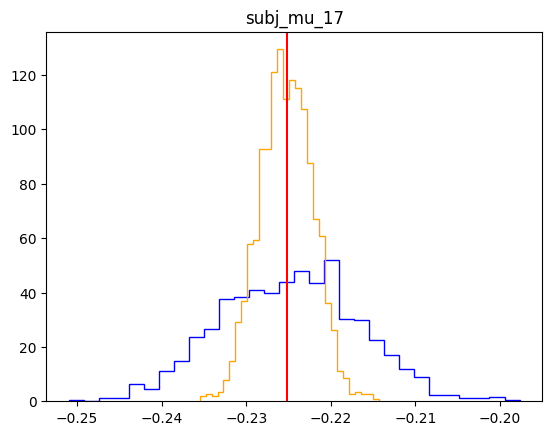

[ 2.77138678e-04 -7.23860173e-02 -2.79016576e-01 -3.22068919e-03
 -9.45903661e-02 -1.20283841e-01 -3.79332795e-01 -1.22717995e-01
 -6.01701446e-02 -1.61986865e-01  1.58972770e-01  4.35029326e-01
  7.41705544e-02  1.76875915e-01  4.55703941e-01  1.07692257e-01
  3.85682406e-01 -2.25180293e-01 -3.42812526e-02  3.24394753e-01]
-0.034281252594501335


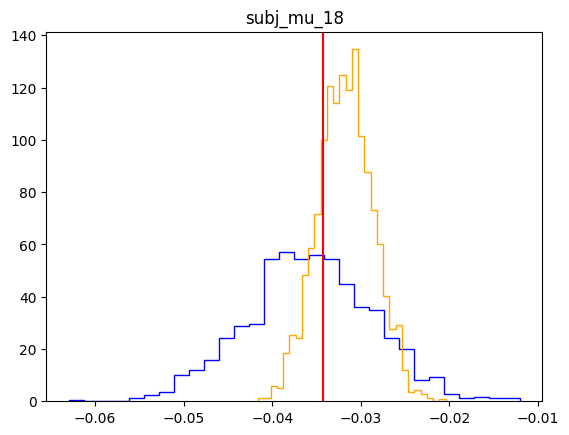

[ 2.77138678e-04 -7.23860173e-02 -2.79016576e-01 -3.22068919e-03
 -9.45903661e-02 -1.20283841e-01 -3.79332795e-01 -1.22717995e-01
 -6.01701446e-02 -1.61986865e-01  1.58972770e-01  4.35029326e-01
  7.41705544e-02  1.76875915e-01  4.55703941e-01  1.07692257e-01
  3.85682406e-01 -2.25180293e-01 -3.42812526e-02  3.24394753e-01]
0.3243947530200125


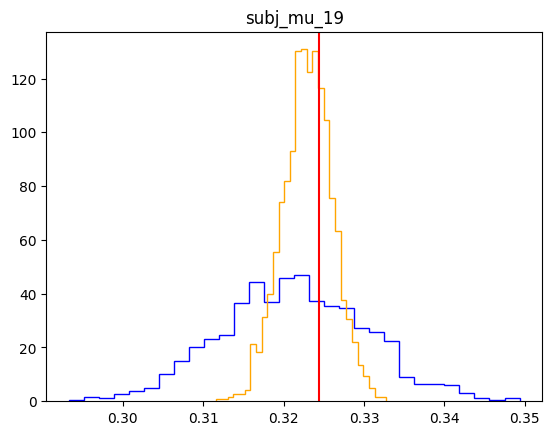

{'g_mu_mu': array([0]), 'g_mu_std': array([0.25]), 'subj_mu': array([ 2.77138678e-04, -7.23860173e-02, -2.79016576e-01, -3.22068919e-03,
       -9.45903661e-02, -1.20283841e-01, -3.79332795e-01, -1.22717995e-01,
       -6.01701446e-02, -1.61986865e-01,  1.58972770e-01,  4.35029326e-01,
        7.41705544e-02,  1.76875915e-01,  4.55703941e-01,  1.07692257e-01,
        3.85682406e-01, -2.25180293e-01, -3.42812526e-02,  3.24394753e-01])}
obs
torch.Size([1000, 1000, 20])


In [21]:
# tmp_dict = {'g_mu_mu': np.array(global_mean_mean, ndmin = 1),
#             'g_mu_std':np.array(global_mean_std, ndmin = 1),
#             'g_std_mu': np.array(global_std_mean, ndmin = 1),
#             'g_std_std': np.array(global_std_std, ndmin = 1),
#             'subj_std': np.array(subj_std, ndmin = 1),
#             'subj_mu': np.array(subj_mean, ndmin = 1),
#             }

tmp_dict = {'g_mu_mu': np.array(global_mean_mean, ndmin = 1),
            'g_mu_std': np.array(global_mean_std, ndmin = 1),
            'subj_mu': np.array(subj_mean, ndmin = 1),
            }

for key_ in svi_samples.keys():
    print(tmp_dict)
    #print(svi_samples[key_].numpy().shape[-1])
    print(key_)
    print(svi_samples[key_].shape)
    if key_ is not 'obs':
        for i in range(svi_samples[key_].numpy().shape[-1]):
            samples = svi_samples[key_].numpy().squeeze()
            hmc_samples = hmc_samples_new[key_].squeeze()
            shape_n = len(samples.shape)
            if shape_n == 2:
                tmp_samples = samples[:, i]
                tmp_hmc_samples = hmc_samples[:, i]
            else:
                tmp_samples = samples[:]
                tmp_hmc_samples = hmc_samples[:]
            plt.hist(tmp_samples, histtype = 'step', color = 'blue', bins = 30, density = True)
            plt.hist(tmp_hmc_samples, histtype = 'step', color = 'orange', bins = 30, density = True)
            print(tmp_dict[key_])
            print(tmp_dict[key_][i])
            plt.axvline(x = tmp_dict[key_][i], color = 'red')
            plt.title(key_ + '_' + str(i))
            plt.show()